# 2020.05.27 statfacs grid
-----
* Statfacs initialized with the loadings from the previous minibatch
* Building an online model using statfacs as both features and residualization target
* Comprehensive grid of statfacs

### Version Info
* madmax   `efff1e0` `fcd720b`
* research `c372925` `f2bcf69` `6e3c1d4`

---
## History
##### `etf_technical_2020.05.19 (stat factors).ipynb`
* Computed statistical factors using
    + random initialization  in minibatches
    + iteratively added new statfacs - maintaining orthogonality to previous statfacs
    + different kappas and window lenghts
* Established baselines for the model withotu statfacs
* Ran some basic regressions with statfacs (not residualization)



##### `etf_technical_2020.05.17 (features profiling).ipynb`. 
* adding ta-lib like features for 500 ETFs. Feature profiled, online learning model

##### `etf_technical_2020.05.13`
* I had gotten omega weighting done (seems to add a little bit but not much)


In [1]:
# preamble
%alias_magic  nbagg matplotlib -p nbagg
%alias_magic  inline matplotlib -p inline
%load_ext memory_profiler
%load_ext line_profiler

from pylab import *
from madmax.api import *
mx = mx.reload()
mxtr = mxtr.reload()
plt.style.use('seaborn-whitegrid')

###################################################################
# Interactive configuration 
# When running a config grid this will throw a FrozenException 
# and the grid Config will be used
###################################################################
try:
    mx.Config.name = 'etf_technical/technical/2020.05.27'
    mx.Config.mode = 'interactive'
    mx.Config.hps = mx.HPSet()
    mx.Config.code = 'etf_technical_2020.05.27 (more statfacs).ipynb'
    disp( 'Running interactive configuration ', h=2 )        
except mx.Config.FrozenException:
    if mx.Config.mode != 'grid':
        raise RuntimeError( 'An unexpected configruation encountered' )
    disp( 'Running a grid configuration ', h=2 )

device = 'cuda'
dtype = tr.float32

mx.Config.start()

# to run run a grid of hyperparameters ...
####################################
# # hyperparameters
# mx.Config.hps = fr.HPSet( 
# )
# mx.Config.code = ''
# # configs = []
# # for obs_weight in ['no_weight', 'dollar_weight', 'log_weight']:
# #     cfg = fr.Config.clone()
# #     cf
# #     cfg.hps = cfg.hps.clone( obs_weight=obs_weight )
# #     cfg.freeze()
# #     display_html( cfg )
# #     configs.append( cfg )
# # notebook = fr.Config.run_grid( configs, outfile=fr.Config.uri+'/../cadre_price_index.20200302 - weight_grid_results.ipynb', n_jobs=None )



Created `%nbagg` as an alias for `%matplotlib nbagg`.
Created `%inline` as an alias for `%matplotlib inline`.


<IPython.core.display.Javascript object>

<h1> Config etf_technical/technical/2020.05.27 </h1>
<b> hash</b>: none </h4>
<b> mode </b>: interactive
<b> frozen </b>: False
<b> uri </b>: /home/fj/experiments/etf_technical/technical/2020.05.27/none
<h3> Hyperparameters </h3>
HPSet(
	)<h3> Code </h3>
<b> format </b>: .ipynb
<b> code </b> : /local/cloud/code/research/etf_technical/etf_technical_2020.05.27 (more statfacs).ipynb

<IPython.core.display.Javascript object>


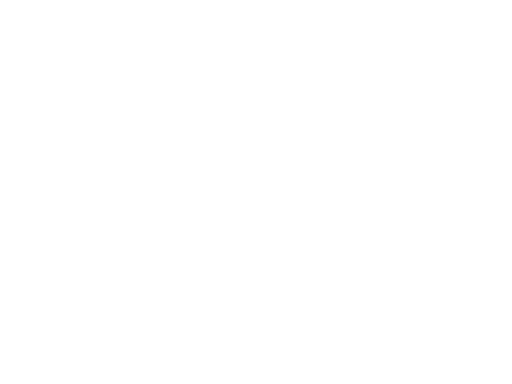

In [2]:
# identify the universe of ETFS
#############################################################
%nbagg
from research.etf_technical import etf_data_apr2020 as etfd; reload( etfd )

hps = mx.HPSet(
    start = '20070101',    
    end='20200501',
    INTS_PER_DAY = 13,
    universe = mx.HPSet(
        start = '20100101',
        end='20200401',
        min_count=2000,
        min_dollar_vol=1e5
    )
)
etf_stats = etfd.compute_etf_stats()
etf_stats = etf_stats[etf_stats.vendor=='kibot']
orig_len = len( etf_stats )
# drop etfs without enough history
etf_stats = etf_stats[(etf_stats['start'] <= hps.universe.start ) 
                      & (etf_stats['end'] > hps.universe.end ) 
                      & (etf_stats['n'] >= hps.universe.min_count)
                      & (etf_stats['daily_dollar_volume_adj'] >= hps.universe.min_dollar_vol ) ]

disp( 'after filtering', len( etf_stats ), 'symbols out of original ' ,orig_len )

etf_stats = (etf_stats
             .merge( etfd.all_etfs, how='left', left_on='symbol', right_on='Symbol' )
             .drop( columns=['Symbol', 'ETP Name', 'Leveraged / Inverse' ])
             .rename( columns={'Asset Class':'asset_class', 'Description':'name'} )
             .fillna( 'Not Specified')             
             .set_index('symbol')
            )
disp( etf_stats.groupby('asset_class').name.count() )

ax = subplot( 2,2, 1 )
etf_stats.n.hist(ax=ax, bins=50)
ax.set_title( 'counts')

ax = subplot( 2,2, 2 )
etf_stats.start.hist(ax=ax, bins=50)
ax.set_title( 'start dates')

ax = subplot( 2,2, 3 )
etf_stats.daily_dollar_volume_adj.log10().hist(ax=ax, bins=50)
ax.set_title( 'log10 daily dollar volume')

# this is the universe we will work with. 
# HERO has a massive returns spike in 2015.11.09 - which throws off residualization quite a bit.
hps.universe.symbols = sorted( etf_stats.index.values )


In [3]:
# build up the data and features
#############################################
%inline
from research.etf_technical import etf_data_apr2020 as etfd; reload( etfd )
from research.etf_technical import etf_technical_20200517 as etfrc; reload( etfrc )

# fetch the data as a dataarray
builder = etfd.BuildDataWithAfacs( symbols=hps.universe.symbols, mkt_only=True, start=hps.start ,).set( memoize=True )
builder.data = None
disp( 'builder BuildDataWithAfacs_7f79ef4bf  expected got', builder.hash() )
da = builder(  )
df = builder.output_meta

# hyperparams related to computing returns and residuals
hps.returns_hps = mx.HPSet(    
    price_windows=[ 24*1, 24*5, 24*10],
    beta_halflifes=[13 * 90, 13 * 180, 13 * 252, 13*500],
    dollar_volume_window=13*180,
    ema_halflifes=[20 * 13, 60 * 13, 252 * 13],
    resid_halflife=13,
    
)
# compute log-returns, log-dollar-volume, betas, residual returns and clean up the data
rtn_computer = etfrc.compute_returns_and_betas( 
    start=hps.start, end=None,     
    dollar_volume_window=hps.returns_hps.dollar_volume_window, 
    price_windows = hps.returns_hps.price_windows,
    beta_halflifes=hps.returns_hps.beta_halflifes, 
    resid_halflife=None,    
) 
rtn_computer.data = builder
disp( 'expected compute_returns_and_betas_9280a30dd got', rtn_computer.hash(), h=4, color='teal' )

# add relative price and relative volume features
rel_price_and_vols = etfrc.add_relative_price_and_volumes( emas=hps.returns_hps.ema_halflifes )
rel_price_and_vols.data = rtn_computer
disp( 'expected add_relative_price_and_volumes_63410a484 got', rel_price_and_vols.hash(), h=4, color='teal' )

# add volatility and calendar features
add_vols = etfrc.add_volatilities( emas=hps.returns_hps.ema_halflifes )
add_vols.data = rel_price_and_vols
disp( 'expected add_volatilities_4c3deb6da got', add_vols.hash(), h=4, color='teal' )

da = add_vols(  )

In [4]:
# the features built up to now
############################################

hps.feature_set = mx.HPSet(
    unadj_prices=[
        'open_unadj_30min', 'high_unadj_30min', 'low_unadj_30min', 'close_unadj_30min', 'mid_unadj_30min',
        'log_open_unadj_30min', 'log_close_unadj_30min',
    ],
    adj_prices=[
        'open_adj_30min', 'high_adj_30min', 'low_adj_30min', 'close_adj_30min',
        'mid_adj_30min', 'mid_adj_0D.12h.vwap', 'mid_adj_2D.12h.vwap', 'mid_adj_5D.vwap',
        'open_adj_0D.12h', 'high_adj_0D.12h', 'low_adj_0D.12h',
        'open_adj_2D.12h', 'high_adj_2D.12h', 'low_adj_2D.12h',
        'open_adj_5D', 'high_adj_5D', 'low_adj_5D',
    ],
    rel_prices=[
        'rel_price_260', 'rel_price_780', 'rel_price_3276',
    ],
    volumes=[
        'volume_unadj_30min', 'dollar_volume_unadj_30min', 'avg_dollar_volume',
    ],
    log_volumes=[
        'log10_dollar_volume_30min', 'log10_dollar_volume_30min_resid',
    ],
    rel_volume=[
        'rel_dollar_volume_260', 'rel_dollar_volume_780',
        'rel_dollar_volume_3276',
    ],
    calendar=[
        'timeofday', 'cos1_timeofday', 'cos2_timeofday', 'cos4_timeofday',
        'dayofweek', 'cos1_dayofweek', 'cos2_dayofweek',
        'weekofmonth', 'cos1_weekofmonth', 'cos2_weekofmonth',
        'monthofquarter', 'cos1_monthofquarter', 'cos2_monthofquarter',
        'quarterofyear', 'cos1_quarterofyear', 'cos2_quarterofyear',
    ],
    lagging=[
        'lagrtn_adj_30min', 'lagrtn_adj_1hr', 'lagrtn_adj_1day',
        'lagrtn_adj_30min_resid',
    ],
    mkt=[
        'mkt_lagrtn_30min',
        'mkt_lagrtn_30min_260.rw_sd', 'mkt_lagrtn_30min_780.rw_sd', 'mkt_lagrtn_30min_3276.rw_sd',
    ],
    vol=[
        'lagrtn_adj_30min_260.rw_sd', 'lagrtn_adj_30min_780.rw_sd', 'lagrtn_adj_30min_3276.rw_sd',
        'lagrtn_adj_30min_resid_260.rw_sd', 'lagrtn_adj_30min_resid_780.rw_sd', 'lagrtn_adj_30min_resid_3276.rw_sd',
    ],
    zscores=[
        'lagrtn_adj_30min_260.rw_zscore', 'lagrtn_adj_30min_780.rw_zscore', 'lagrtn_adj_30min_3276.rw_zscore',
        'lagrtn_adj_30min_resid_260.rw_zscore', 'lagrtn_adj_30min_resid_780.rw_zscore',
        'lagrtn_adj_30min_resid_3276.rw_zscore',
    ],
    betas=[
        'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min_2340.ew_beta',
        'lagrtn_adj_30min_3276.ew_beta', 'lagrtn_adj_30min_6500.ew_beta',
    ],
    afacs=[ 'bw_afac_30min', 'fw_afac_30min' ],
    technical=[
        'true_range_30min', 'true_range_0D.12h', 'true_range_2D.12h', 'true_range_5D',
        'direction_30min', 'direction_0D.12h', 'direction_2D.12h', 'direction_5D',
        'delta_rtn_30min', 'delta_rtn_0D.12h', 'delta_rtn_2D.12h', 'delta_rtn_5D',
        'ttp_high_adj_0D.12h', 'ttp_high_adj_2D.12h', 'ttp_high_adj_5D',
        'ttp_low_adj_0D.12h', 'ttp_low_adj_2D.12h', 'ttp_low_adj_5D',    
    ],    
)
hps.leading_rtns = [
    'leadrtn_adj_30min', 'leadrtn_adj_1hr', 'leadrtn_adj_1day',
    'mkt_leadrtn_30min', 'mkt_leadrtn_1day',
]
hps.weights = ['valid_30min', 'weight', ]

In [12]:
##### Profile the various sub-feature sets computed (don't run this too often )
##############################################################################
%inline
@mx.operatorize( memoize=True, produces_features=False )
def FeatureCorrelations( data, features, start, frac=0.5 ):
    '''computer feature set correlations'''
    data = data.loc[start:, :, features]
    if frac:
        ix = pd.Series( range( len( data ) ) ).sample( frac=frac, random_state=1 )
        data = data[ix.values]
    return data.corr_mx()

def process_one_feature_set( data, fs_features=None, leading=hps.leading_rtns ):
    '''profile one feature set '''
    with mx.timer( 'computing feautre coorelations' ):
        fc = FeatureCorrelations( start=None )
        fc.data = data
        fc.features = fs_features + leading
        corr_df = fc()
    with mx.timer( 'running profile' ):
        #  -- profile the features
        profiler = mx.FeatureProfiler(
            returns=['leadrtn_adj_30min', 'leadrtn_adj_1day',],
            exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'mkt_lagrtn_30min'],
            transforms=None, weight='weight', winsorize=0.05, xs=None, start=None,
            lags=[1, 3, 5], autocorr=[1, 2, 13]
        ).set( verbose=False, memoize=True )
        profiler.data = data
        profiler.features = fs_features
        profiler.run()
    return corr_df, profiler

# for fs in ['statfac', 'technical', 'afacs', 'betas' ]: #+ list( hps.feature_set.keys() ):    
#     fs_features = getattr( hps.feature_set, fs )
#     disp( 'processing ', fs_features, h=2 )
#     corr_df, profiler = process_one_feature_set( fs_features=fs_features ) 
#     mx.disp( corr_df.loc[fs_features], corr=True )    
#     profiler.display()     

In [33]:
# runner for the statfac operator
################################################
from madmax.algos.factors import statfacs as mxs; reload( mxs )

@mx.operatorize( consumes_features=True, produces_features=True, produces_meta=True, memoize=True )
def StatFacRunner( data, features, start, end, winlen, kappa, ortho_features, weight, rank, logdet, ortho, tv ):
    '''build up a bunch of statisitical features'''
    logger = mx.Logger( 'BuildStatFacFeatures', verbose=True )
    if start:
        data =data.loc[start:]
    if end:
        data =data.loc[:end]        
    logger.info( 'Winlen', winlen, 'kappa', kappa )
    for _ in range( 5 ):
        gc.collect(); tr.cuda.empty_cache()
    mx.seed( 17 )

    statfac = mxs.StatFacs.operator(      
        weight=weight, ortho_features=ortho_features, winlen=winlen, rank=rank, kappa=kappa, logdet=logdet, ortho=ortho, tv=tv,
        lr=2, betas=(0.9, 0.9), batch_size=1000, rel_tol=1e-4,  max_its=100,  verbose=True, diagnostics=True, device='cuda', dtype=tr.float32,
    )
    data = statfac( data, features )        
    output_features = [ f'statfac_{k}_win.{winlen}_kappa.{kappa}' for k in range( rank ) ]
    data = data.rename_coords( features=dict( zip( statfac.output_features, output_features ) ) )
    result = statfac.output_meta
    
    rhos = result['diagnostic_rhos'].stack( features=['factors', 'targets'] )
    rhos = rhos.rename_coords( features={(x,y): f'statfac_rho_win.{winlen}_kappa.{kappa}_{x}_{y}' for x,y in rhos.features.values} ) 

    # --- build up the metadata ----
    P, K = len( statfac.features ), rank
    R = len( ortho_features ) if ortho_features else None
    assert np.allclose( result['x_norms'], 1 ) 
    result['window'] = winlen
    result['kappa'] = kappa
    result['logdet'] = logdet
    result['tv'] = tv
    
    fig = figure( figsize=(10, 5) )
    ax = subplot(121)
    ax.plot( result['rho2s'].to_dataframe_mx().unstack().values.reshape( -1 ), result['diagnostic_rhos'].sq().abs().to_dataframe_mx().unstack().values.reshape( -1 ), '.' )
    ax.set_xlabel( 'original', )
    ax.set_ylabel( 'diagnostic', )
    ax.set_title('rho')
    ax = subplot(122)
    ax.plot( result['ortho_rho2s'].to_dataframe_mx().unstack().values.reshape( -1 ), result['diagnostic_ortho_rhos'].sq().abs().to_dataframe_mx().unstack().values.reshape( -1 ), '.' )
    ax.set_xlabel( 'original', )
    ax.set_ylabel( 'diagnostic', )
    ax.set_title('ortho rho')
    fig.suptitle( 'diagnositc vs original', fontsize=15 )
    result['rho2_vs_r2'] = mx.fig2format( fig )

    fig, axs = subplots(P, K , figsize=(K * 4, P * 4) )
    axs = np.atleast_2d( axs )
    for p in range( P ):
        for k in range( K ):
            ax = axs[p][k]
            ax.plot( result['diagnostic_rhos'][:, k, p].sq().to_series().rolling( statfac.kwargs['winlen'] ).mean(), '--k', label='statfac r' )
            ax.set_ylabel( 'rho^2', fontsize=14 )                
            ax.set_title( f'factor {k}, target {p}', fontsize=14 )    
    fig.suptitle( 'Rolling r^2', fontsize=15 )
    result['rolling_r2'] = mx.fig2format( fig )        

    if R:
        fig, axs = subplots( R, K , figsize=(K * 4, R * 4) )
        axs = np.atleast_2d( axs )
        for r in range( R ):
            for k in range( K ):
                ax = axs[r][k]
                ax.plot( result['diagnostic_ortho_rhos'][:, k, r].sq().to_series().rolling( statfac.kwargs['winlen'] ).mean(),  '--k', label='statfac r' )
                ax.set_ylabel( 'ortho rho^2', fontsize=14 )                
                ax.set_title( f'factor {k}, orthog {r}', fontsize=14 )  
        fig.suptitle( 'Rolling orthogonal r^2', fontsize=15 )
        result['rolling_ortho_r2'] = mx.fig2format( fig )        

    del statfac;
    for _ in range( 5 ):
        gc.collect(); tr.cuda.empty_cache()
    return data, output_features, result

In [ ]:
# Add a bunch of statistical factors 
#####################################
import itertools
disp( mx.tensorboard.start_server() )
disp( mx.tensorboard.start( clear=True ) )

data = add_vols
hps.statfac = mx.HPSet(
    start=hps.start,
    end=hps.end,
    windows=[13*5, 13*20, 13*60 ],    
    weight='weight',
    rank=2,
    kappas=[-5, None, 5], 
    logdet=10, 
    ortho=100,
    tv={1:1, 2:1e-1, 13:1e-3},
    ortho_features=hps.feature_set.betas,
    targets=['lagrtn_adj_30min', 'lagrtn_adj_1day'],
)
hps.feature_set.statfac = []

# run a hyper parameter grid
####################################
for kappa, winlen in logger.pbar( itertools.product( hps.statfac.kappas, hps.statfac.windows ) ):
    statfac_runner = StatFacRunner( 
        start=hps.statfac.start, 
        end=hps.statfac.end, 
        winlen=winlen, 
        kappa=kappa, 
        ortho_features=hps.statfac.ortho_features, 
        weight=hps.statfac.weight, 
        rank=hps.statfac.rank, 
        logdet=hps.statfac.logdet, 
        ortho=hps.statfac.ortho, 
        tv=hps.statfac.tv 
    )
    statfac_runner.data = data
    statfac_runner.features = hps.statfac.targets
    disp( 'kappa=', kappa, 'winlen=', winlen, 'operator=', statfac_runner.hash(), h=2  )
    da = statfac_runner()
    
    result = statfac_runner.output_meta
    #disp( 'factor correlations', result['corrs'], corr=True,  h=4 )
    #disp( 'factor autocorrelations', result['autocorrs'], corr=True, h=4 )
    #disp( 'runtime profiles', result['profiles'], h=4 )
    #disp( result['rho2_vs_r2'] )
    disp( result['rolling_r2'] )
    #disp( result['rolling_ortho_r2'] )

    # profile the statfacs    
    corr_df, profiler = process_one_feature_set( data=statfac_runner, fs_features=statfac_runner.output_features ) 
    mx.disp( corr_df, corr=True )    
    profiler.display() 

    # add this to the feature set
    hps.feature_set.statfac.extend( statfac_runner.output_features )    
    # for the next iteration ...
    data = statfac_runner

,leadrtn_adj_30min,leadrtn_adj_1hr,leadrtn_adj_1day,mkt_leadrtn_30min,mkt_leadrtn_1day,statfac_0_win.65_kappa.-5,statfac_1_win.65_kappa.-5,statfac_0_win.260_kappa.-5,statfac_1_win.260_kappa.-5,statfac_0_win.780_kappa.-5,statfac_1_win.780_kappa.-5,statfac_0_win.65_kappa.None,statfac_1_win.65_kappa.None,statfac_0_win.260_kappa.None,statfac_1_win.260_kappa.None,statfac_0_win.780_kappa.None,statfac_1_win.780_kappa.None,statfac_0_win.65_kappa.5,statfac_1_win.65_kappa.5,statfac_0_win.260_kappa.5,statfac_1_win.260_kappa.5,statfac_0_win.780_kappa.5,statfac_1_win.780_kappa.5
leadrtn_adj_30min,98.66%,69.57%,28.77%,40.89%,12.74%,-0.29%,0.09%,-0.10%,0.10%,0.40%,-0.37%,-0.06%,0.01%,0.14%,-0.15%,0.22%,0.39%,0.01%,-0.02%,0.05%,0.02%,0.16%,0.04%
leadrtn_adj_1hr,69.57%,98.60%,40.42%,29.08%,17.87%,-0.42%,0.13%,-0.11%,0.11%,0.56%,-0.52%,-0.09%,0.01%,0.17%,-0.24%,0.28%,0.49%,0.02%,-0.03%,0.07%,0.02%,0.23%,0.05%
leadrtn_adj_1day,28.77%,40.42%,98.39%,12.03%,42.06%,-0.72%,0.21%,-0.22%,0.12%,1.22%,-1.09%,-0.25%,-0.02%,0.43%,-0.52%,0.61%,1.00%,0.04%,-0.09%,0.17%,-0.01%,0.55%,0.08%
mkt_leadrtn_30min,40.89%,29.08%,12.03%,98.40%,29.52%,-0.05%,0.10%,0.05%,0.22%,0.01%,-0.28%,0.08%,0.04%,0.10%,-0.00%,0.14%,0.07%,-0.04%,-0.08%,0.10%,0.08%,0.16%,-0.09%
mkt_leadrtn_1day,12.74%,17.87%,42.06%,29.52%,98.27%,-0.13%,0.30%,0.16%,0.62%,0.01%,-0.86%,0.20%,0.07%,0.31%,-0.05%,0.46%,0.02%,-0.15%,-0.29%,0.33%,0.30%,0.55%,-0.29%
statfac_0_win.65_kappa.-5,-0.29%,-0.42%,-0.72%,-0.05%,-0.13%,98.57%,5.22%,2.17%,4.86%,5.11%,-2.86%,11.08%,-16.99%,5.16%,-0.44%,-0.06%,0.87%,-0.76%,-5.30%,-2.48%,-1.47%,3.11%,1.57%
statfac_1_win.65_kappa.-5,0.09%,0.13%,0.21%,0.10%,0.30%,5.22%,98.57%,4.17%,6.31%,-0.26%,0.68%,-0.14%,1.42%,-0.76%,15.90%,-2.28%,1.20%,-2.04%,7.26%,4.61%,0.21%,-1.56%,0.09%
statfac_0_win.260_kappa.-5,-0.10%,-0.11%,-0.22%,0.05%,0.16%,2.17%,4.17%,98.63%,31.26%,6.50%,-14.46%,1.78%,-3.42%,0.78%,20.88%,14.42%,-5.42%,-1.69%,0.91%,-0.74%,-2.81%,4.44%,2.61%
statfac_1_win.260_kappa.-5,0.10%,0.11%,0.12%,0.22%,0.62%,4.86%,6.31%,31.26%,98.66%,0.02%,-9.04%,7.55%,-5.00%,-3.69%,17.94%,29.33%,-7.98%,-3.45%,1.22%,-2.23%,-2.37%,-2.29%,2.49%
statfac_0_win.780_kappa.-5,0.40%,0.56%,1.22%,0.01%,0.01%,5.11%,-0.26%,6.50%,0.02%,98.39%,-41.98%,4.31%,-2.29%,3.82%,-5.09%,16.12%,23.59%,-0.49%,0.94%,2.30%,0.95%,1.51%,-4.21%


/home/fj/anaconda3/lib/python3.7/site-packages/xarray/core/computation.py:604: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)
/home/fj/anaconda3/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/fj/anaconda3/lib/python3.7/site-packages/xarray/core/computation.py:604: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)
/home/fj/anaconda3/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/fj/anaconda3/lib/python3.7/site-packages/xarray/core/computation.py:604: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)
/home/fj/anaconda3/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/fj/anaconda3/lib/python3.7/site-pa

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,25804688,None,-0.694428,0.946381,-4.897204e-15,0.00056,0.026771,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,25804688,0.948022,2.449446,-0.094806,-0.002441,0.000006,-12.180518,-1.066081,0.964031,0.939200,0.735102
leadrtn_adj_1day,NaN,25804688,0.947569,2.449446,-0.207724,-0.006569,0.000043,-32.568996,-0.840728,0.964031,0.939200,0.735102
leadrtn_adj_30min,1.0,25804688,0.948012,2.449336,-0.121144,-0.002697,0.000007,-13.257256,-1.155658,0.964028,0.939196,0.735103
leadrtn_adj_1day,1.0,25804688,0.947559,2.449336,-0.197647,-0.006205,0.000039,-30.518131,-0.784579,0.964028,0.939196,0.735103
leadrtn_adj_30min,3.0,25804688,0.947991,2.449130,-0.049144,-0.002128,0.000005,-10.332967,-0.903997,0.964022,0.939194,0.735108
leadrtn_adj_1day,3.0,25804688,0.947538,2.449130,-0.146401,-0.005133,0.000026,-25.689013,-0.655597,0.964022,0.939194,0.735108
leadrtn_adj_30min,5.0,25804688,0.947970,2.449088,-0.111347,-0.002028,0.000004,-10.101300,-0.846809,0.964019,0.939188,0.735107
leadrtn_adj_1day,5.0,25804688,0.947516,2.449088,-0.117036,-0.004107,0.000017,-20.975298,-0.533248,0.964019,0.939188,0.735107


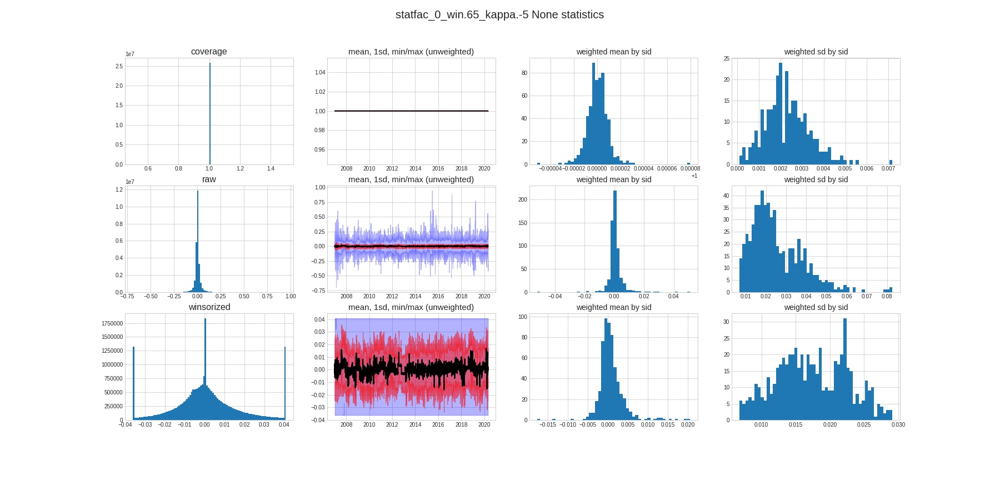

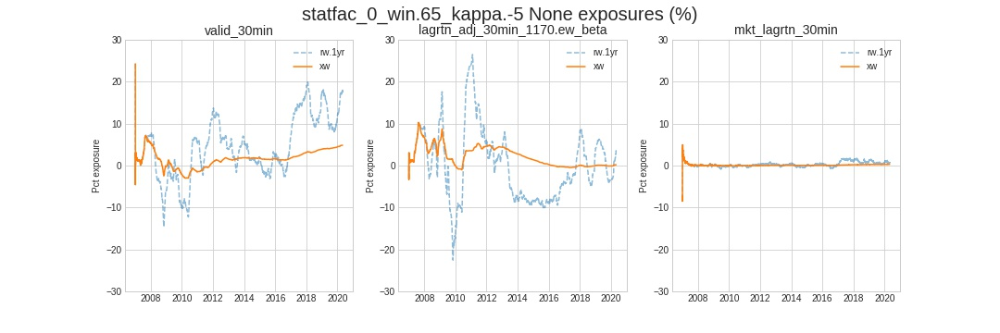

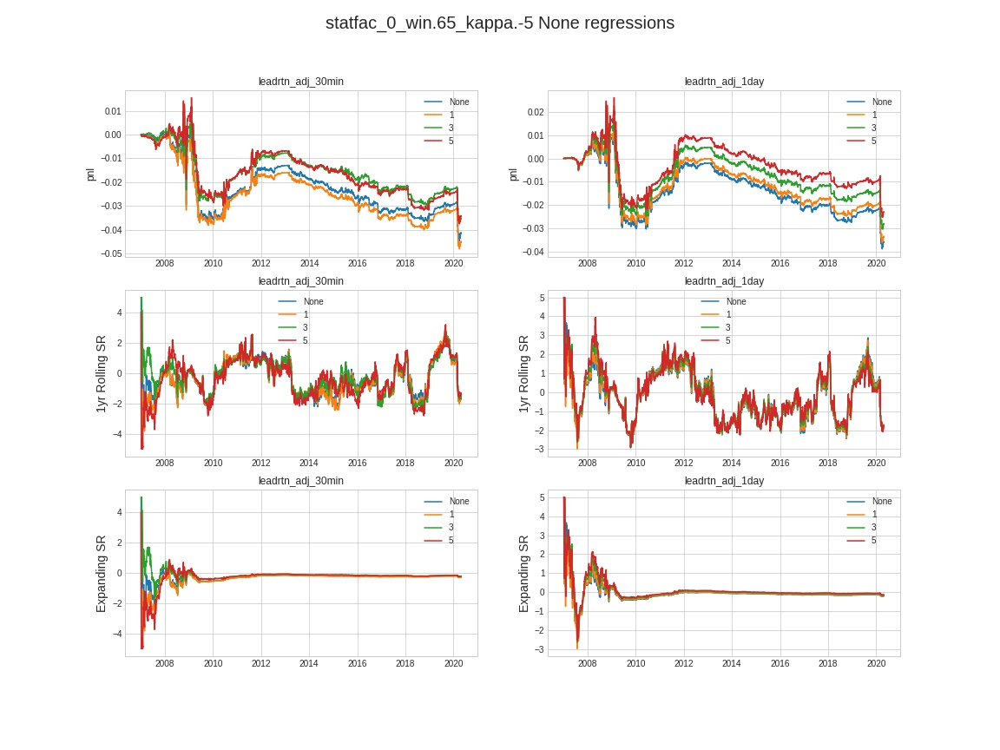

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,25804688,None,-0.803074,0.714515,6.800520e-25,0.001058,0.027103,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,25804688,0.948022,3.439664,-0.021891,0.001761,0.000003,8.122898,0.953557,0.965419,0.940207,0.725892
leadrtn_adj_1day,NaN,25804688,0.947569,3.439664,-0.016884,0.003790,0.000014,19.220438,0.761166,0.965419,0.940207,0.725892
leadrtn_adj_30min,1.0,25804688,0.948012,3.439968,0.021332,0.001444,0.000002,7.056755,0.851294,0.965417,0.940204,0.725884
leadrtn_adj_1day,1.0,25804688,0.947559,3.439968,0.006225,0.003782,0.000014,18.834637,0.753897,0.965417,0.940204,0.725884
leadrtn_adj_30min,3.0,25804688,0.947991,3.440635,0.076270,0.001444,0.000002,7.000003,0.865573,0.965414,0.940199,0.725879
leadrtn_adj_1day,3.0,25804688,0.947538,3.440635,0.006951,0.003461,0.000012,17.225080,0.699472,0.965414,0.940199,0.725879
leadrtn_adj_30min,5.0,25804688,0.947970,3.441318,-0.000758,0.001269,0.000002,6.207890,0.778435,0.965407,0.940192,0.725874
leadrtn_adj_1day,5.0,25804688,0.947516,3.441318,-0.039553,0.003136,0.000010,15.452269,0.626270,0.965407,0.940192,0.725874


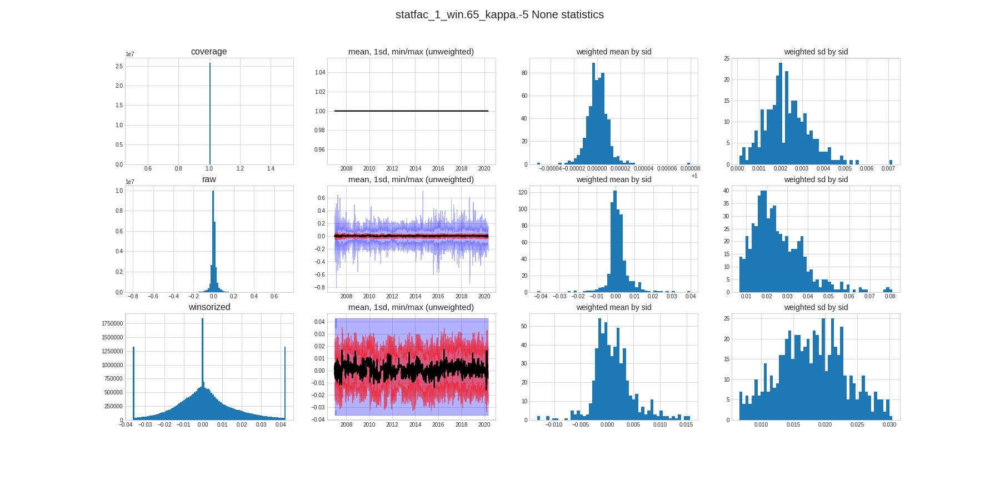

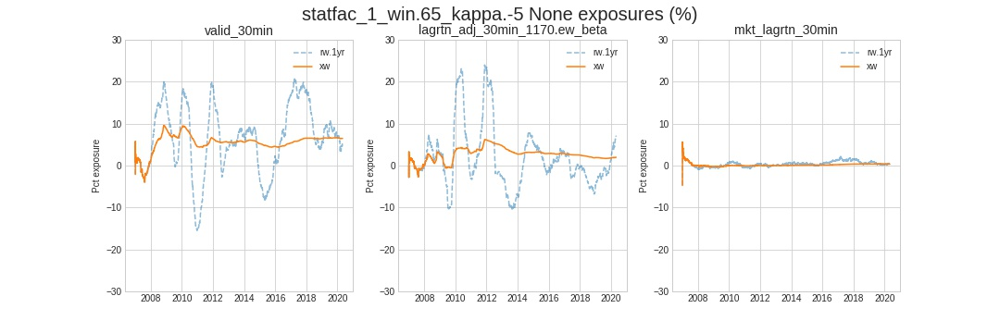

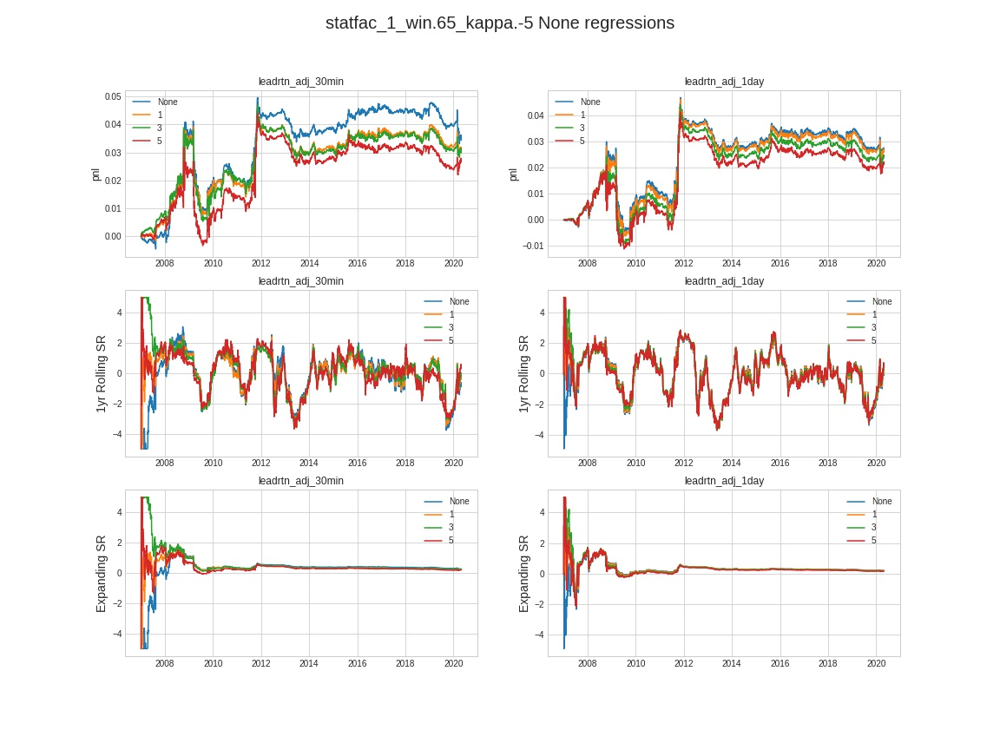

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,25804688,None,-1.114601,1.022467,-0.000076,-0.001182,0.023391,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,25804688,0.948022,-3.497373,-0.058347,-0.000691,4.768372e-07,-5.035219,-0.287956,0.969891,0.959031,0.877355
leadrtn_adj_1day,NaN,25804688,0.947569,-3.497373,-0.143896,-0.002784,7.748604e-06,-13.950824,-0.240352,0.969891,0.959031,0.877355
leadrtn_adj_30min,1.0,25804688,0.948012,-3.497039,-0.036644,-0.000598,3.576279e-07,-4.504344,-0.257323,0.969889,0.959027,0.877346
leadrtn_adj_1day,1.0,25804688,0.947559,-3.497039,-0.124451,-0.002525,6.377697e-06,-13.185104,-0.227299,0.969889,0.959027,0.877346
leadrtn_adj_30min,3.0,25804688,0.947991,-3.496411,-0.041688,-0.000691,4.768372e-07,-4.929327,-0.283208,0.969885,0.959023,0.877334
leadrtn_adj_1day,3.0,25804688,0.947538,-3.496411,-0.117746,-0.002584,6.675720e-06,-13.363594,-0.230425,0.969885,0.959023,0.877334
leadrtn_adj_30min,5.0,25804688,0.947970,-3.495779,-0.077202,-0.000000,0.000000e+00,-2.117993,-0.121504,0.969881,0.959015,0.877323
leadrtn_adj_1day,5.0,25804688,0.947516,-3.495779,-0.112668,-0.002618,6.854534e-06,-13.386589,-0.230251,0.969881,0.959015,0.877323


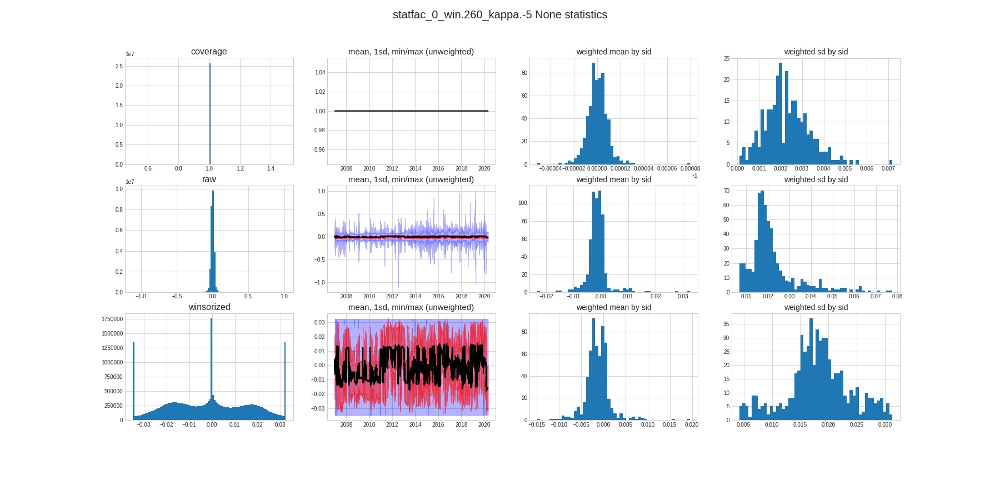

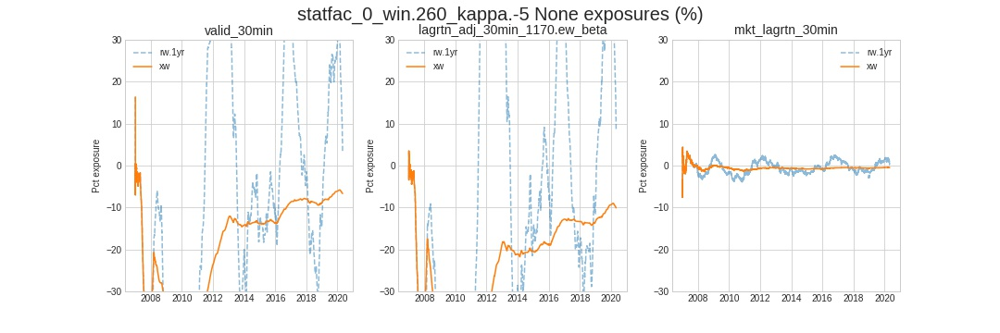

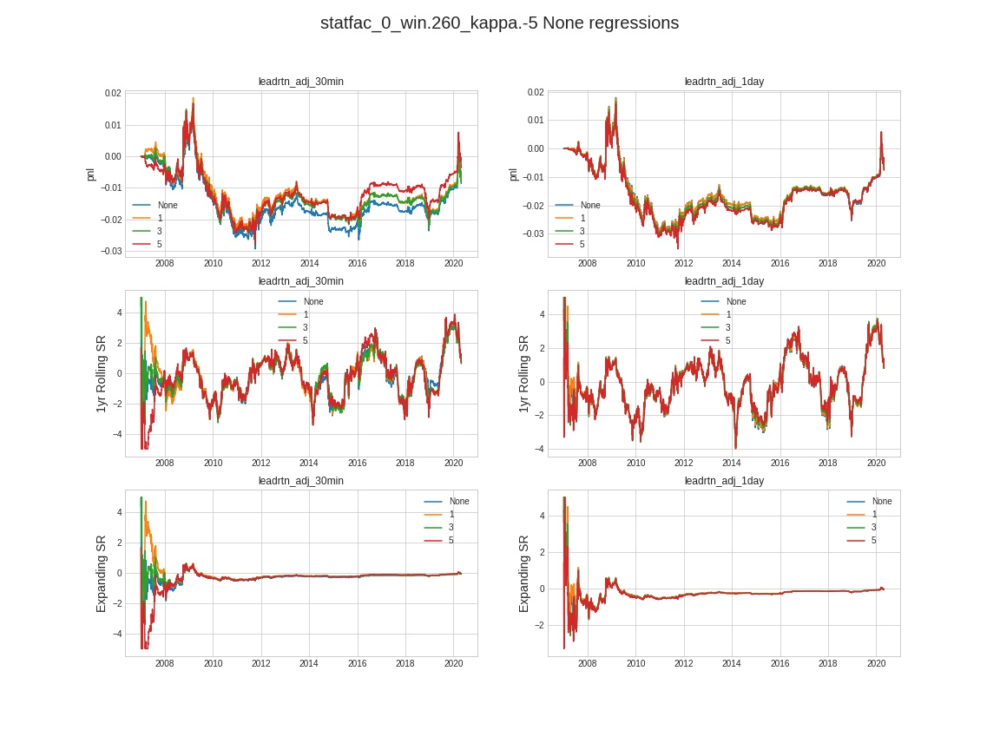

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,25804688,None,-1.269412,1.322703,-0.000171,-0.001068,0.023734,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,25804688,0.948022,-3.256167,-0.080157,0.001221,1.490116e-06,5.245977,0.311413,0.973033,0.964020,0.894736
leadrtn_adj_1day,NaN,25804688,0.947569,-3.256167,-0.279173,0.001726,2.980232e-06,7.680473,0.136934,0.973033,0.964020,0.894736
leadrtn_adj_30min,1.0,25804688,0.948012,-3.256044,-0.084736,0.000810,6.556511e-07,2.889879,0.171475,0.973029,0.964016,0.894729
leadrtn_adj_1day,1.0,25804688,0.947559,-3.256044,-0.272088,0.001145,1.311302e-06,5.124516,0.091359,0.973029,0.964016,0.894729
leadrtn_adj_30min,3.0,25804688,0.947991,-3.255706,-0.029802,0.000345,1.192093e-07,2.451905,0.145418,0.973028,0.964013,0.894723
leadrtn_adj_1day,3.0,25804688,0.947538,-3.255706,-0.275077,0.000244,5.960464e-08,1.549881,0.027615,0.973028,0.964013,0.894723
leadrtn_adj_30min,5.0,25804688,0.947970,-3.255367,-0.077410,0.000598,-3.576279e-07,1.774939,0.106049,0.973021,0.964006,0.894711
leadrtn_adj_1day,5.0,25804688,0.947516,-3.255367,-0.311518,-0.000345,-1.192093e-07,-1.612419,-0.028673,0.973021,0.964006,0.894711


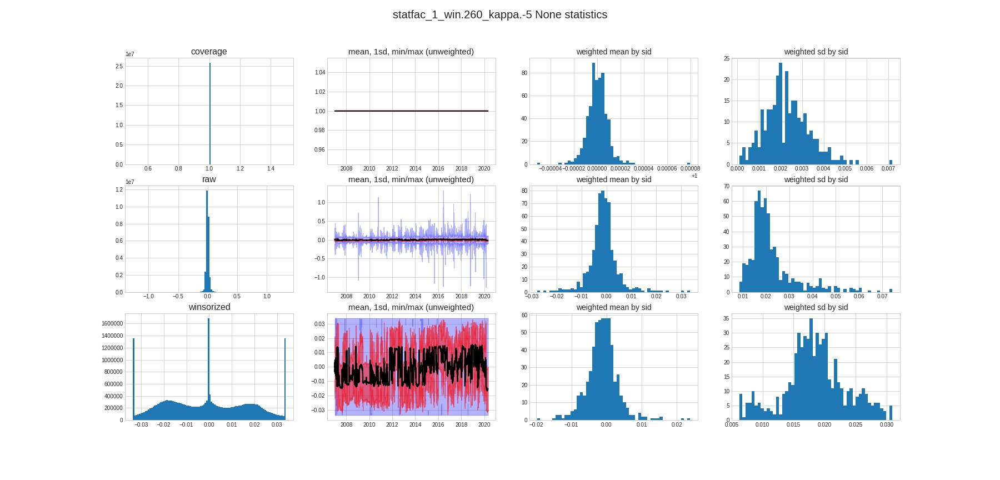

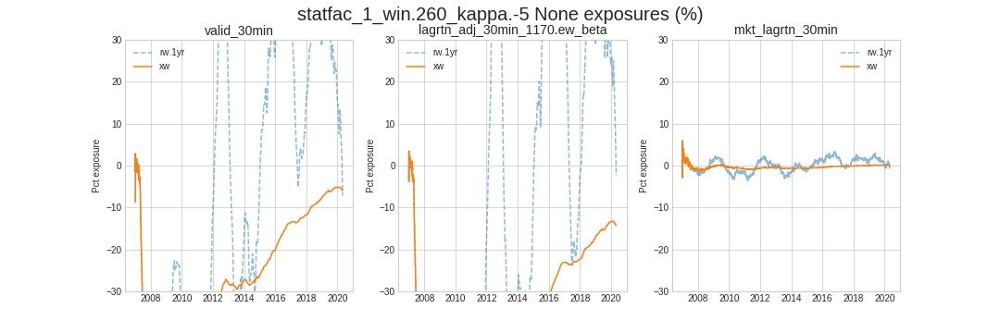

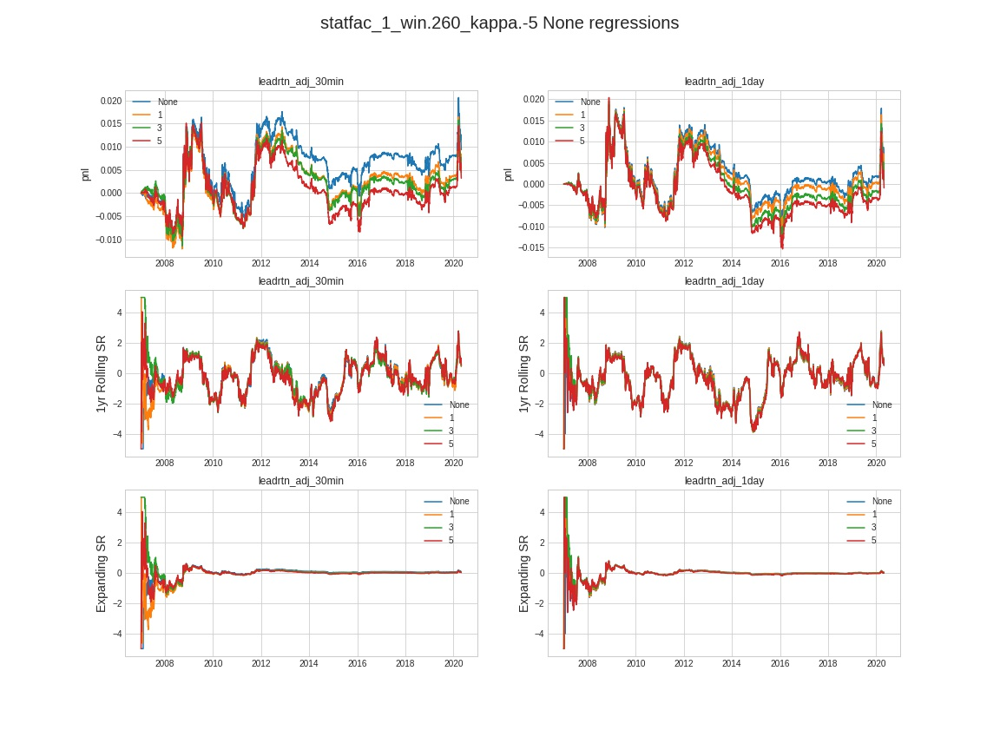

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,25804688,None,-0.711799,1.235402,0.012608,0.008452,0.020924,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,25804688,0.948022,25.780018,0.164771,0.003107,0.000010,15.838723,0.961903,0.971024,0.964035,0.927923
leadrtn_adj_1day,NaN,25804688,0.947569,25.780018,0.535384,0.010007,0.000100,49.223988,0.893629,0.971024,0.964035,0.927923
leadrtn_adj_30min,1.0,25804688,0.948012,25.779019,0.145525,0.003365,0.000011,16.685482,1.013395,0.971020,0.964032,0.927920
leadrtn_adj_1day,1.0,25804688,0.947559,25.779019,0.523478,0.009932,0.000099,48.934017,0.890387,0.971020,0.964032,0.927920
leadrtn_adj_30min,3.0,25804688,0.947991,25.777189,0.166159,0.003906,0.000015,19.552259,1.174716,0.971015,0.964025,0.927911
leadrtn_adj_1day,3.0,25804688,0.947538,25.777189,0.525041,0.009920,0.000098,48.890209,0.894061,0.971015,0.964025,0.927911
leadrtn_adj_30min,5.0,25804688,0.947970,25.775300,0.134782,0.002405,0.000006,12.473285,0.754330,0.971011,0.964019,0.927903
leadrtn_adj_1day,5.0,25804688,0.947516,25.775300,0.505871,0.009506,0.000090,46.840412,0.862099,0.971011,0.964019,0.927903


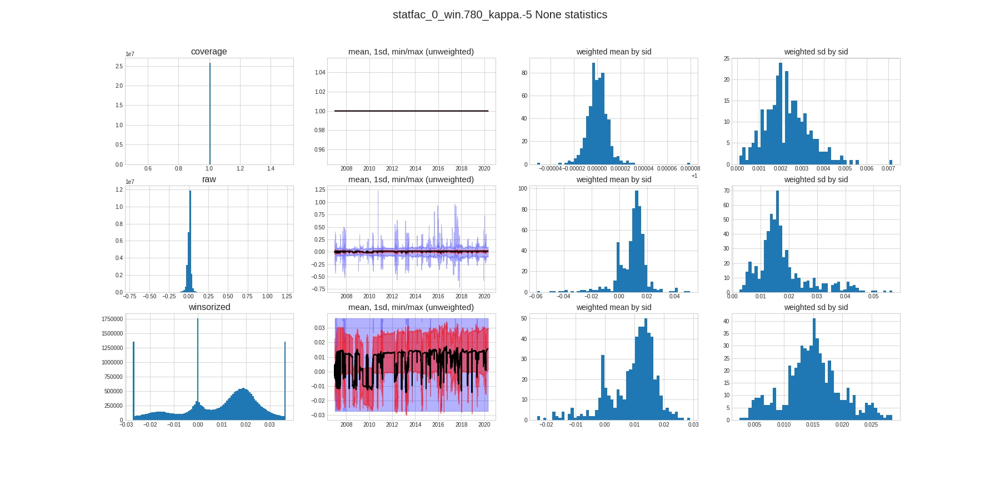

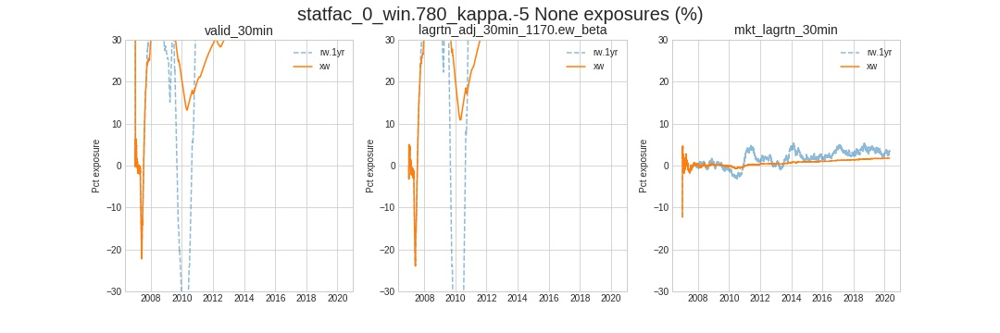

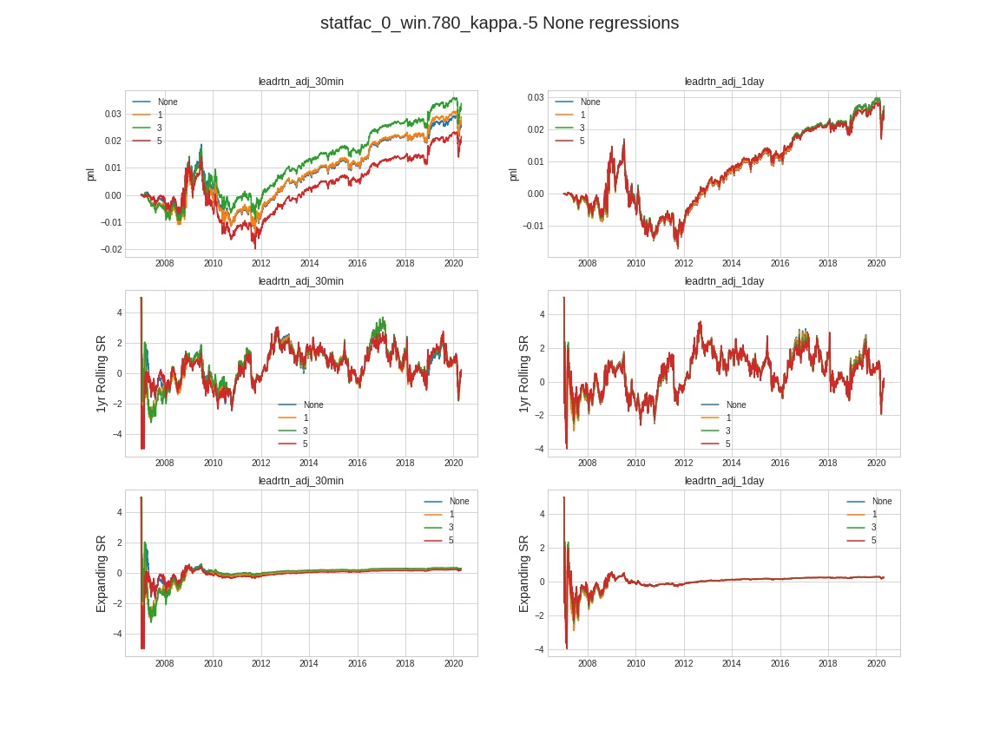

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,25804688,None,-0.861921,1.194138,-0.006295,-0.004401,0.02228,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,25804688,0.948022,-9.241323,-0.156412,-0.003596,0.000013,-17.974247,-0.985982,0.974003,0.967638,0.930104
leadrtn_adj_1day,NaN,25804688,0.947569,-9.241323,-0.434142,-0.011073,0.000123,-54.723804,-0.906075,0.974003,0.967638,0.930104
leadrtn_adj_30min,1.0,25804688,0.948012,-9.240060,-0.143024,-0.003588,0.000013,-17.820148,-0.977449,0.974000,0.967638,0.930099
leadrtn_adj_1day,1.0,25804688,0.947559,-9.240060,-0.415079,-0.010965,0.000120,-54.094910,-0.896745,0.974000,0.967638,0.930099
leadrtn_adj_30min,3.0,25804688,0.947991,-9.237474,-0.076294,-0.003383,0.000011,-16.951702,-0.927872,0.973990,0.967630,0.930090
leadrtn_adj_1day,3.0,25804688,0.947538,-9.237474,-0.385918,-0.010529,0.000111,-51.931801,-0.864828,0.973990,0.967630,0.930090
leadrtn_adj_30min,5.0,25804688,0.947970,-9.234887,-0.104716,-0.003107,0.000010,-15.198145,-0.842237,0.973988,0.967624,0.930081
leadrtn_adj_1day,5.0,25804688,0.947516,-9.234887,-0.378869,-0.009799,0.000096,-48.436161,-0.810875,0.973988,0.967624,0.930081


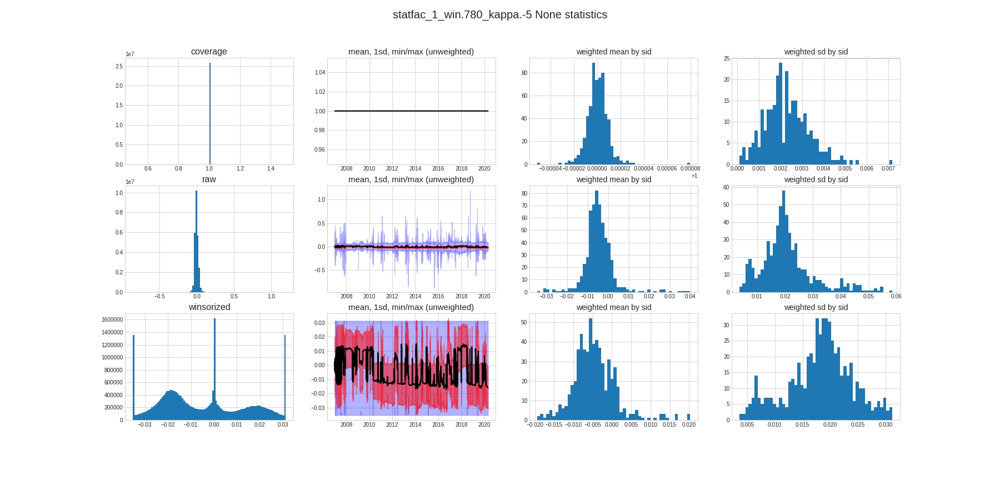

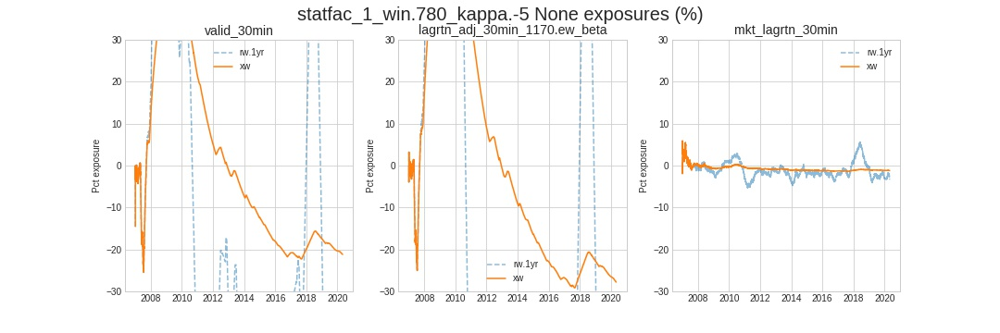

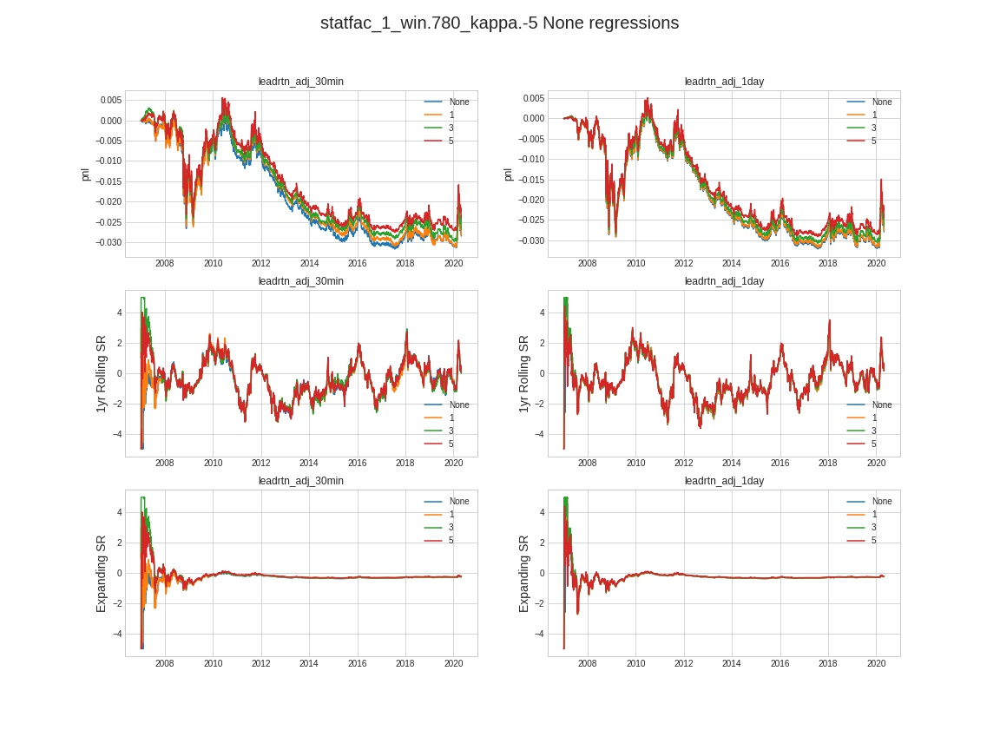

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,25804688,None,-1.388191,1.008471,-0.00017,-0.000786,0.027834,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,25804688,0.948022,-1.525564,-0.058777,-0.000423,1.788139e-07,-3.419289,-0.864451,0.978856,0.964567,0.803535
leadrtn_adj_1day,NaN,25804688,0.947569,-1.525564,-0.135486,-0.002674,7.152557e-06,-13.153133,-0.983325,0.978856,0.964567,0.803535
leadrtn_adj_30min,1.0,25804688,0.948012,-1.525763,-0.067090,-0.000598,3.576279e-07,-3.777397,-0.951888,0.978855,0.964565,0.803533
leadrtn_adj_1day,1.0,25804688,0.947559,-1.525763,-0.151883,-0.002805,7.867813e-06,-13.655094,-1.019166,0.978855,0.964565,0.803533
leadrtn_adj_30min,3.0,25804688,0.947991,-1.526193,-0.041982,-0.000598,3.576279e-07,-3.483469,-0.871763,0.978853,0.964563,0.803535
leadrtn_adj_1day,3.0,25804688,0.947538,-1.526193,-0.163330,-0.002805,7.867813e-06,-13.628227,-1.014559,0.978853,0.964563,0.803535
leadrtn_adj_30min,5.0,25804688,0.947970,-1.526642,-0.087149,-0.000646,4.172325e-07,-3.628613,-0.893021,0.978851,0.964562,0.803534
leadrtn_adj_1day,5.0,25804688,0.947516,-1.526642,-0.181398,-0.002889,8.344650e-06,-13.643150,-1.015013,0.978851,0.964562,0.803534


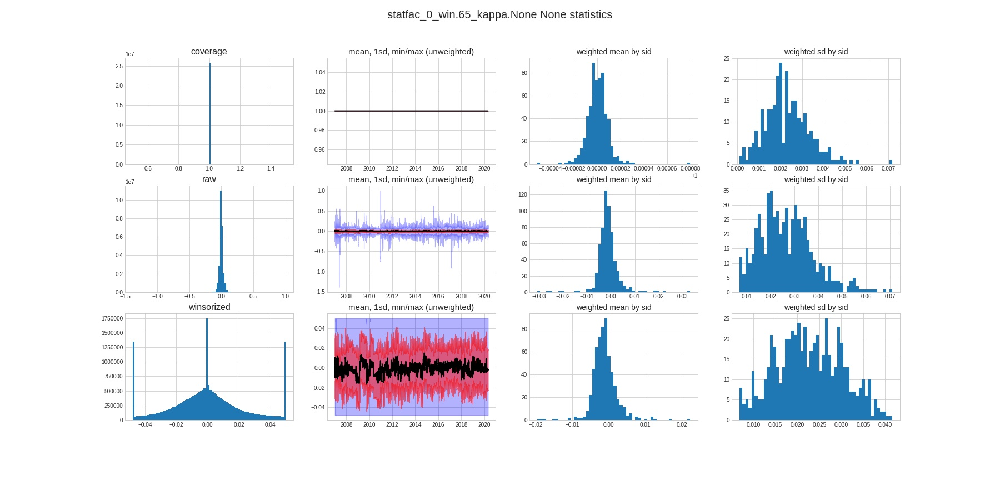

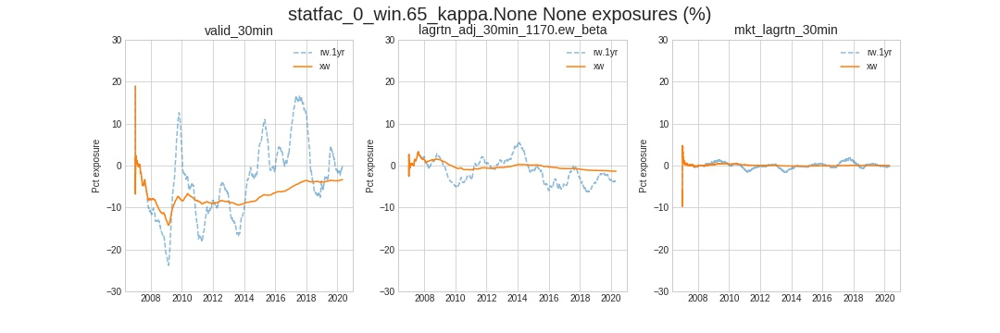

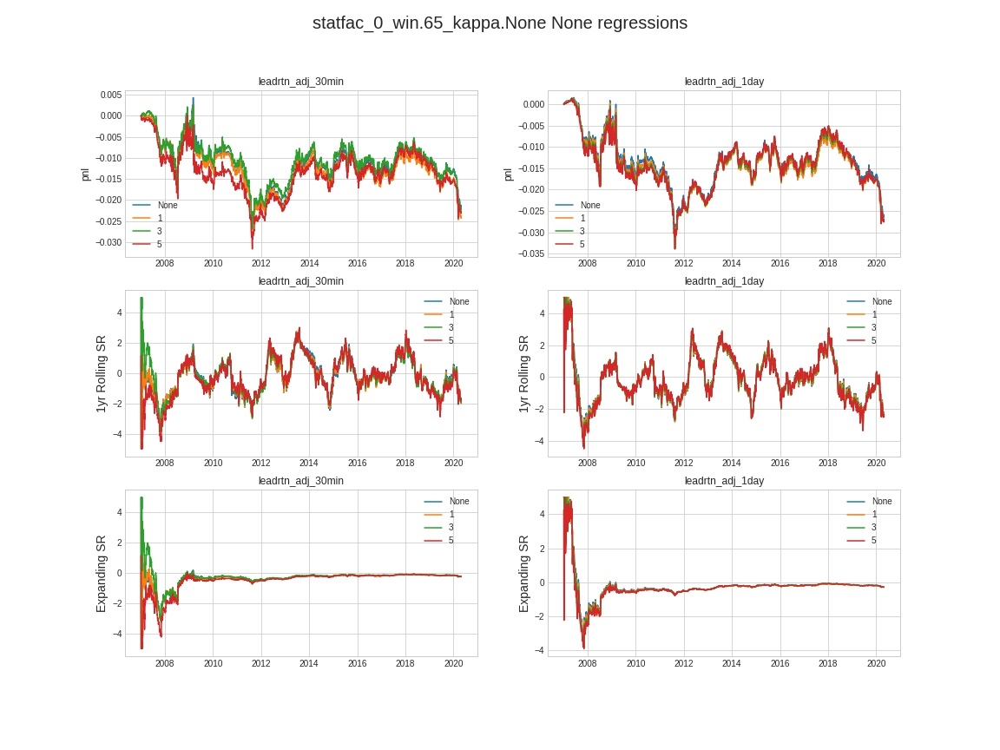

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,25804688,None,-1.156994,1.207582,6.176408e-20,-0.000322,0.028747,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,25804688,0.948022,0.288686,0.045080,0.000000,0.000000e+00,0.010189,0.002405,0.976393,0.960906,0.803967
leadrtn_adj_1day,NaN,25804688,0.947569,0.288686,0.186007,0.000244,5.960464e-08,0.247950,0.017999,0.976393,0.960906,0.803967
leadrtn_adj_30min,1.0,25804688,0.948012,0.288882,0.082658,0.000345,-1.192093e-07,0.510270,0.121748,0.976390,0.960903,0.803961
leadrtn_adj_1day,1.0,25804688,0.947559,0.288882,0.203026,0.000488,2.384186e-07,0.491193,0.035736,0.976390,0.960903,0.803961
leadrtn_adj_30min,3.0,25804688,0.947991,0.289332,0.131838,0.000488,-2.384186e-07,0.824935,0.199171,0.976388,0.960899,0.803951
leadrtn_adj_1day,3.0,25804688,0.947538,0.289332,0.204515,0.000598,-3.576279e-07,1.092311,0.079758,0.976388,0.960899,0.803951
leadrtn_adj_30min,5.0,25804688,0.947970,0.289744,0.069217,0.000598,-3.576279e-07,0.473077,0.114400,0.976383,0.960893,0.803941
leadrtn_adj_1day,5.0,25804688,0.947516,0.289744,0.178247,0.000810,6.556511e-07,1.852075,0.135491,0.976383,0.960893,0.803941


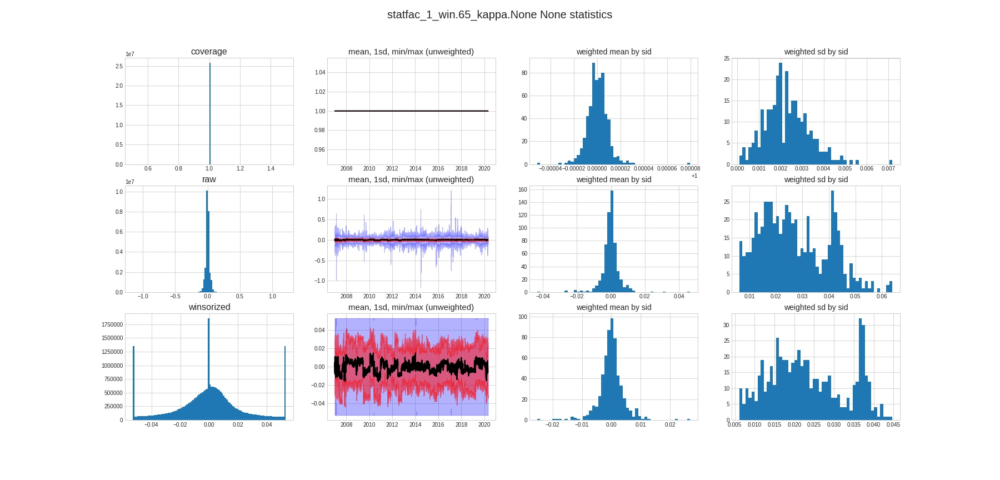

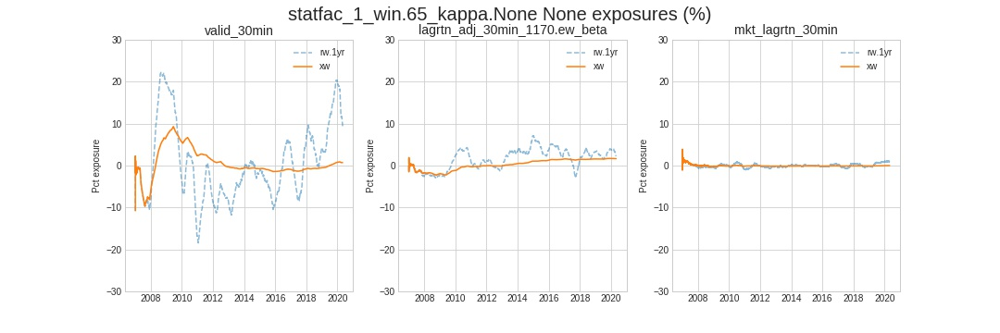

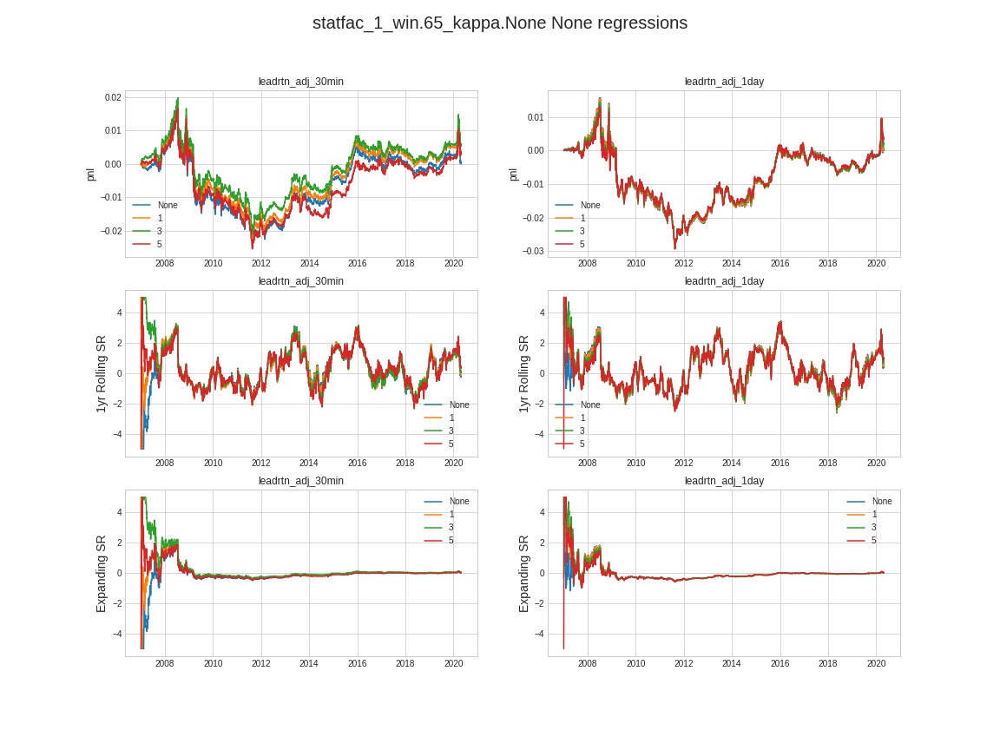

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,25804688,None,-0.696978,1.008085,-0.0,-0.000608,0.024421,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,25804688,0.948022,-1.115843,-0.026255,0.000546,2.980232e-07,3.495925,0.452480,0.976959,0.967599,0.888356
leadrtn_adj_1day,NaN,25804688,0.947569,-1.115843,-0.080665,0.002502,6.258488e-06,11.983554,0.468620,0.976959,0.967599,0.888356
leadrtn_adj_30min,1.0,25804688,0.948012,-1.115686,-0.056325,0.000244,5.960464e-08,2.158442,0.281496,0.976958,0.967595,0.888354
leadrtn_adj_1day,1.0,25804688,0.947559,-1.115686,-0.089185,0.002549,6.496906e-06,12.162301,0.475688,0.976958,0.967595,0.888354
leadrtn_adj_30min,3.0,25804688,0.947991,-1.115362,-0.032862,0.000345,-1.192093e-07,2.980977,0.390919,0.976951,0.967590,0.888352
leadrtn_adj_1day,3.0,25804688,0.947538,-1.115362,-0.072809,0.002773,7.688999e-06,13.592656,0.530183,0.976951,0.967590,0.888352
leadrtn_adj_30min,5.0,25804688,0.947970,-1.114990,-0.062780,0.000345,-1.192093e-07,1.918689,0.250552,0.976946,0.967583,0.888350
leadrtn_adj_1day,5.0,25804688,0.947516,-1.114990,-0.073428,0.002899,8.404255e-06,14.152004,0.550593,0.976946,0.967583,0.888350


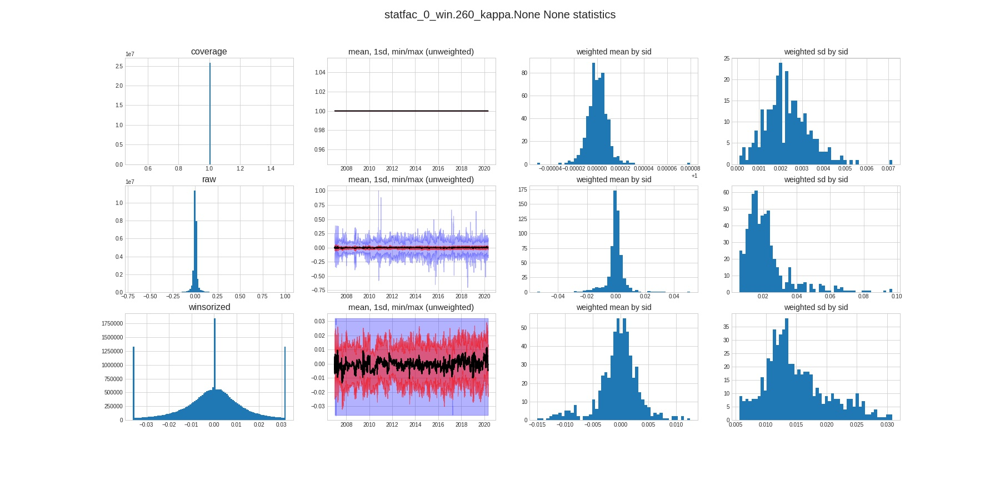

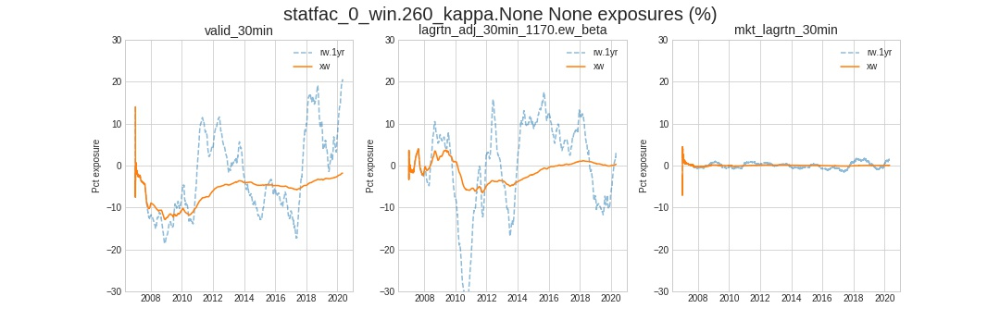

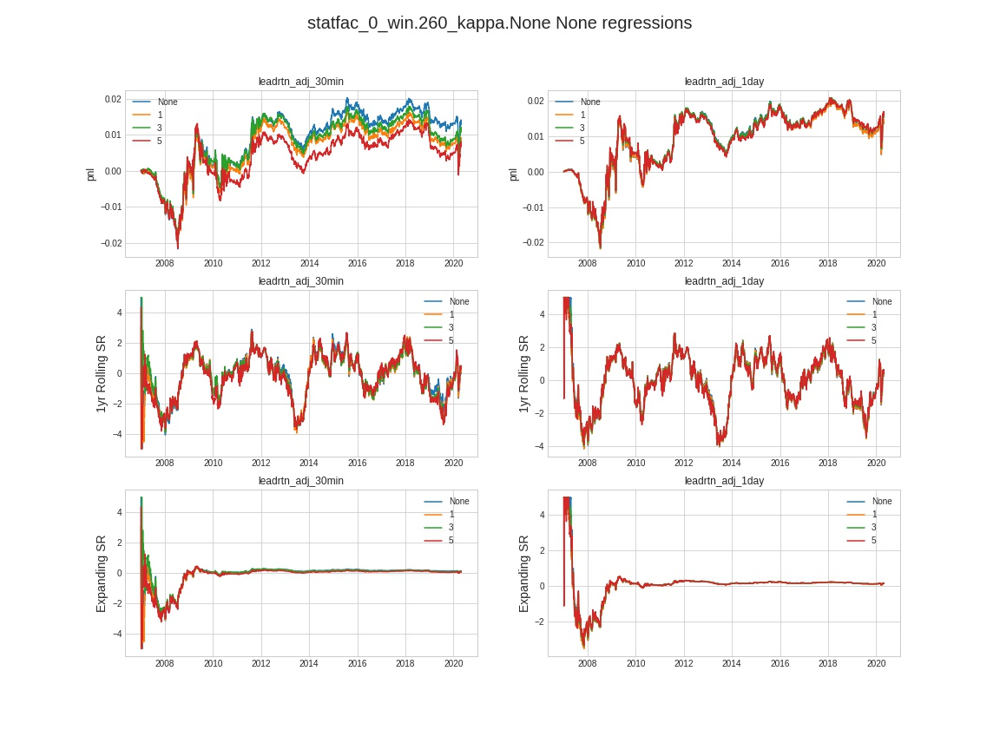

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,25804688,None,-0.784517,1.076581,0.000172,0.000912,0.024419,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,25804688,0.948022,4.286998,-0.050303,-0.001402,0.000002,-7.123688,-0.924457,0.979047,0.970046,0.893826
leadrtn_adj_1day,NaN,25804688,0.947569,4.286998,-0.074260,-0.004435,0.000020,-20.908541,-0.809924,0.979047,0.970046,0.893826
leadrtn_adj_30min,1.0,25804688,0.948012,4.286620,-0.049692,-0.001544,0.000002,-8.327883,-1.084094,0.979044,0.970043,0.893821
leadrtn_adj_1day,1.0,25804688,0.947559,4.286620,-0.058811,-0.004222,0.000018,-20.034210,-0.776402,0.979044,0.970043,0.893821
leadrtn_adj_30min,3.0,25804688,0.947991,4.285939,0.012803,-0.001424,0.000002,-7.545769,-0.976142,0.979041,0.970037,0.893812
leadrtn_adj_1day,3.0,25804688,0.947538,4.285939,-0.026074,-0.003782,0.000014,-17.927334,-0.694509,0.979041,0.970037,0.893812
leadrtn_adj_30min,5.0,25804688,0.947970,4.285283,-0.031019,-0.001092,0.000001,-5.797733,-0.755784,0.979036,0.970033,0.893804
leadrtn_adj_1day,5.0,25804688,0.947516,4.285283,-0.048987,-0.003588,0.000013,-17.194012,-0.665487,0.979036,0.970033,0.893804


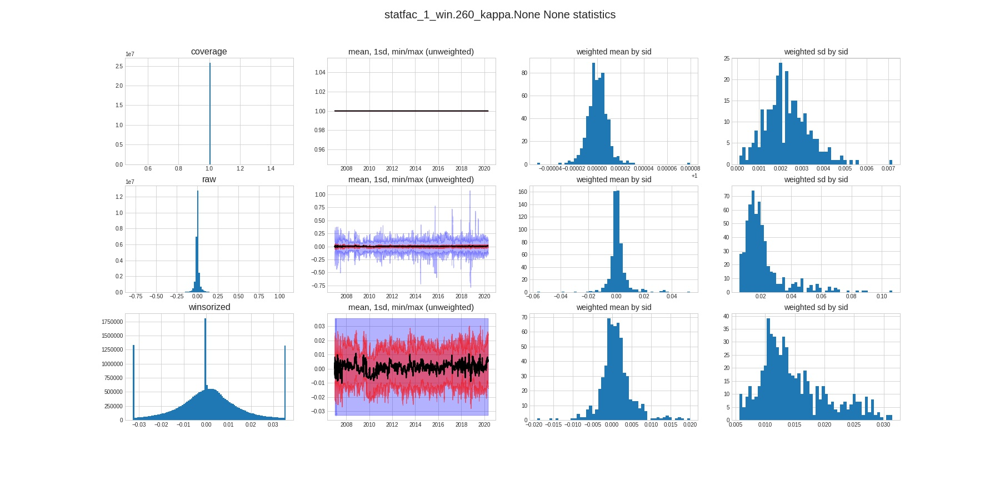

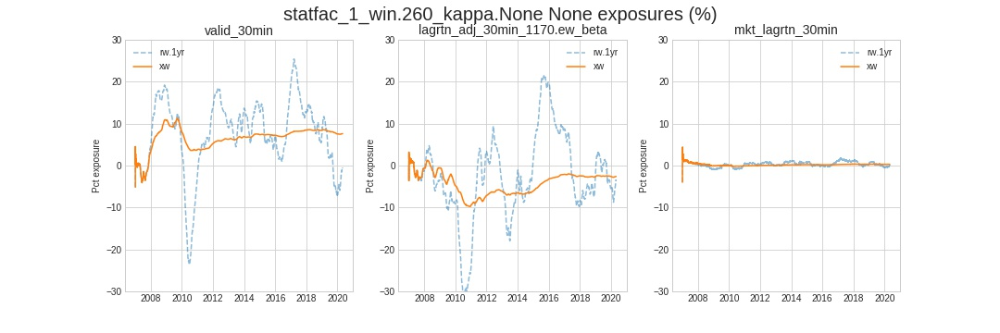

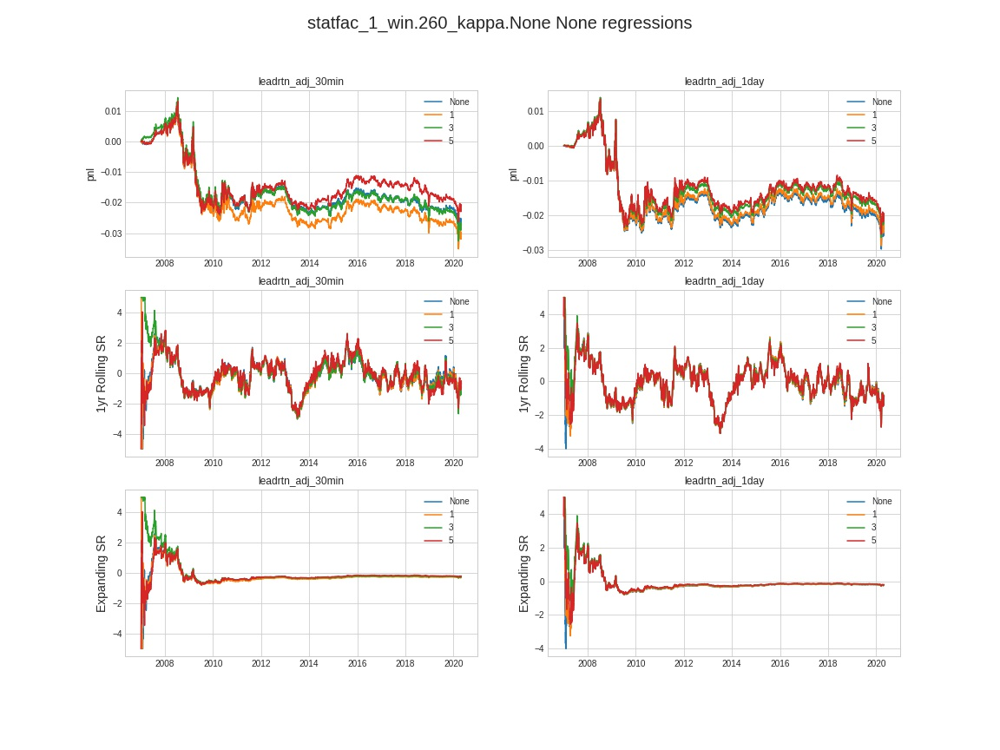

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,25804688,None,-0.571073,0.670965,3.437109e-27,0.000572,0.022942,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,25804688,0.948022,0.182626,0.024076,0.002342,0.000005,11.748924,0.636506,0.975027,0.965100,0.906170
leadrtn_adj_1day,NaN,25804688,0.947569,0.182626,0.134763,0.007038,0.000050,34.558613,0.558198,0.975027,0.965100,0.906170
leadrtn_adj_30min,1.0,25804688,0.948012,0.183228,0.005135,0.001953,0.000004,9.510637,0.516042,0.975025,0.965096,0.906168
leadrtn_adj_1day,1.0,25804688,0.947559,0.183228,0.120150,0.006587,0.000043,32.410049,0.522245,0.975025,0.965096,0.906168
leadrtn_adj_30min,3.0,25804688,0.947991,0.184447,0.036386,0.001998,0.000004,10.176285,0.548828,0.975020,0.965091,0.906159
leadrtn_adj_1day,3.0,25804688,0.947538,0.184447,0.121974,0.006200,0.000038,30.589441,0.490414,0.975020,0.965091,0.906159
leadrtn_adj_30min,5.0,25804688,0.947970,0.185677,0.027713,0.001656,0.000003,8.046884,0.434060,0.975016,0.965086,0.906151
leadrtn_adj_1day,5.0,25804688,0.947516,0.185677,0.104563,0.005470,0.000030,27.100561,0.432130,0.975016,0.965086,0.906151


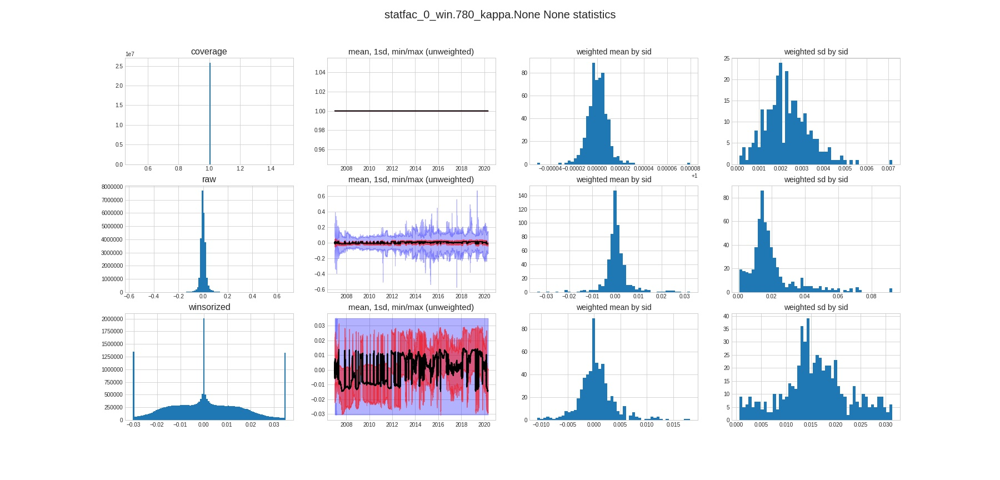

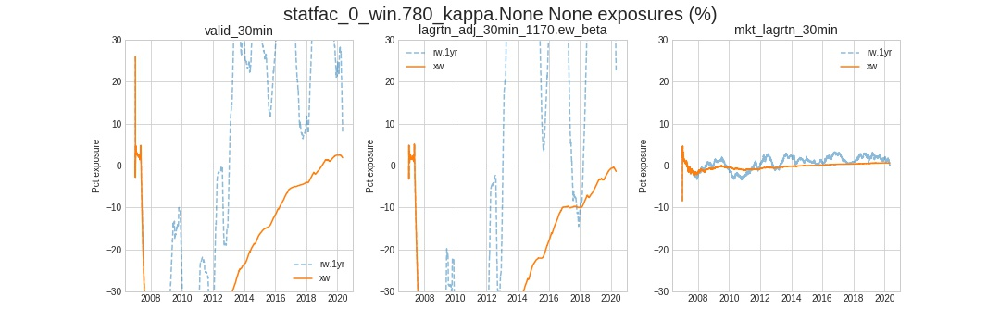

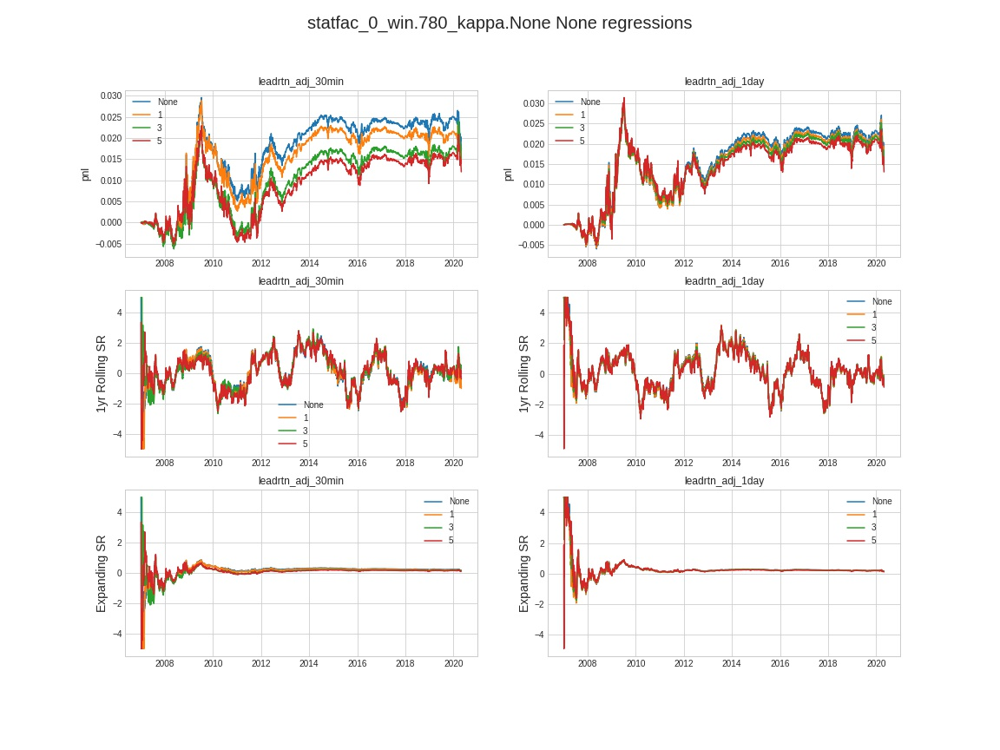

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,25804688,None,-0.408119,0.842082,0.005231,0.005584,0.02208,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,25804688,0.948022,20.244073,0.085662,0.003435,0.000012,16.697449,0.939162,0.969703,0.955355,0.887503
leadrtn_adj_1day,NaN,25804688,0.947569,20.244073,0.334827,0.008141,0.000066,40.107594,0.684937,0.969703,0.955355,0.887503
leadrtn_adj_30min,1.0,25804688,0.948012,20.246161,0.095614,0.002329,0.000005,11.578959,0.643247,0.969697,0.955352,0.887498
leadrtn_adj_1day,1.0,25804688,0.947559,20.246161,0.342895,0.008031,0.000064,39.605873,0.678182,0.969697,0.955352,0.887498
leadrtn_adj_30min,3.0,25804688,0.947991,20.250275,0.134150,0.001968,0.000004,10.157120,0.564545,0.969695,0.955347,0.887485
leadrtn_adj_1day,3.0,25804688,0.947538,20.250275,0.335591,0.007728,0.000060,38.168903,0.658022,0.969695,0.955347,0.887485
leadrtn_adj_30min,5.0,25804688,0.947970,20.254506,0.075296,0.001525,0.000002,7.806487,0.438404,0.969689,0.955341,0.887474
leadrtn_adj_1day,5.0,25804688,0.947516,20.254506,0.311028,0.007778,0.000060,38.447239,0.665567,0.969689,0.955341,0.887474


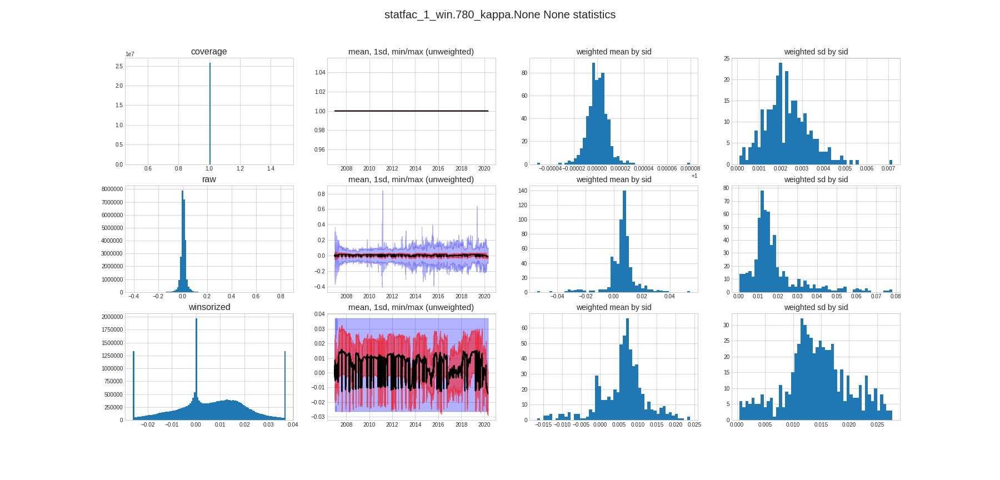

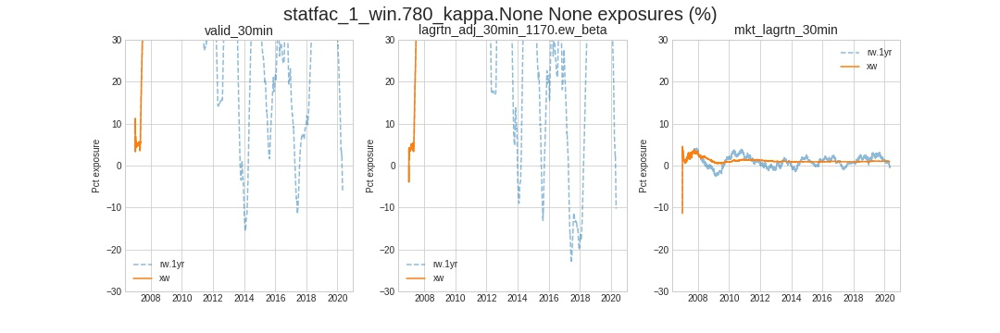

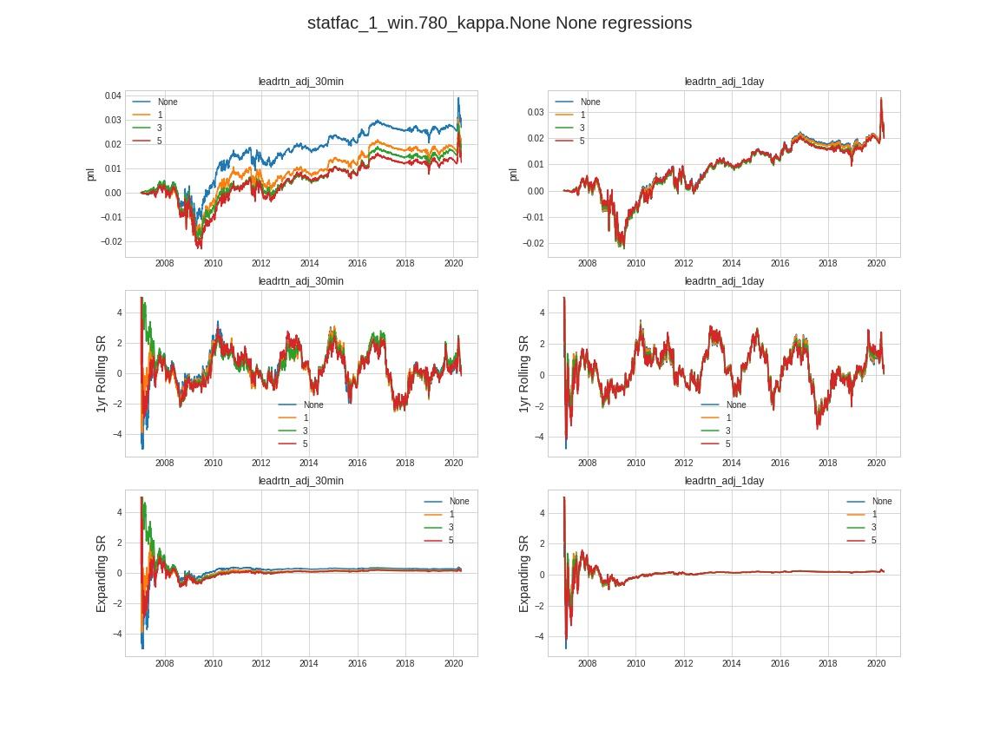

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,25804688,None,-0.546726,0.595016,7.955923e-11,-0.000065,0.031451,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,25804688,0.948022,0.741412,-0.015338,0.000244,5.960464e-08,0.534773,0.212207,0.980910,0.970233,0.876009
leadrtn_adj_1day,NaN,25804688,0.947569,0.741412,-0.007018,0.000488,2.384186e-07,2.422828,0.291615,0.980910,0.970233,0.876009
leadrtn_adj_30min,1.0,25804688,0.948012,0.741475,-0.023619,0.000000,0.000000e+00,0.605014,0.241276,0.980907,0.970231,0.876007
leadrtn_adj_1day,1.0,25804688,0.947559,0.741475,-0.028896,0.000546,2.980232e-07,2.070620,0.250324,0.980907,0.970231,0.876007
leadrtn_adj_30min,3.0,25804688,0.947991,0.741588,0.005684,0.000345,-1.192093e-07,0.902332,0.360986,0.980905,0.970224,0.876001
leadrtn_adj_1day,3.0,25804688,0.947538,0.741588,-0.052073,0.000423,1.788139e-07,1.532853,0.186757,0.980905,0.970224,0.876001
leadrtn_adj_30min,5.0,25804688,0.947970,0.741704,-0.037368,0.000345,-1.192093e-07,0.933567,0.372064,0.980901,0.970220,0.875994
leadrtn_adj_1day,5.0,25804688,0.947516,0.741704,-0.085567,0.000488,-2.384186e-07,1.153683,0.141331,0.980901,0.970220,0.875994


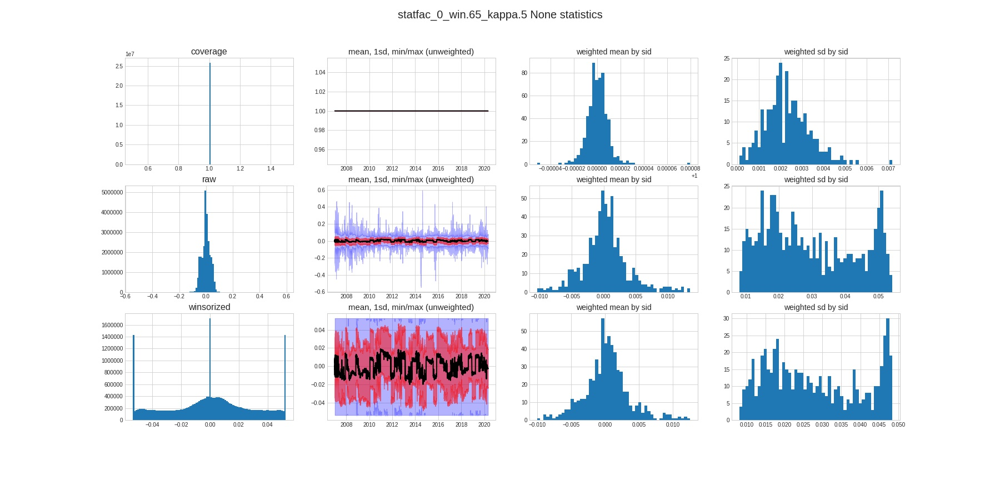

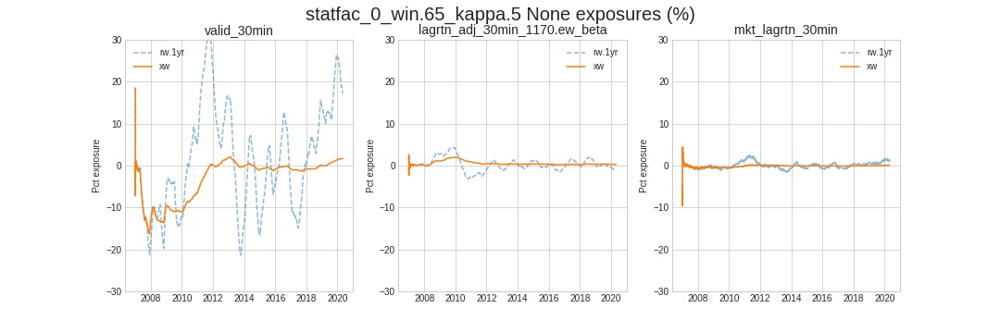

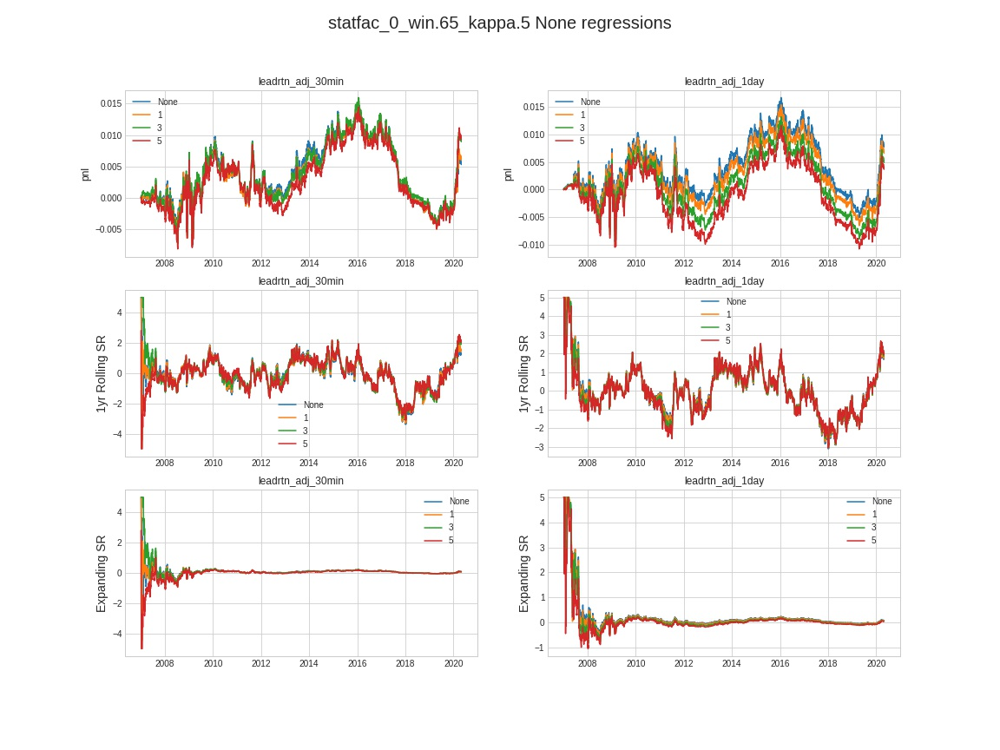

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,25804688,None,-0.772339,0.478645,-2.420766e-08,-0.00025,0.031483,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,25804688,0.948022,-0.001149,-0.046602,-0.000488,-2.384186e-07,-1.052473,-0.361019,0.980938,0.970115,0.869520
leadrtn_adj_1day,NaN,25804688,0.947569,-0.001149,-0.031209,-0.000546,2.980232e-07,-3.389193,-0.349498,0.980938,0.970115,0.869520
leadrtn_adj_30min,1.0,25804688,0.948012,-0.001061,-0.000117,-0.000488,-2.384186e-07,-1.029739,-0.354152,0.980937,0.970113,0.869517
leadrtn_adj_1day,1.0,25804688,0.947559,-0.001061,-0.003423,-0.000423,1.788139e-07,-3.335900,-0.344113,0.980937,0.970113,0.869517
leadrtn_adj_30min,3.0,25804688,0.947991,-0.000887,0.053119,-0.000000,0.000000e+00,-0.598367,-0.205065,0.980937,0.970109,0.869511
leadrtn_adj_1day,3.0,25804688,0.947538,-0.000887,0.008414,-0.000244,5.960464e-08,-3.349130,-0.345523,0.980937,0.970109,0.869511
leadrtn_adj_30min,5.0,25804688,0.947970,-0.000718,0.017115,-0.000345,-1.192093e-07,-0.524287,-0.179479,0.980933,0.970104,0.869505
leadrtn_adj_1day,5.0,25804688,0.947516,-0.000718,-0.004928,-0.000000,0.000000e+00,-3.644529,-0.376350,0.980933,0.970104,0.869505


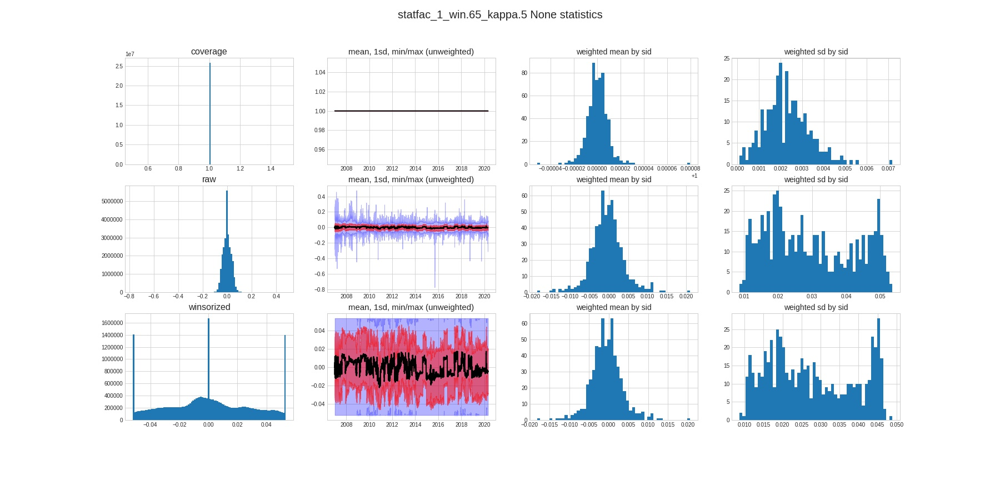

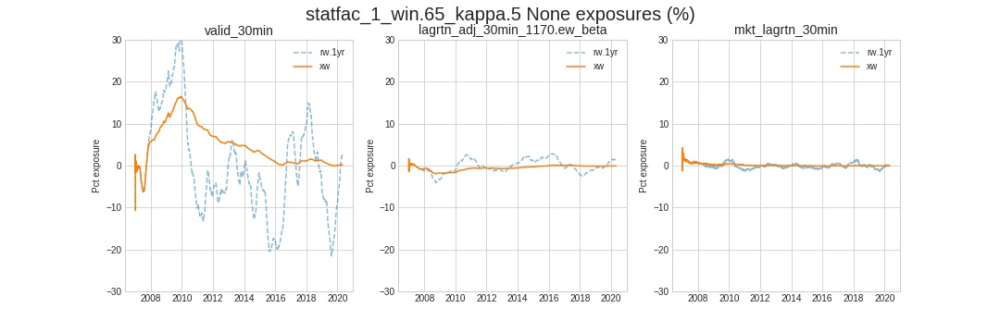

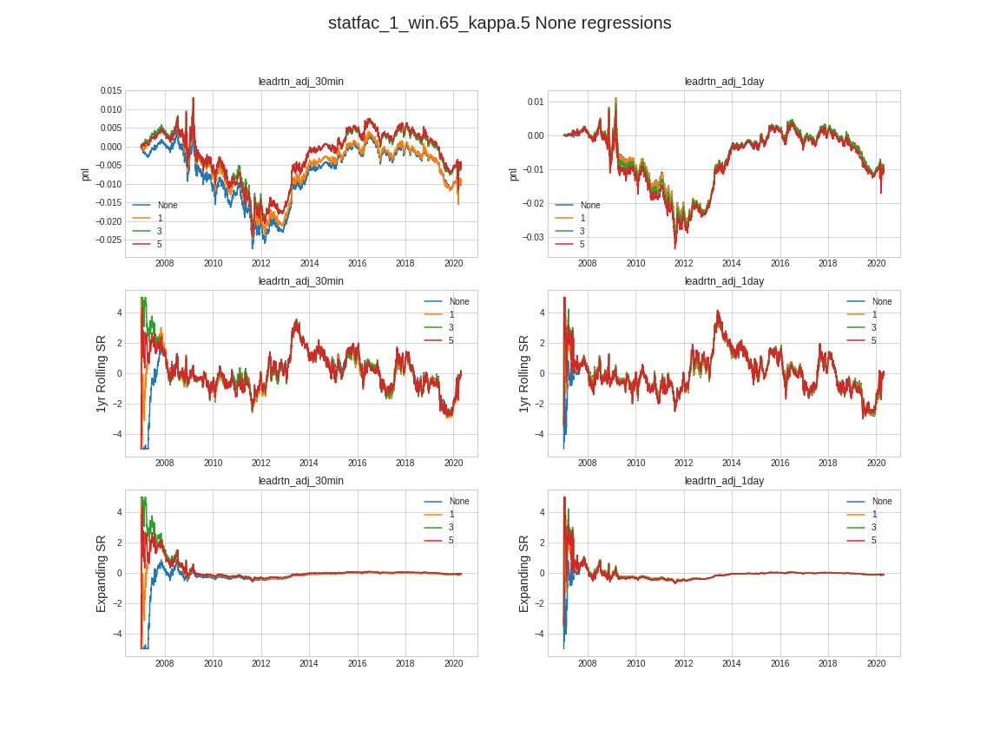

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,25804688,None,-0.551296,0.497773,-0.000729,-0.001317,0.028444,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,25804688,0.948022,-2.208817,0.058382,0.000598,-3.576279e-07,3.255064,0.769959,0.983659,0.976384,0.910025
leadrtn_adj_1day,NaN,25804688,0.947569,-2.208817,0.209008,0.001859,3.457069e-06,9.612712,0.685427,0.983659,0.976384,0.910025
leadrtn_adj_30min,1.0,25804688,0.948012,-2.209045,0.033478,0.000488,-2.384186e-07,2.937674,0.694166,0.983656,0.976383,0.910022
leadrtn_adj_1day,1.0,25804688,0.947559,-2.209045,0.198519,0.001843,3.397465e-06,9.347591,0.667231,0.983656,0.976383,0.910022
leadrtn_adj_30min,3.0,25804688,0.947991,-2.209524,0.058373,0.000345,-1.192093e-07,2.773754,0.653923,0.983651,0.976377,0.910016
leadrtn_adj_1day,3.0,25804688,0.947538,-2.209524,0.221740,0.001907,3.635883e-06,9.357217,0.669601,0.983651,0.976377,0.910016
leadrtn_adj_30min,5.0,25804688,0.947970,-2.209999,0.018989,0.000488,-2.384186e-07,2.434779,0.578304,0.983646,0.976371,0.910005
leadrtn_adj_1day,5.0,25804688,0.947516,-2.209999,0.213744,0.001875,3.516674e-06,9.272532,0.665471,0.983646,0.976371,0.910005


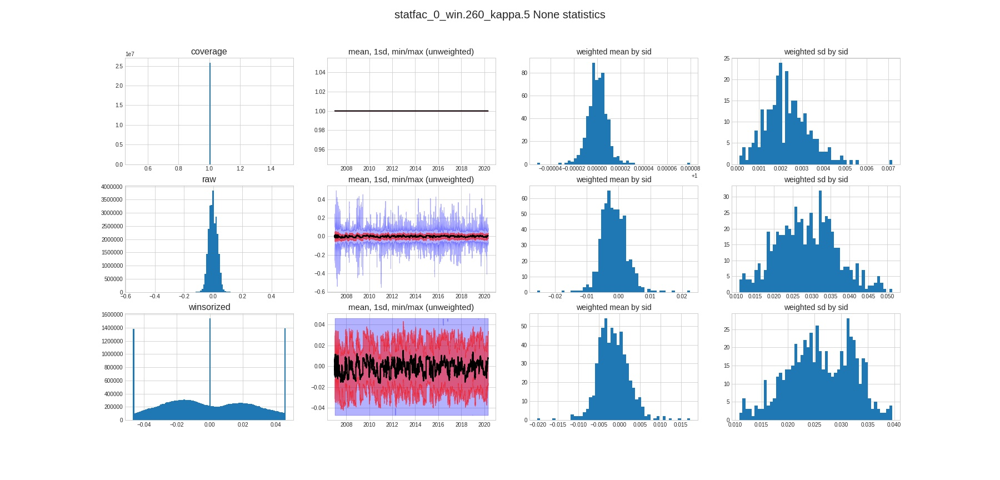

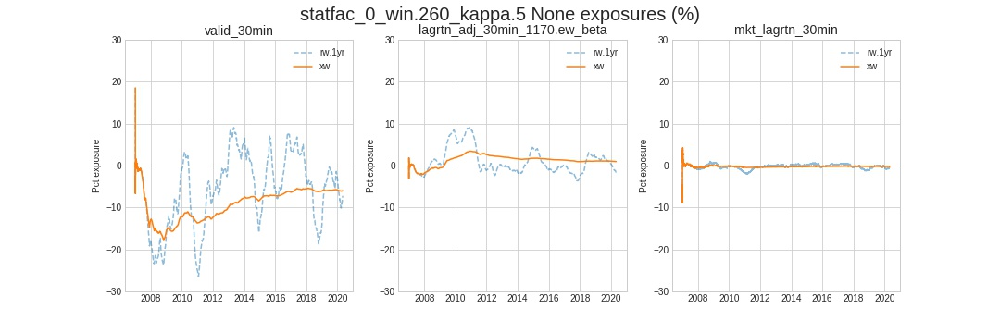

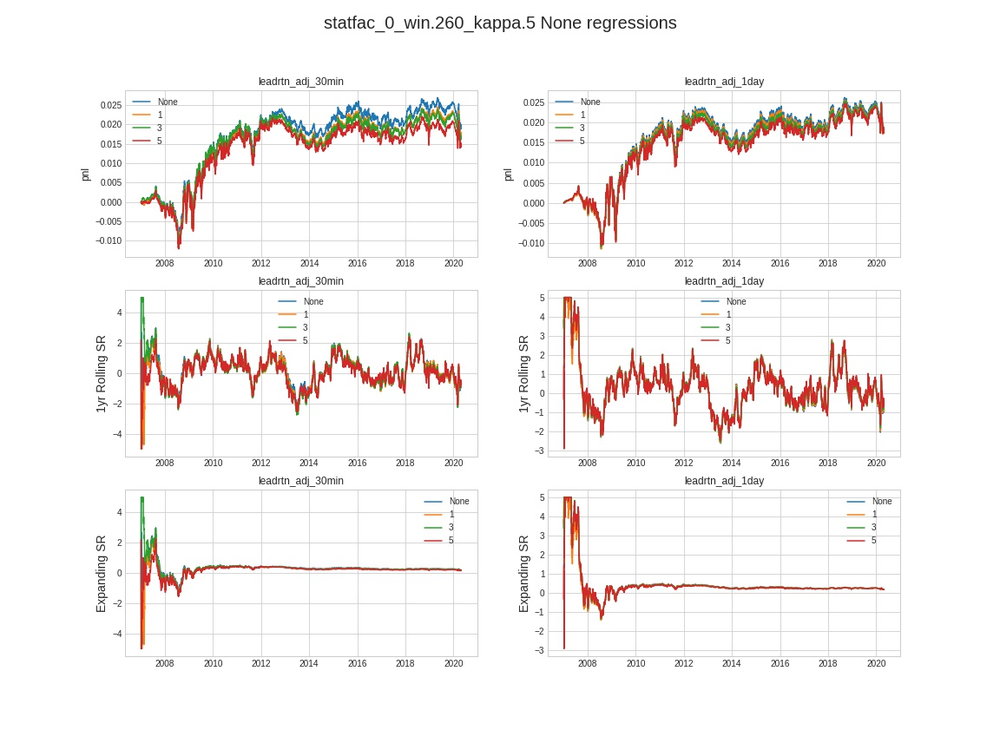

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,25804688,None,-0.576201,0.788712,1.629776e-08,0.000214,0.028427,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,25804688,0.948022,-0.459190,-0.033395,-0.000345,-1.192093e-07,-1.016469,-0.258589,0.982741,0.975035,0.903804
leadrtn_adj_1day,NaN,25804688,0.947569,-0.459190,-0.136254,-0.001245,1.549721e-06,-5.337074,-0.408867,0.982741,0.975035,0.903804
leadrtn_adj_30min,1.0,25804688,0.948012,-0.459402,-0.043057,-0.000000,0.000000e+00,-1.269455,-0.322786,0.982738,0.975032,0.903800
leadrtn_adj_1day,1.0,25804688,0.947559,-0.459402,-0.126760,-0.001315,1.728535e-06,-5.634570,-0.432348,0.982738,0.975032,0.903800
leadrtn_adj_30min,3.0,25804688,0.947991,-0.459784,0.010624,-0.000345,-1.192093e-07,-1.255146,-0.321418,0.982737,0.975029,0.903796
leadrtn_adj_1day,3.0,25804688,0.947538,-0.459784,-0.118563,-0.001292,1.668930e-06,-6.110210,-0.470380,0.982737,0.975029,0.903796
leadrtn_adj_30min,5.0,25804688,0.947970,-0.460172,-0.038963,-0.000345,-1.192093e-07,-1.385033,-0.353540,0.982732,0.975023,0.903789
leadrtn_adj_1day,5.0,25804688,0.947516,-0.460172,-0.140672,-0.001196,1.430511e-06,-6.660255,-0.513802,0.982732,0.975023,0.903789


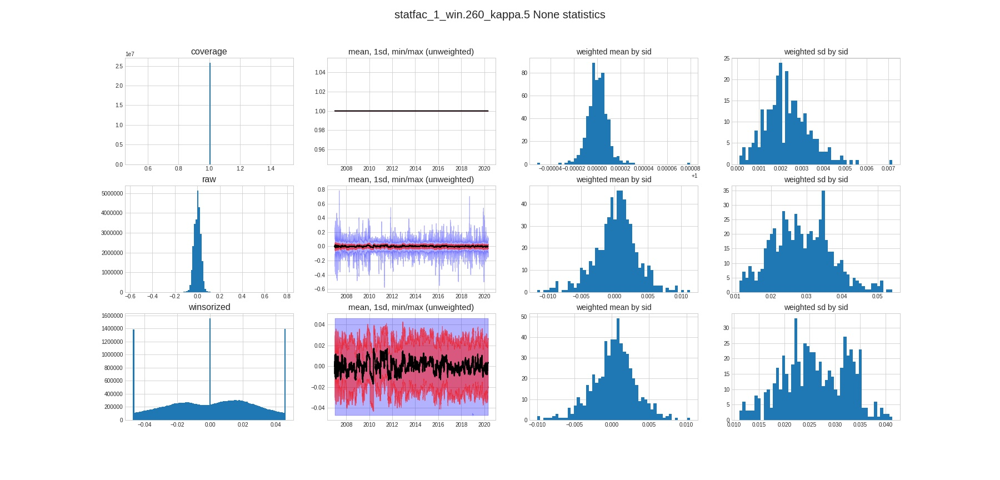

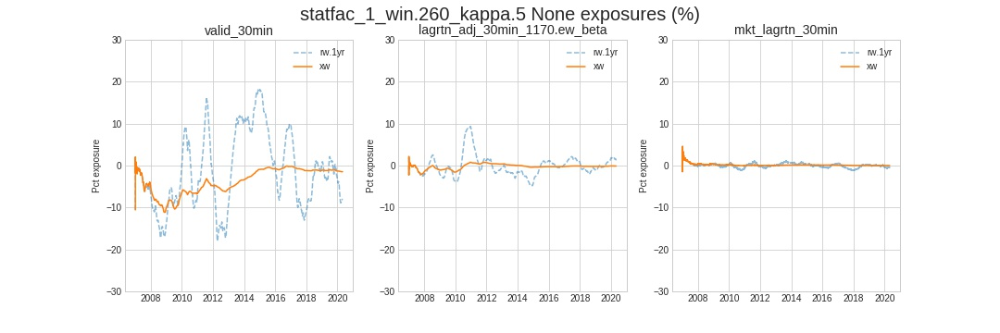

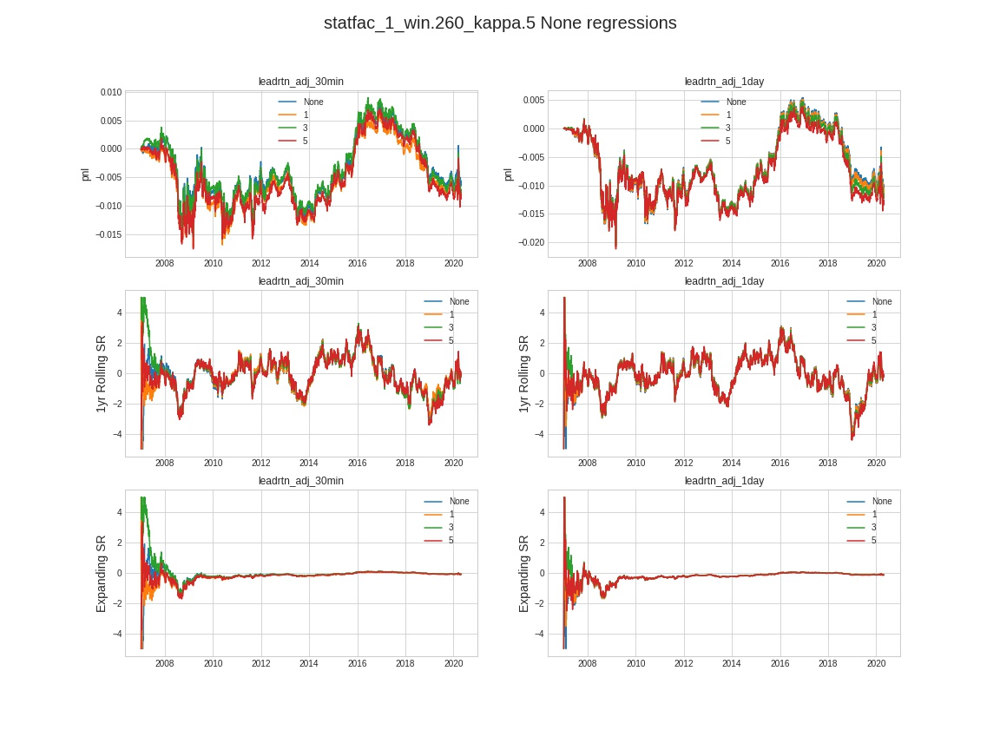

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,25804688,None,-0.55932,0.610456,-8.487074e-23,-0.000622,0.028262,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,25804688,0.948022,-1.335037,0.083571,0.001292,0.000002,7.147422,1.416481,0.977922,0.967780,0.892109
leadrtn_adj_1day,NaN,25804688,0.947569,-1.335037,0.278214,0.004535,0.000021,23.043669,1.388061,0.977922,0.967780,0.892109
leadrtn_adj_30min,1.0,25804688,0.948012,-1.335011,0.056849,0.001359,0.000002,6.683992,1.338162,0.977917,0.967776,0.892104
leadrtn_adj_1day,1.0,25804688,0.947559,-1.335011,0.264765,0.004462,0.000020,22.566723,1.363166,0.977917,0.967776,0.892104
leadrtn_adj_30min,3.0,25804688,0.947991,-1.334971,0.096024,0.001245,0.000002,7.026941,1.394291,0.977913,0.967770,0.892099
leadrtn_adj_1day,3.0,25804688,0.947538,-1.334971,0.272506,0.004250,0.000018,21.796850,1.319610,0.977913,0.967770,0.892099
leadrtn_adj_30min,5.0,25804688,0.947970,-1.334983,0.082846,0.001221,0.000001,7.336033,1.467502,0.977906,0.967763,0.892091
leadrtn_adj_1day,5.0,25804688,0.947516,-1.334983,0.253719,0.004071,0.000017,20.800783,1.262628,0.977906,0.967763,0.892091


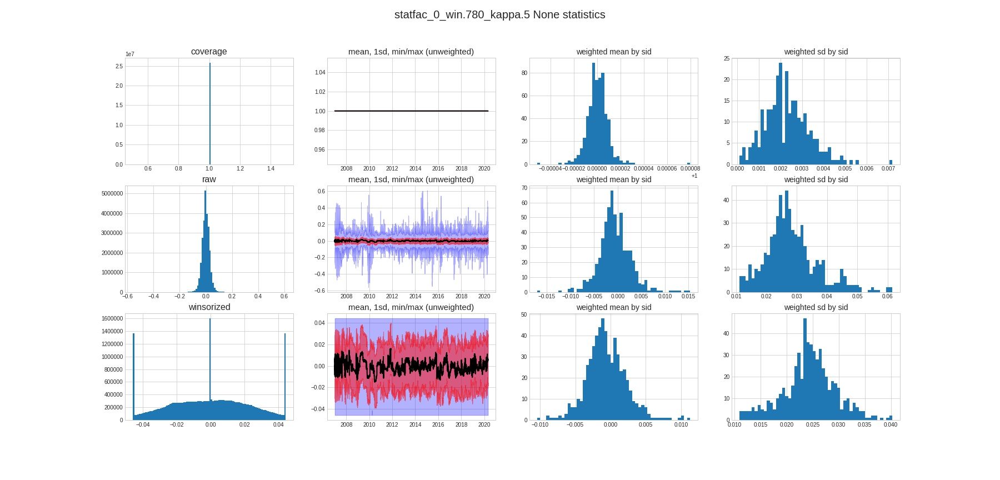

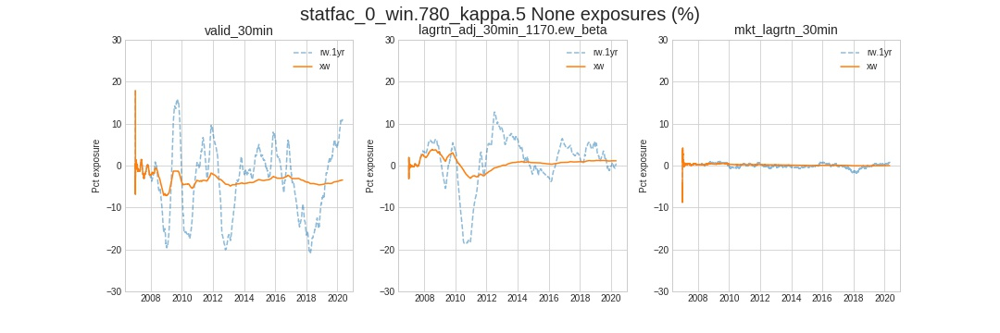

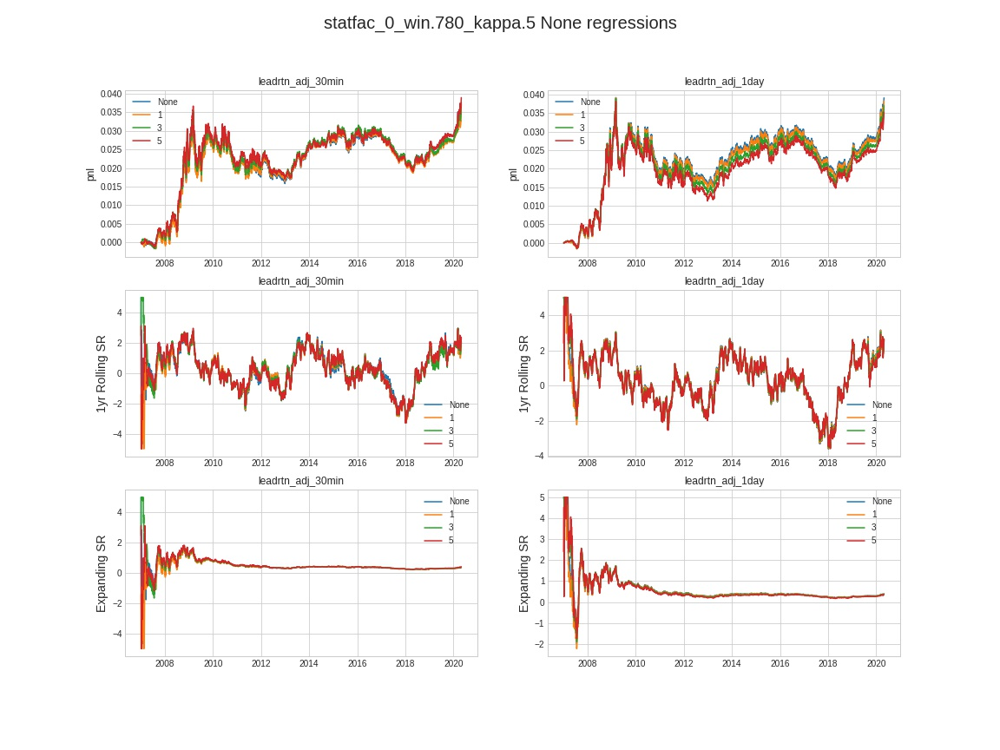

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,25804688,None,-0.525748,0.628151,0.000489,0.000968,0.028013,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,25804688,0.948022,2.533441,-0.078577,-0.000488,-2.384186e-07,-0.952229,-0.215179,0.977327,0.967058,0.894231
leadrtn_adj_1day,NaN,25804688,0.947569,2.533441,-0.282927,-0.001119,1.251698e-06,-5.872997,-0.403087,0.977327,0.967058,0.894231
leadrtn_adj_30min,1.0,25804688,0.948012,2.533829,-0.076843,-0.000345,-1.192093e-07,-1.790385,-0.408963,0.977327,0.967053,0.894225
leadrtn_adj_1day,1.0,25804688,0.947559,2.533829,-0.277581,-0.001145,1.311302e-06,-6.023889,-0.413614,0.977327,0.967053,0.894225
leadrtn_adj_30min,3.0,25804688,0.947991,2.534618,-0.021773,-0.000488,-2.384186e-07,-1.294956,-0.296927,0.977318,0.967048,0.894216
leadrtn_adj_1day,3.0,25804688,0.947538,2.534618,-0.250817,-0.001221,1.490116e-06,-5.495295,-0.377131,0.977318,0.967048,0.894216
leadrtn_adj_30min,5.0,25804688,0.947970,2.535394,-0.102524,-0.000000,0.000000e+00,-2.550790,-0.583237,0.977319,0.967049,0.894207
leadrtn_adj_1day,5.0,25804688,0.947516,2.535394,-0.256228,-0.001119,1.251698e-06,-4.957572,-0.339331,0.977319,0.967049,0.894207


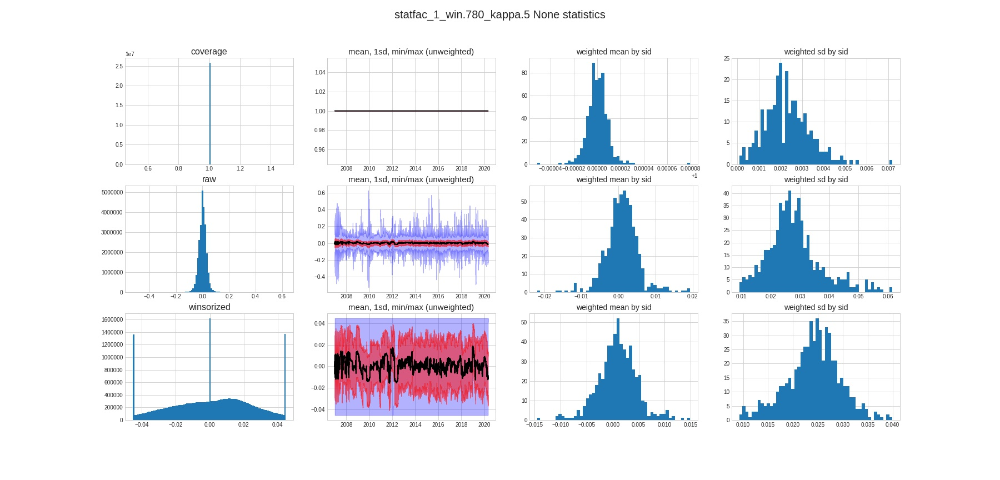

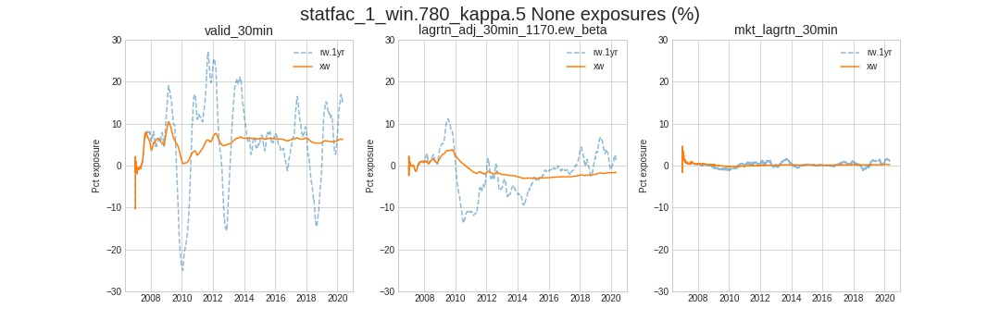

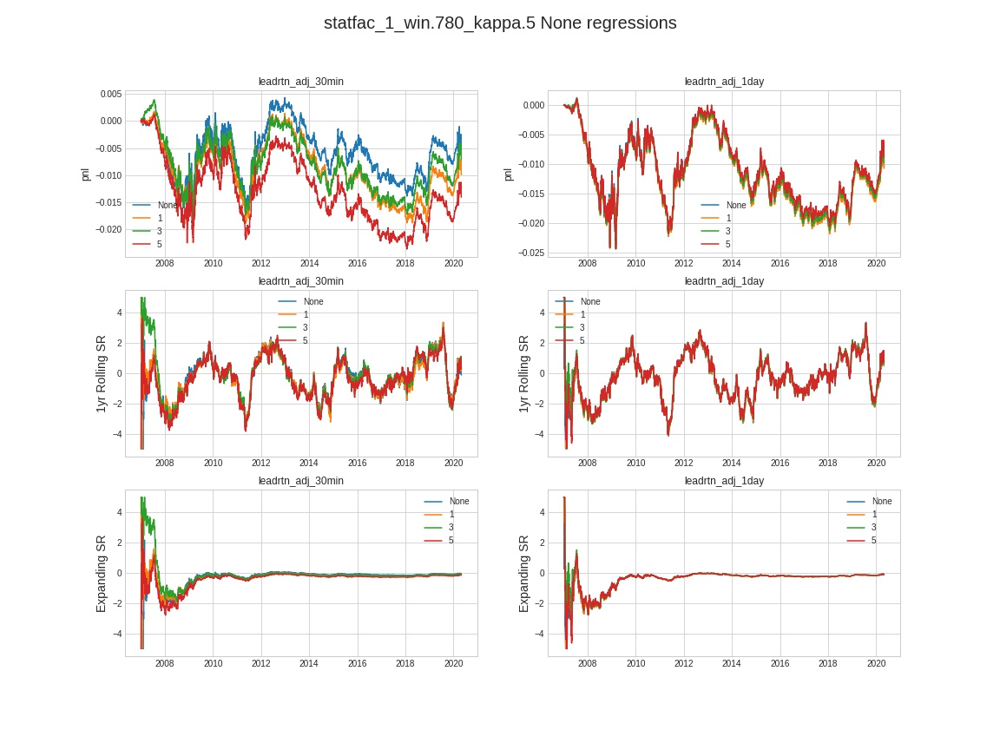

In [61]:
# all the checkpoints got corrupted - so hard load them and examine the results
stafac_runners = [
    'StatFacRunner_45cb47172',
    'StatFacRunner_6a65b9b64',
    'StatFacRunner_82448cd63',
    'StatFacRunner_a287b2c34',
    'StatFacRunner_c82d2c0ea',
    'StatFacRunner_f8e457f35',
    'StatFacRunner_79d854dd5',
]
for sfr in stafac_runners:    
    #result = statfac_runner.output_meta
    with open( f'/home/fj/local/checkpoints/{sfr}/output_meta.object.pickle', 'rb' ) as fp:
        result = pickle.load( fp )      
    #disp( 'factor correlations', result['corrs'], corr=True,  h=4 )
    #disp( 'factor autocorrelations', result['autocorrs'], corr=True, h=4 )
    #disp( 'runtime profiles', result['profiles'], h=4 )
    #disp( result['rho2_vs_r2'] )
    disp( result['rolling_r2'] )
    #disp( result['rolling_ortho_r2'] )    
    
    
# profile the statfacs    
data = xa.load_dataarray(f'/home/fj/local/checkpoints/{sfr}/output_data.dataarray.netcdf')     
fs_features=data.find_mx( '/statfac.*/' )

with mx.timer( 'computing feautre coorelations' ):
    corr_df = data.corr_mx( fs_features + hps.leading_rtns, weight='weight',  backend='numpy')
mx.disp( corr_df, corr=True )    

with mx.timer( 'running profile' ):
    #  -- profile the features
    profiler = mx.FeatureProfiler(
        returns=['leadrtn_adj_30min', 'leadrtn_adj_1day',],
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'mkt_lagrtn_30min'],
        transforms=None, weight='weight', winsorize=0.05, xs=None, start=None,
        lags=[1, 3, 5], autocorr=[1, 2, 13]
    ).set( verbose=False, memoize=True )
    profiler.data = data
    profiler.features = fs_features
    profiler.display()




## define the online runner operator

In [11]:
# define the onlinerunner operator
####################
@mx.operatorize( memoize=True, consumes_features=False, produces_features=True, produces_meta=True )
def OnlineRunner( da, hps, tensorboard=True, verbose=True ):
    ''' run one configuration end to end''' 
    logger = mx.Logger( 'OnlineRunner' )
    da_use = da.loc[hps.start:hps.end]
    # make sure you don't squeeze out this dimension !
    if hps.symbol:
        da_use = da_use.sel( symbol=mx.make_iterable(hps.symbol ) )            
    features = list( hps.features )
    output_features = []

    # this round about shit is because cloudpickl in the memoization fucks up nan checks in ema-updater
    if hps.transformer:
        tfs = []
        if hps.transformer.pre_normalize:
            tfs.append( mx.online.OnlineNorm( demean=True, normalize=True ) )
        if hps.transformer.quadratic:
            tfs.append( mx.online.OnlineFeatures( transform='quadratic')  )
        if hps.transformer.ema_halflifes:
            tfs.append( mx.online.OnlineEma( halflifes=hps.transformer.ema_halflifes ) )
        if hps.transformer.post_normalize:
            tfs.append( mx.online.OnlineNorm( demean=True, normalize=True ) )
        transformer = tr.nn.Sequential( *tfs )
    else:
        transformer = None

    if hps.pre_winsorize:
        with logger.timer( '# pre-winsorize teh input features'):
            wins = mx.transforms.batch( sid='symbol' ).winsorize( quantiles=0.05 )
            da_use = wins( da_use, features=features )
            features = wins.output_features
        
    X = da_use.loc[:, :, features ]
    Y = da_use.loc[:, :, [hps.target]]
    # advance the target  and add thsi to the lookahead
    if hps.target_shift:
        Y = Y.lag( -hps.target_shift )
        hps.lookahead += hps.target_shift
    W = da_use.loc[:, :, [hps.weight]]
    Z = da_use.loc[:,:, hps.ortho_features ]
    
    # demean X
    if hps.batch_demean:
        X = ( X - X.mean( dim=['time','symbol']) )
    if hps.batch_normalize:
        X = X / ( X.sq().mean( dim=['time','symbol']).sqrt() + 1e-13 )        
        
    for _ in range( 5 ):
        gc.collect(); tr.cuda.empty_cache()

    Xt = X.fillna(0).to_tensor( dtype=dtype, device=device )
    Yt = Y.fillna(0).to_tensor( dtype=dtype, device=device )
    Wt = W.fillna(0).to_tensor( dtype=dtype, device=device )
    Zt = Z.fillna(0).to_tensor( dtype=dtype, device=device )
    
    with logger.timer(" the linear rnn learner"):
        linear_rnn = mx.online.OnlineRNN(
            lookahead=hps.lookahead, 
            ridge=hps.ridge, 
            kappa=hps.kappa, 
            algo=hps.algo,
            halflife_1=hps.hl_1,
            halflife_2=hps.hl_2,
            lr=hps.lr,
            tv=hps.rnn_tv,
            ortho=hps.ortho,
            use_omega=hps.use_omega,
            omega_lr=hps.omega_lr,
            omega_ridge=hps.omega_ridge,
            omega_shift=hps.omega_shift,
            halflife_ortho=hps.ortho_hl,
            transformer=transformer,            
        ) 
        linear_rnn.verbose = verbose 
        Yht, meta, state = linear_rnn( X=Xt, Y=Yt, W=Wt, Z=Zt, )    
        disp( 'runtimes for the online rnn', linear_rnn.profiles )
        del linear_rnn;    tr.cuda.empty_cache()        
        # convert resutls to dataarray
        output_feature = f'{hps.target}_hat'
        da_use = da_use.assign_features( **{output_feature: Yht.squeeze(-1).to_dataarray( Y.squeeze(axis=-1) )  } )
        output_features.append( output_feature )        

    # drop some initial data for online priming
    da_use = da_use[500:]
    del Xt, Yt, Wt, Zt, Yht;    
    for _ in range( 5 ):
        gc.collect(); tr.cuda.empty_cache()

    
    with logger.timer('  winsorizations'):
        wins = mx.transforms.batch( sid='symbol' ).winsorize( quantiles=0.05 )
        da_use = wins( da_use, features=output_features )    
        output_features += wins.output_features

    with logger.timer( 'profiling ' ): 
        profiler = mx.FeatureProfiler(
            returns=['leadrtn_adj_30min', 'leadrtn_adj_1hr' ],
            exposures=hps.exposures,
            transforms=None, weight=hps.weight, winsorize=None, xs=None, 
            lags=[1, 2], autocorr=[1, 2, 13], remove_intercept=False,
        ).set(verbose=False, memoize=False)
        profiler.data = da_use
        profiler.features = output_features
        profiler.run()
    
    return da_use, output_features,  profiler.output_meta

## Baseline
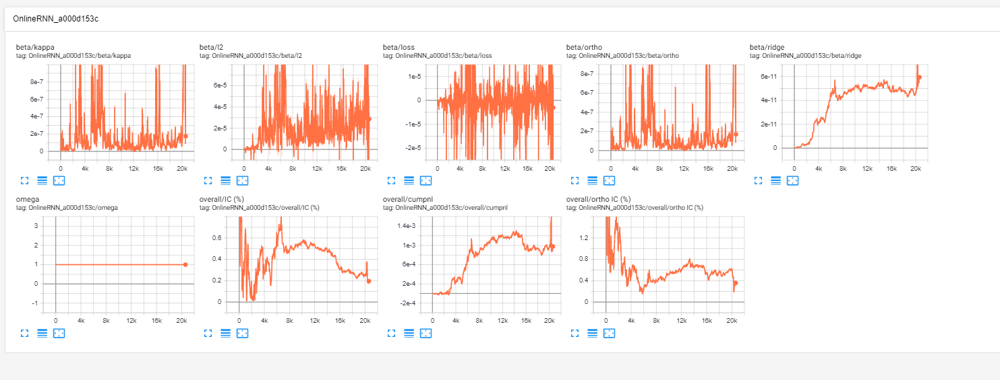

In [ ]:
# online learning 
##################

%inline
data = xa.load_dataarray(f'/home/fj/local/checkpoints/StatFacRunner_79d854dd5/output_data.dataarray.netcdf')     


technical_features=[
    'true_range_30min', 'true_range_0D.12h', 'true_range_2D.12h', 'true_range_5D',
    'direction_30min', 'direction_0D.12h', 'direction_2D.12h', 'direction_5D',
    #'delta_rtn_30min', 'delta_rtn_0D.12h', 'delta_rtn_2D.12h', 'delta_rtn_5D',
    'ttp_high_adj_0D.12h', 'ttp_high_adj_2D.12h', 'ttp_high_adj_5D',
    'ttp_low_adj_0D.12h', 'ttp_low_adj_2D.12h', 'ttp_low_adj_5D',    
]
statfacs = mx.HPSet(
    neg_kappa=data.find_mx('/statfac.*_kappa.-5/'),
    no_kappa=data.find_mx('/statfac.*_kappa.None/'),
    pos_kappa=data.find_mx('/statfac.*_kappa.5/'),
    short_win=data.find_mx('/statfac.*_win.65.*/'),
    long_win=data.find_mx('/statfac.*_win.780.*/'),
    features=data.find_mx('/statfac.*/'),
)    

disp( mx.tensorboard.start_server() )
disp( mx.tensorboard.start( clear=True ) )
  
hps.online = mx.HPSet(
    start='20140101',
    end=hps.end,
    features=sorted( set(
        []
        +['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid',  ] 
        + hps.feature_set.lagging 
#         + hps.feature_set.vol 
#         + hps.feature_set.log_volumes
#         #+ hps.feature_set.calendar
#         + hps.feature_set.mkt 
#         + hps.feature_set.betas
#          + hps.feature_set.technical
#          + hps.feature_set.afacs
#        + statfacs.features        
    ) ),
    symbol=None,
    target='leadrtn_adj_30min',
    target_shift=None, # advance the target
    lookahead=2,
    ridge=1e-5,
    hl_1 = None,
    hl_2 = None,
    lr = 500,
    kappa=2, # util penalty
    rnn_tv=None, #{1:1, 2:1, 13:1e-1},
    ortho=2,
    ortho_hl=13*10,
    # orthogonalize out short term mean reversion
    ortho_features = ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day'] + hps.feature_set.betas, # + hps.feature_set.statfac,
    weight='valid_30min',
    algo='mbprox', 
    # stuff related to sid weighting
    use_omega=None,
    omega_lr = 10,
    omega_ridge = 0,
    omega_shift = 0.1,
    pre_winsorize=0.01,
    batch_demean=False,
    batch_normalize=False,
    transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=[13*5, 13*20, 13*40],  ),
    exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']
)

#--- run a basic configuration ---
if True:
    hpso = hps.online
    runner = OnlineRunner( hps=hpso, verbose=True ).set( memoize=True )
    runner.data = data
    disp( f'Running runner={runner.hash()} with hps={hpso.hash()}', h=2 )
    dfo = runner( )
    disp( hpso )
    for profile in runner.output_meta                    :
        main_fig = profile.pop( 'main_fig' )
        exp_fig = profile.pop( 'exp_fig' )
        reg_fig = profile.pop( 'reg_fig' )
        reg_df = profile.pop( 'regressions' )
        if not reg_df.empty:
            reg_df = reg_df.set_index( ['returns', 'lag'] )
        disp( profile.pop( 'feature' ), profile.pop( 'transform' ), h=3, hr=True )
        # disp( pd.DataFrame( profile, index=['value'] ) )
        disp( 'Regressions', reg_df, h=4 )
        # disp( main_fig )
        disp( exp_fig )
        disp( reg_fig )  

    

## Online model with all statfac features and no statfac resisdualization
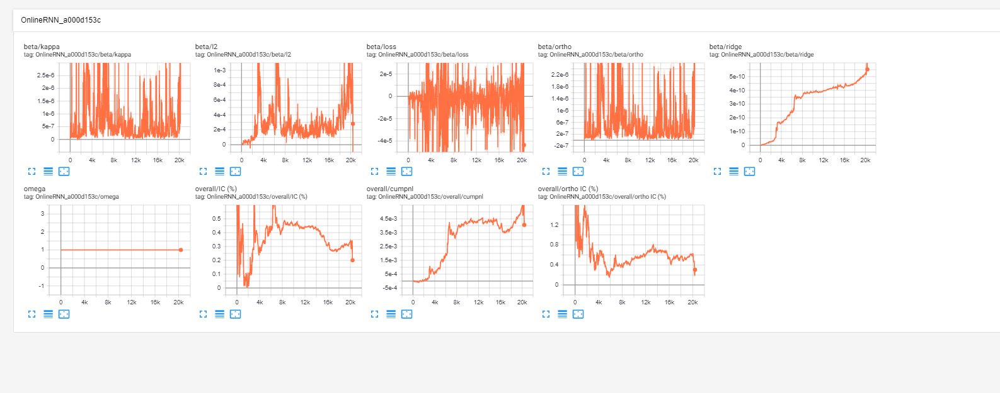

In [ ]:
# online learning with with statface features
########################################

%inline
data = xa.load_dataarray(f'/home/fj/local/checkpoints/StatFacRunner_79d854dd5/output_data.dataarray.netcdf')     


technical_features=[
    'true_range_30min', 'true_range_0D.12h', 'true_range_2D.12h', 'true_range_5D',
    'direction_30min', 'direction_0D.12h', 'direction_2D.12h', 'direction_5D',
    #'delta_rtn_30min', 'delta_rtn_0D.12h', 'delta_rtn_2D.12h', 'delta_rtn_5D',
    'ttp_high_adj_0D.12h', 'ttp_high_adj_2D.12h', 'ttp_high_adj_5D',
    'ttp_low_adj_0D.12h', 'ttp_low_adj_2D.12h', 'ttp_low_adj_5D',    
]
statfacs = mx.HPSet(
    neg_kappa=data.find_mx('/statfac.*_kappa.-5/'),
    no_kappa=data.find_mx('/statfac.*_kappa.None/'),
    pos_kappa=data.find_mx('/statfac.*_kappa.5/'),
    short_win=data.find_mx('/statfac.*_win.65.*/'),
    long_win=data.find_mx('/statfac.*_win.780.*/'),
    features=data.find_mx('/statfac.*/'),
)    

disp( mx.tensorboard.start_server() )
disp( mx.tensorboard.start( clear=True ) )
  
hps.online = mx.HPSet(
    start='20140101',
    end=hps.end,
    features=sorted( set(
        []
        +['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid',  ] 
        + hps.feature_set.lagging 
#         + hps.feature_set.vol 
#         + hps.feature_set.log_volumes
#         #+ hps.feature_set.calendar
#         + hps.feature_set.mkt 
#         + hps.feature_set.betas
#          + hps.feature_set.technical
#          + hps.feature_set.afacs
        + statfacs.features        
    ) ),
    symbol=None,
    target='leadrtn_adj_30min',
    target_shift=None, # advance the target
    lookahead=2,
    ridge=1e-5,
    hl_1 = None,
    hl_2 = None,
    lr = 500,
    kappa=2, # util penalty
    rnn_tv=None, #{1:1, 2:1, 13:1e-1},
    ortho=2,
    ortho_hl=13*10,
    # orthogonalize out short term mean reversion
    ortho_features = ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day'] + hps.feature_set.betas, # + hps.feature_set.statfac,
    weight='valid_30min',
    algo='mbprox', 
    # stuff related to sid weighting
    use_omega=None,
    omega_lr = 10,
    omega_ridge = 0,
    omega_shift = 0.1,
    pre_winsorize=0.01,
    batch_demean=False,
    batch_normalize=False,
    transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=[13*5, 13*20, 13*40],  ),
    exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']
)

#--- run a basic configuration ---
if True:
    hpso = hps.online
    runner = OnlineRunner( hps=hpso, verbose=True ).set( memoize=True )
    runner.data = data
    disp( f'Running runner={runner.hash()} with hps={hpso.hash()}', h=2 )
    dfo = runner( )
    disp( hpso )
    for profile in runner.output_meta                    :
        main_fig = profile.pop( 'main_fig' )
        exp_fig = profile.pop( 'exp_fig' )
        reg_fig = profile.pop( 'reg_fig' )
        reg_df = profile.pop( 'regressions' )
        if not reg_df.empty:
            reg_df = reg_df.set_index( ['returns', 'lag'] )
        disp( profile.pop( 'feature' ), profile.pop( 'transform' ), h=3, hr=True )
        # disp( pd.DataFrame( profile, index=['value'] ) )
        disp( 'Regressions', reg_df, h=4 )
        # disp( main_fig )
        disp( exp_fig )
        disp( reg_fig )  

    

## Online model with all statfac features and statfac residualization
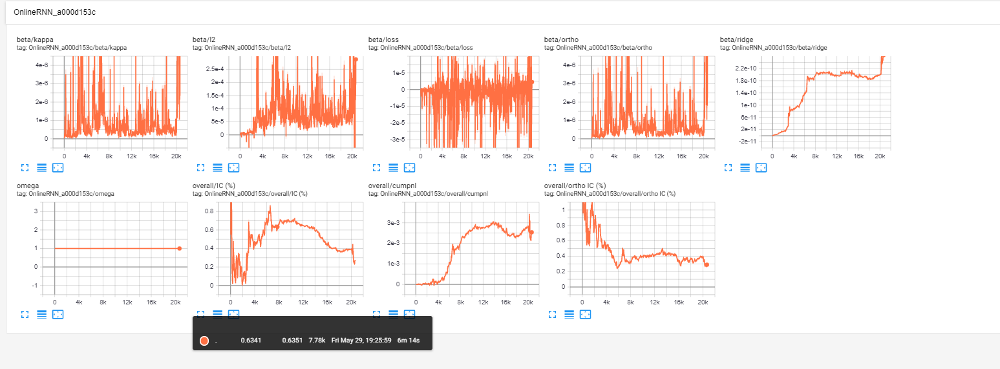

,num_calls,duration_total,duration_mean,duration_squared,duration_std
_one_step_in_beta,20683,778.504458,0.037638,1.422678e-03,0.002461
_one_step_in_omega,20683,0.766147,0.000037,1.567692e-09,0.000014


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,11948336,0.891191,-2.177386,0.257488,0.002878,0.000008,8.979140,1.777370,0.609106,0.548610,0.438693
leadrtn_adj_1hr,NaN,11948336,0.891145,-2.177386,0.207578,0.002919,0.000009,9.367277,1.379279,0.609106,0.548610,0.438693
leadrtn_adj_30min,1.0,11948336,0.891149,-2.752763,-0.030766,0.000000,0.000000,2.893545,0.540588,0.614948,0.552951,0.442603
leadrtn_adj_1hr,1.0,11948336,0.891103,-2.752763,-0.003837,0.002086,0.000004,6.641140,0.873817,0.614948,0.552951,0.442603
leadrtn_adj_30min,2.0,11948336,0.891105,-2.794883,0.070266,0.002277,0.000005,7.379762,1.290371,0.615687,0.553918,0.442939
leadrtn_adj_1hr,2.0,11948336,0.891058,-2.794883,0.088245,0.001794,0.000003,6.148283,0.848483,0.615687,0.553918,0.442939


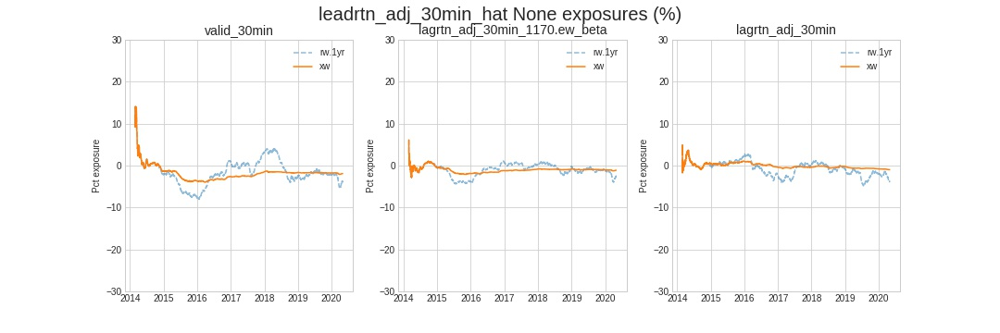

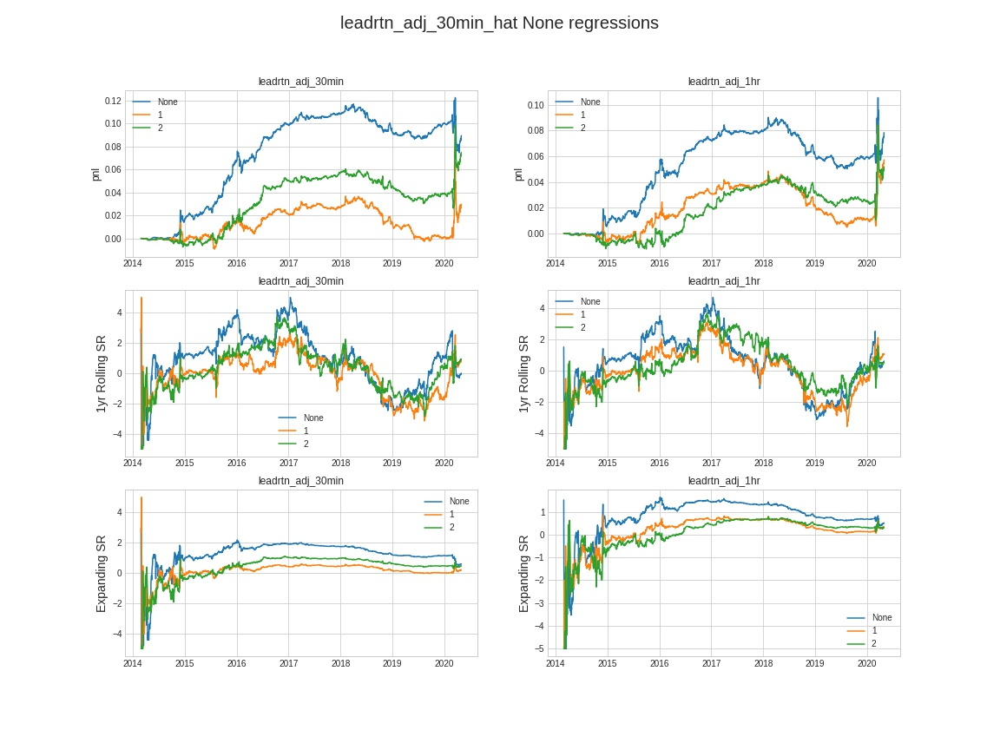

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,11948336,0.891191,-3.278678,0.355437,0.004012,0.000016,12.909687,3.330148,0.611263,0.550721,0.460626
leadrtn_adj_1hr,NaN,11948336,0.891145,-3.278678,0.331331,0.004305,0.000019,13.780819,2.600975,0.611263,0.550721,0.460626
leadrtn_adj_30min,1.0,11948336,0.891149,-4.096395,0.030107,0.001674,0.000003,5.104465,1.229176,0.616210,0.554755,0.463429
leadrtn_adj_1hr,1.0,11948336,0.891103,-4.096395,0.094338,0.003303,0.000011,10.541752,1.708136,0.616210,0.554755,0.463429
leadrtn_adj_30min,2.0,11948336,0.891105,-4.144591,0.145285,0.003330,0.000011,10.434072,2.102514,0.617087,0.555878,0.464151
leadrtn_adj_1hr,2.0,11948336,0.891058,-4.144591,0.199540,0.003461,0.000012,11.396970,1.869706,0.617087,0.555878,0.464151


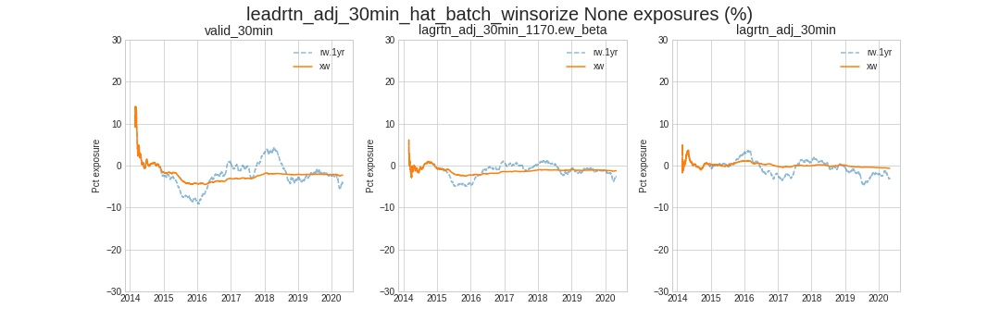

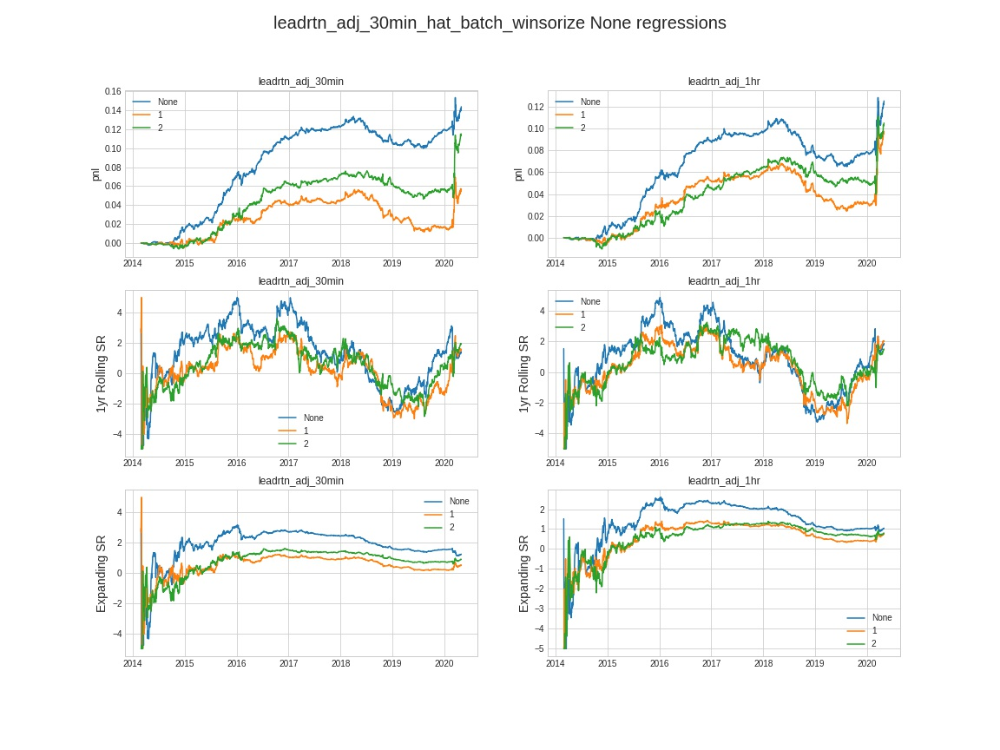

In [18]:
# online learning 
#################

%inline
data = xa.load_dataarray(f'/home/fj/local/checkpoints/StatFacRunner_79d854dd5/output_data.dataarray.netcdf')     


technical_features=[
    'true_range_30min', 'true_range_0D.12h', 'true_range_2D.12h', 'true_range_5D',
    'direction_30min', 'direction_0D.12h', 'direction_2D.12h', 'direction_5D',
    #'delta_rtn_30min', 'delta_rtn_0D.12h', 'delta_rtn_2D.12h', 'delta_rtn_5D',
    'ttp_high_adj_0D.12h', 'ttp_high_adj_2D.12h', 'ttp_high_adj_5D',
    'ttp_low_adj_0D.12h', 'ttp_low_adj_2D.12h', 'ttp_low_adj_5D',    
]
statfacs = mx.HPSet(
    neg_kappa=data.find_mx('/statfac.*_kappa.-5/'),
    no_kappa=data.find_mx('/statfac.*_kappa.None/'),
    pos_kappa=data.find_mx('/statfac.*_kappa.5/'),
    short_win=data.find_mx('/statfac.*_win.65.*/'),
    long_win=data.find_mx('/statfac.*_win.780.*/'),
    features=data.find_mx('/statfac.*/'),
)    

disp( mx.tensorboard.start_server() )
disp( mx.tensorboard.start( clear=True ) )
  
hps.online = mx.HPSet(
    start='20140101',
    end=hps.end,
    features=sorted( set(
        []
        +['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid',  ] 
        + hps.feature_set.lagging 
#         + hps.feature_set.vol 
#         + hps.feature_set.log_volumes
#         #+ hps.feature_set.calendar
#         + hps.feature_set.mkt 
#         + hps.feature_set.betas
#          + hps.feature_set.technical
#          + hps.feature_set.afacs
        + statfacs.features        
    ) ),
    symbol=None,
    target='leadrtn_adj_30min',
    target_shift=None, # advance the target
    lookahead=2,
    ridge=1e-5,
    hl_1 = None,
    hl_2 = None,
    lr = 500,
    kappa=2, # util penalty
    rnn_tv=None, #{1:1, 2:1, 13:1e-1},
    ortho=2,
    ortho_hl=13*10,
    # orthogonalize out short term mean reversion
    ortho_features = ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day'] + hps.feature_set.betas + statfacs.features,
    weight='valid_30min',
    algo='mbprox', 
    # stuff related to sid weighting
    use_omega=None,
    omega_lr = 10,
    omega_ridge = 0,
    omega_shift = 0.1,
    pre_winsorize=0.01,
    batch_demean=False,
    batch_normalize=False,
    transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=[13*5, 13*20, 13*40],  ),
    exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']
)

#--- run a basic configuration ---
if True:
    hpso = hps.online
    runner = OnlineRunner( hps=hpso, verbose=True ).set( memoize=True )
    runner.data = data
    disp( f'Running runner={runner.hash()} with hps={hpso.hash()}', h=2 )
    dfo = runner( )
    disp( hpso )
    for profile in runner.output_meta                    :
        main_fig = profile.pop( 'main_fig' )
        exp_fig = profile.pop( 'exp_fig' )
        reg_fig = profile.pop( 'reg_fig' )
        reg_df = profile.pop( 'regressions' )
        if not reg_df.empty:
            reg_df = reg_df.set_index( ['returns', 'lag'] )
        disp( profile.pop( 'feature' ), profile.pop( 'transform' ), h=3, hr=True )
        # disp( pd.DataFrame( profile, index=['value'] ) )
        disp( 'Regressions', reg_df, h=4 )
        # disp( main_fig )
        disp( exp_fig )
        disp( reg_fig )  

    

## Online model with all statfac features and hl_1,2 and statfac residualization for negative kappa factors and omega
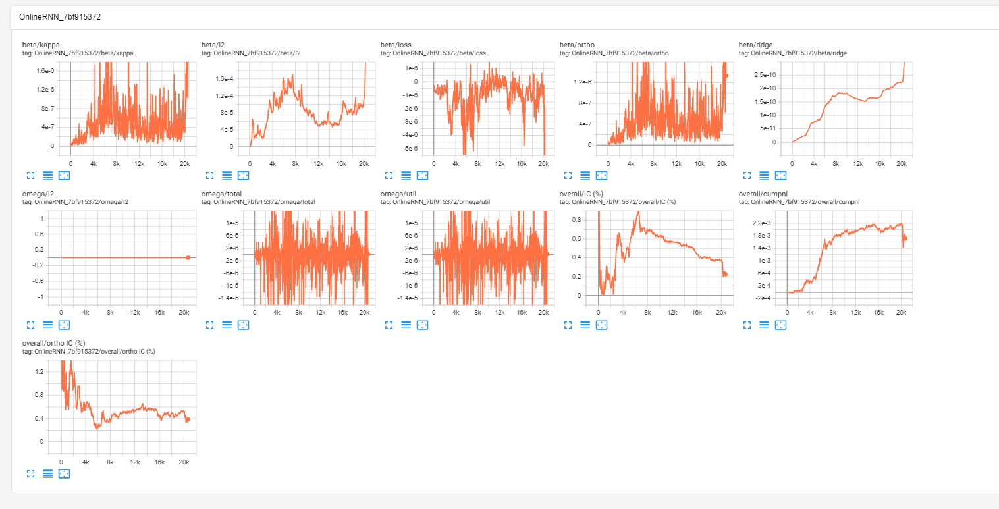

,num_calls,duration_total,duration_mean,duration_squared,duration_std
_one_step_in_beta,20683,891.434821,0.043098,0.001875,0.004185
_one_step_in_omega,20683,36.572332,0.001768,0.000003,0.000181


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,11948336,0.891191,-0.592138,0.326600,0.002441,5.960464e-06,7.398234,1.820103,0.800447,0.774210,0.721189
leadrtn_adj_1hr,NaN,11948336,0.891145,-0.592138,0.258585,0.001485,2.205372e-06,4.126777,0.712863,0.800447,0.774210,0.721189
leadrtn_adj_30min,1.0,11948336,0.891149,-0.742473,0.053147,-0.000000,0.000000e+00,-1.006405,-0.252260,0.804795,0.777362,0.723885
leadrtn_adj_1hr,1.0,11948336,0.891103,-0.742473,0.080293,-0.000345,-1.192093e-07,-1.411815,-0.243777,0.804795,0.777362,0.723885
leadrtn_adj_30min,2.0,11948336,0.891105,-0.741358,0.101095,0.000691,-4.768372e-07,1.477390,0.360429,0.805416,0.778081,0.724276
leadrtn_adj_1hr,2.0,11948336,0.891058,-0.741358,0.174239,-0.000732,5.364418e-07,-1.439635,-0.251719,0.805416,0.778081,0.724276


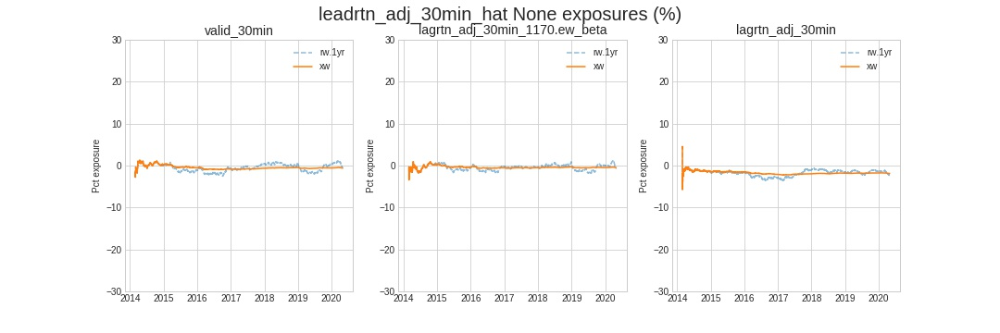

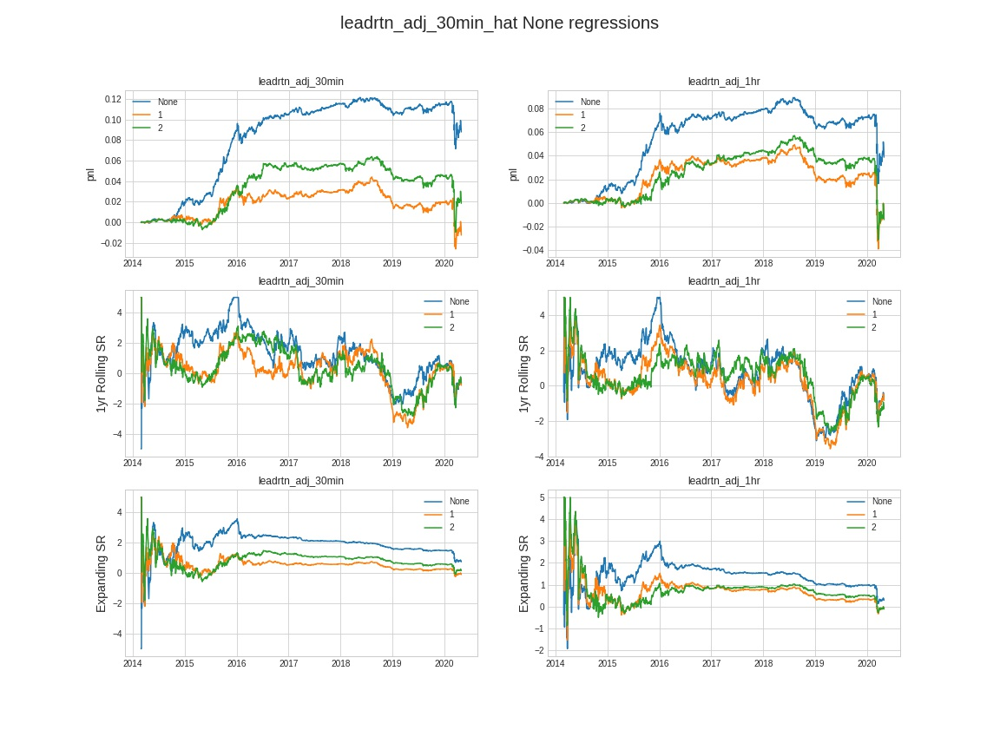

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,11948336,0.891191,-1.258687,0.338935,0.002238,5.006790e-06,6.913821,1.952530,0.820866,0.794000,0.740793
leadrtn_adj_1hr,NaN,11948336,0.891145,-1.258687,0.277316,0.001269,1.609325e-06,3.884279,0.806417,0.820866,0.794000,0.740793
leadrtn_adj_30min,1.0,11948336,0.891149,-1.445656,0.061798,-0.000488,2.384186e-07,-1.201895,-0.356966,0.823609,0.796136,0.742155
leadrtn_adj_1hr,1.0,11948336,0.891103,-1.445656,0.078534,-0.000488,2.384186e-07,-1.743667,-0.366549,0.823609,0.796136,0.742155
leadrtn_adj_30min,2.0,11948336,0.891105,-1.442837,0.083417,0.000691,-4.768372e-07,0.479004,0.140601,0.824160,0.796874,0.742734
leadrtn_adj_1hr,2.0,11948336,0.891058,-1.442837,0.162329,-0.000691,4.768372e-07,-1.444730,-0.311077,0.824160,0.796874,0.742734


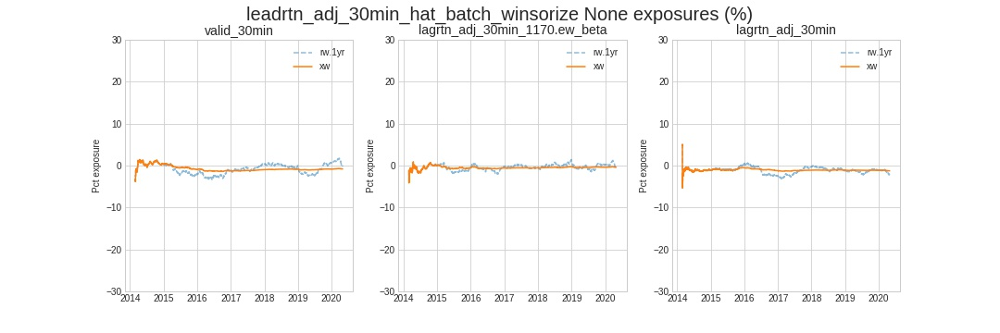

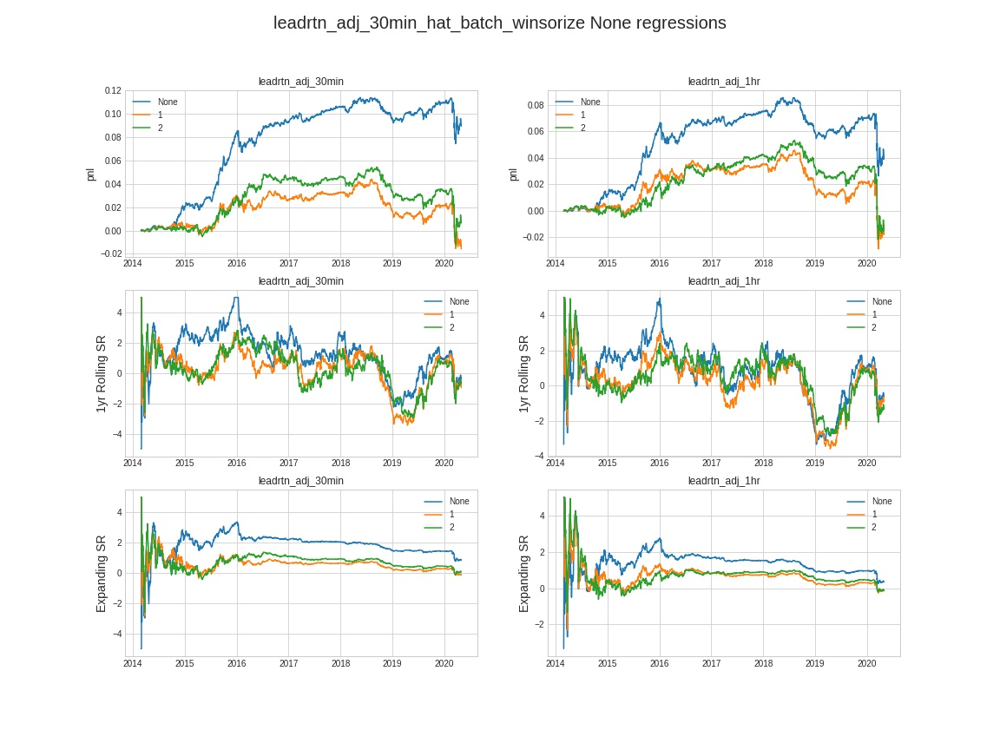

In [19]:
# online learning 
#################

%inline
data = xa.load_dataarray(f'/home/fj/local/checkpoints/StatFacRunner_79d854dd5/output_data.dataarray.netcdf')     


technical_features=[
    'true_range_30min', 'true_range_0D.12h', 'true_range_2D.12h', 'true_range_5D',
    'direction_30min', 'direction_0D.12h', 'direction_2D.12h', 'direction_5D',
    #'delta_rtn_30min', 'delta_rtn_0D.12h', 'delta_rtn_2D.12h', 'delta_rtn_5D',
    'ttp_high_adj_0D.12h', 'ttp_high_adj_2D.12h', 'ttp_high_adj_5D',
    'ttp_low_adj_0D.12h', 'ttp_low_adj_2D.12h', 'ttp_low_adj_5D',    
]
statfacs = mx.HPSet(
    neg_kappa=data.find_mx('/statfac.*_kappa.-5/'),
    no_kappa=data.find_mx('/statfac.*_kappa.None/'),
    pos_kappa=data.find_mx('/statfac.*_kappa.5/'),
    short_win=data.find_mx('/statfac.*_win.65.*/'),
    long_win=data.find_mx('/statfac.*_win.780.*/'),
    features=data.find_mx('/statfac.*/'),
)    

disp( mx.tensorboard.start_server() )
disp( mx.tensorboard.start( clear=True ) )
  
hps.online = mx.HPSet(
    start='20140101',
    end=hps.end,
    features=sorted( set(
        []
        +['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid',  ] 
        + hps.feature_set.lagging 
#         + hps.feature_set.vol 
#         + hps.feature_set.log_volumes
#         #+ hps.feature_set.calendar
#         + hps.feature_set.mkt 
#         + hps.feature_set.betas
#          + hps.feature_set.technical
#          + hps.feature_set.afacs
        + statfacs.features        
    ) ),
    symbol=None,
    target='leadrtn_adj_30min',
    target_shift=None, # advance the target
    lookahead=2,
    ridge=1e-5,
    hl_1 = 50,
    hl_2 = 1000,
    lr = 500,
    kappa=2, # util penalty
    rnn_tv=None, #{1:1, 2:1, 13:1e-1},
    ortho=2,
    ortho_hl=13,
    # orthogonalize out short term mean reversion
    ortho_features = ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day'] + hps.feature_set.betas + statfacs.neg_kappa,
    weight='valid_30min',
    algo='mbprox', 
    # stuff related to sid weighting
    use_omega='P',
    omega_lr = 10,
    omega_ridge = 0,
    omega_shift = 0.1,
    pre_winsorize=0.01,
    batch_demean=False,
    batch_normalize=False,
    transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=[13*5, 13*20, 13*40],  ),
    exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']
)

#--- run a basic configuration ---
if True:
    hpso = hps.online
    runner = OnlineRunner( hps=hpso, verbose=True ).set( memoize=True )
    runner.data = data
    disp( f'Running runner={runner.hash()} with hps={hpso.hash()}', h=2 )
    dfo = runner( )
    disp( hpso )
    for profile in runner.output_meta                    :
        main_fig = profile.pop( 'main_fig' )
        exp_fig = profile.pop( 'exp_fig' )
        reg_fig = profile.pop( 'reg_fig' )
        reg_df = profile.pop( 'regressions' )
        if not reg_df.empty:
            reg_df = reg_df.set_index( ['returns', 'lag'] )
        disp( profile.pop( 'feature' ), profile.pop( 'transform' ), h=3, hr=True )
        # disp( pd.DataFrame( profile, index=['value'] ) )
        disp( 'Regressions', reg_df, h=4 )
        # disp( main_fig )
        disp( exp_fig )
        disp( reg_fig )   

## Online model with all statfac features , no  hl_1,2, agressive statfac residualization for negative kappa factors, no omega

,num_calls,duration_total,duration_mean,duration_squared,duration_std
_one_step_in_beta,20683,801.413515,0.038746,1.513208e-03,0.003462
_one_step_in_omega,20683,0.706503,0.000034,1.419347e-09,0.000016


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,11948336,0.891191,-0.772740,0.298488,0.002652,7.033348e-06,8.223895,1.920427,0.742435,0.716598,0.616870
leadrtn_adj_1hr,NaN,11948336,0.891145,-0.772740,0.239977,0.002837,8.046627e-06,8.901321,1.566637,0.742435,0.716598,0.616870
leadrtn_adj_30min,1.0,11948336,0.891149,-1.630117,0.030824,0.000345,-1.192093e-07,2.367023,0.573112,0.746256,0.718649,0.618819
leadrtn_adj_1hr,1.0,11948336,0.891103,-1.630117,0.078899,0.001726,2.980232e-06,5.882658,1.156127,0.746256,0.718649,0.618819
leadrtn_adj_30min,2.0,11948336,0.891105,-1.672975,0.094210,0.001998,3.993511e-06,6.122839,1.698660,0.746645,0.718762,0.618540
leadrtn_adj_1hr,2.0,11948336,0.891058,-1.672975,0.124894,0.001221,1.490116e-06,4.229627,0.835774,0.746645,0.718762,0.618540


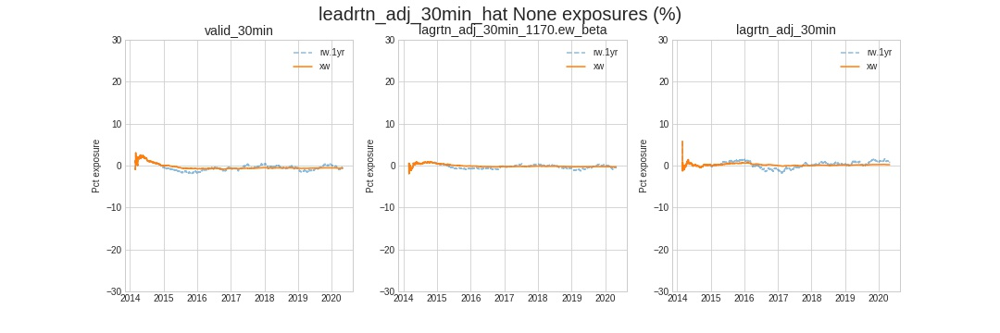

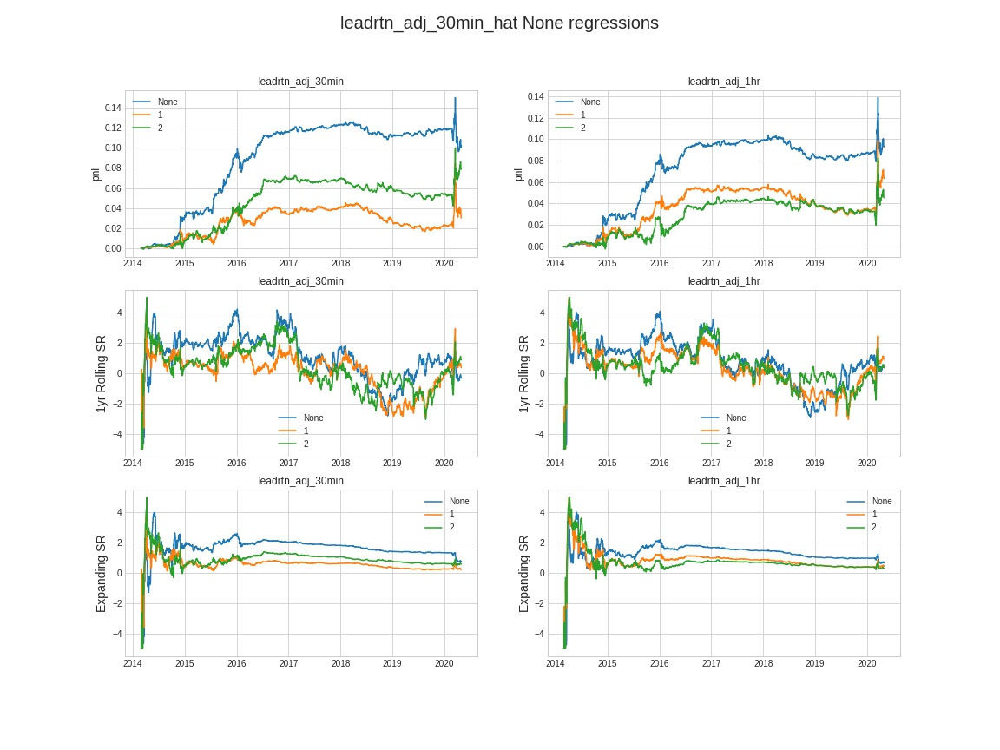

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,11948336,0.891191,-2.371866,0.366412,0.003020,0.000009,9.277909,2.713285,0.747681,0.721746,0.639936
leadrtn_adj_1hr,NaN,11948336,0.891145,-2.371866,0.325187,0.003294,0.000011,10.425660,2.324292,0.747681,0.721746,0.639936
leadrtn_adj_30min,1.0,11948336,0.891149,-3.622968,0.070200,0.001269,0.000002,3.710430,1.134290,0.750304,0.723361,0.640850
leadrtn_adj_1hr,1.0,11948336,0.891103,-3.622968,0.129573,0.002354,0.000006,7.689325,1.775769,0.750304,0.723361,0.640850
leadrtn_adj_30min,2.0,11948336,0.891105,-3.691055,0.122411,0.002354,0.000006,7.108840,2.159565,0.750990,0.724024,0.641194
leadrtn_adj_1hr,2.0,11948336,0.891058,-3.691055,0.175533,0.002329,0.000005,7.724567,1.597151,0.750990,0.724024,0.641194


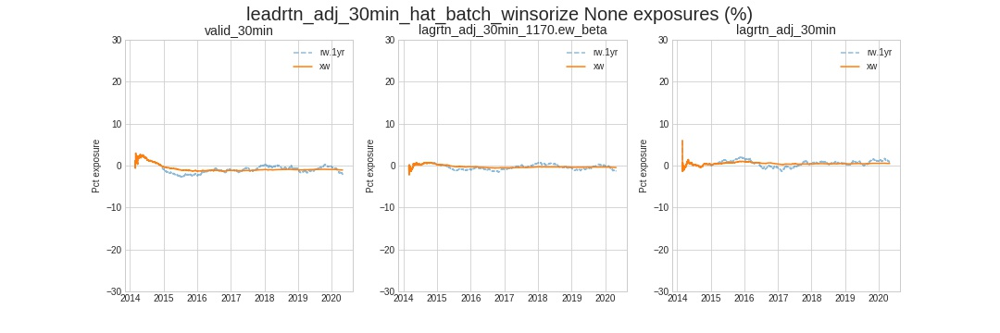

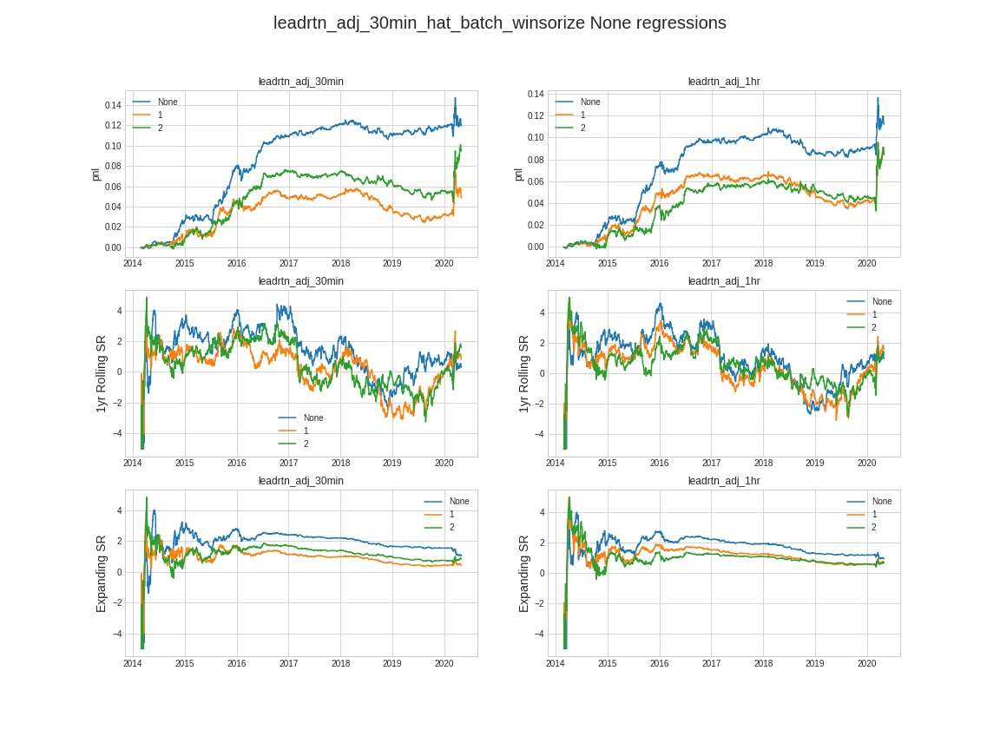

In [21]:
# online learning 
#################

%inline
data = xa.load_dataarray(f'/home/fj/local/checkpoints/StatFacRunner_79d854dd5/output_data.dataarray.netcdf')     


technical_features=[
    'true_range_30min', 'true_range_0D.12h', 'true_range_2D.12h', 'true_range_5D',
    'direction_30min', 'direction_0D.12h', 'direction_2D.12h', 'direction_5D',
    #'delta_rtn_30min', 'delta_rtn_0D.12h', 'delta_rtn_2D.12h', 'delta_rtn_5D',
    'ttp_high_adj_0D.12h', 'ttp_high_adj_2D.12h', 'ttp_high_adj_5D',
    'ttp_low_adj_0D.12h', 'ttp_low_adj_2D.12h', 'ttp_low_adj_5D',    
]
statfacs = mx.HPSet(
    neg_kappa=data.find_mx('/statfac.*_kappa.-5/'),
    no_kappa=data.find_mx('/statfac.*_kappa.None/'),
    pos_kappa=data.find_mx('/statfac.*_kappa.5/'),
    short_win=data.find_mx('/statfac.*_win.65.*/'),
    long_win=data.find_mx('/statfac.*_win.780.*/'),
    features=data.find_mx('/statfac.*/'),
)    

disp( mx.tensorboard.start_server() )
disp( mx.tensorboard.start( clear=True ) )
  
hps.online = mx.HPSet(
    start='20140101',
    end=hps.end,
    features=sorted( set(
        []
        +['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid',  ] 
        + hps.feature_set.lagging 
#         + hps.feature_set.vol 
#         + hps.feature_set.log_volumes
#         #+ hps.feature_set.calendar
#         + hps.feature_set.mkt 
#         + hps.feature_set.betas
#          + hps.feature_set.technical
#          + hps.feature_set.afacs
        + statfacs.features        
    ) ),
    symbol=None,
    target='leadrtn_adj_30min',
    target_shift=None, # advance the target
    lookahead=2,
    ridge=1e-5,
    hl_1 = None,
    hl_2 = None,
    lr = 500,
    kappa=2, # util penalty
    rnn_tv=None, #{1:1, 2:1, 13:1e-1},
    ortho=2,
    ortho_hl=13,
    # orthogonalize out short term mean reversion
    ortho_features = ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day'] + hps.feature_set.betas + statfacs.neg_kappa,
    weight='valid_30min',
    algo='mbprox', 
    # stuff related to sid weighting
    use_omega=None,
    omega_lr = 10,
    omega_ridge = 0,
    omega_shift = 0.1,
    pre_winsorize=0.01,
    batch_demean=False,
    batch_normalize=False,
    transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=[13*5, 13*20, 13*40],  ),
    exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']
)

#--- run a basic configuration ---
if True:
    hpso = hps.online
    runner = OnlineRunner( hps=hpso, verbose=True ).set( memoize=True )
    runner.data = data
    disp( f'Running runner={runner.hash()} with hps={hpso.hash()}', h=2 )
    dfo = runner( )
    disp( hpso )
    for profile in runner.output_meta                    :
        main_fig = profile.pop( 'main_fig' )
        exp_fig = profile.pop( 'exp_fig' )
        reg_fig = profile.pop( 'reg_fig' )
        reg_df = profile.pop( 'regressions' )
        if not reg_df.empty:
            reg_df = reg_df.set_index( ['returns', 'lag'] )
        disp( profile.pop( 'feature' ), profile.pop( 'transform' ), h=3, hr=True )
        # disp( pd.DataFrame( profile, index=['value'] ) )
        disp( 'Regressions', reg_df, h=4 )
        # disp( main_fig )
        disp( exp_fig )
        disp( reg_fig )   

## longer  statfac features - residualization for negative kappa statfacs

,num_calls,duration_total,duration_mean,duration_squared,duration_std
_one_step_in_beta,20683,398.876236,0.019284,3.741635e-04,0.001510
_one_step_in_omega,20683,0.708821,0.000034,1.406804e-09,0.000015


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,11948336,0.891191,-1.054130,0.374384,0.003230,1.043081e-05,9.907271,2.320326,0.713228,0.682503,0.594696
leadrtn_adj_1hr,NaN,11948336,0.891145,-1.054130,0.331858,0.003193,1.019239e-05,10.191184,1.818381,0.713228,0.682503,0.594696
leadrtn_adj_30min,1.0,11948336,0.891149,-3.300273,0.059523,0.000488,2.384186e-07,2.106035,0.503875,0.716811,0.684394,0.596480
leadrtn_adj_1hr,1.0,11948336,0.891103,-3.300273,0.147379,0.001638,2.682209e-06,5.908764,1.214849,0.716811,0.684394,0.596480
leadrtn_adj_30min,2.0,11948336,0.891105,-3.421858,0.132825,0.002100,4.410744e-06,6.418991,1.820659,0.717358,0.684566,0.596305
leadrtn_adj_1hr,2.0,11948336,0.891058,-3.421858,0.170482,0.001292,1.668930e-06,4.277192,0.831512,0.717358,0.684566,0.596305


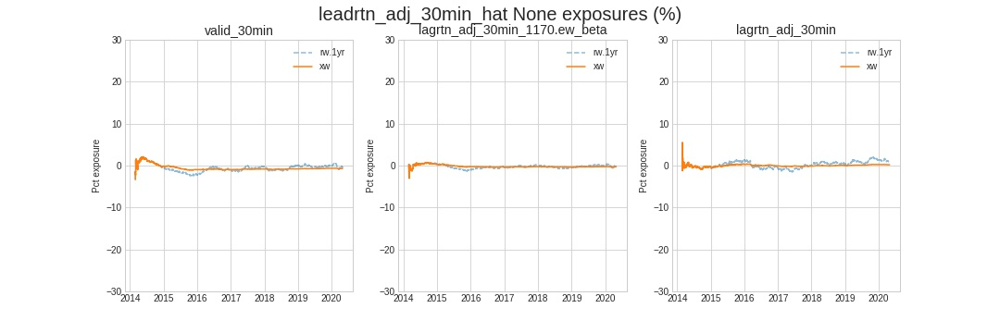

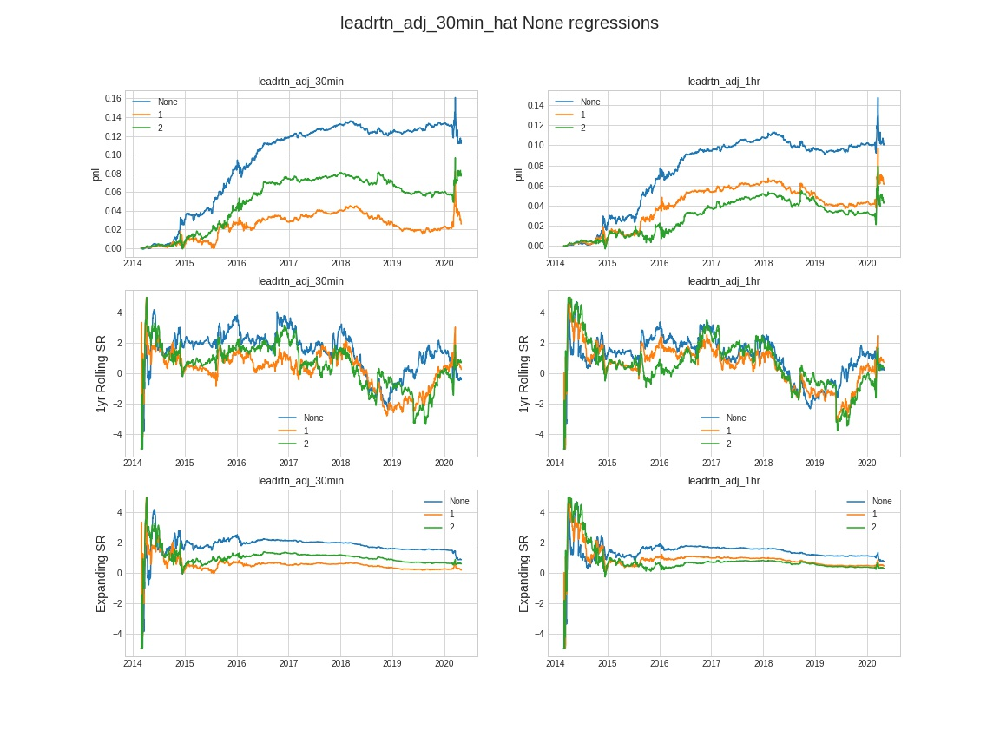

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,11948336,0.891191,-3.667578,0.425993,0.003374,0.000011,10.595265,2.917208,0.712035,0.683612,0.610855
leadrtn_adj_1hr,NaN,11948336,0.891145,-3.667578,0.413438,0.003829,0.000015,12.054542,2.478110,0.712035,0.683612,0.610855
leadrtn_adj_30min,1.0,11948336,0.891149,-6.893338,0.105911,0.001269,0.000002,3.964800,1.068516,0.714547,0.685317,0.611827
leadrtn_adj_1hr,1.0,11948336,0.891103,-6.893338,0.217531,0.002466,0.000006,7.702020,1.686190,0.714547,0.685317,0.611827
leadrtn_adj_30min,2.0,11948336,0.891105,-7.069635,0.174388,0.002114,0.000004,6.325365,1.915154,0.715411,0.685960,0.612131
leadrtn_adj_1hr,2.0,11948336,0.891058,-7.069635,0.262596,0.002251,0.000005,7.076567,1.396145,0.715411,0.685960,0.612131


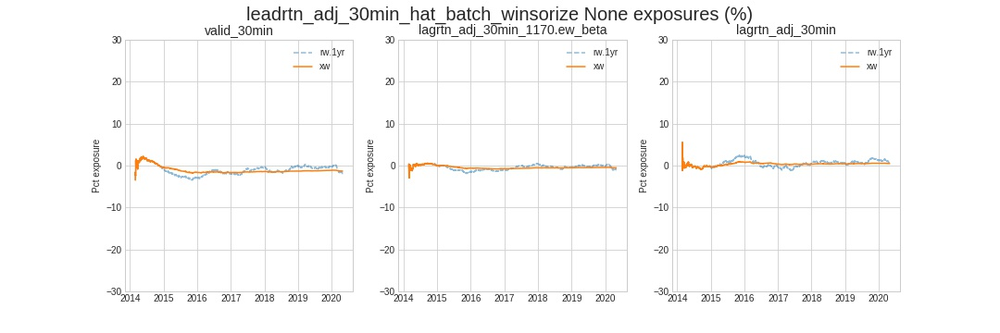

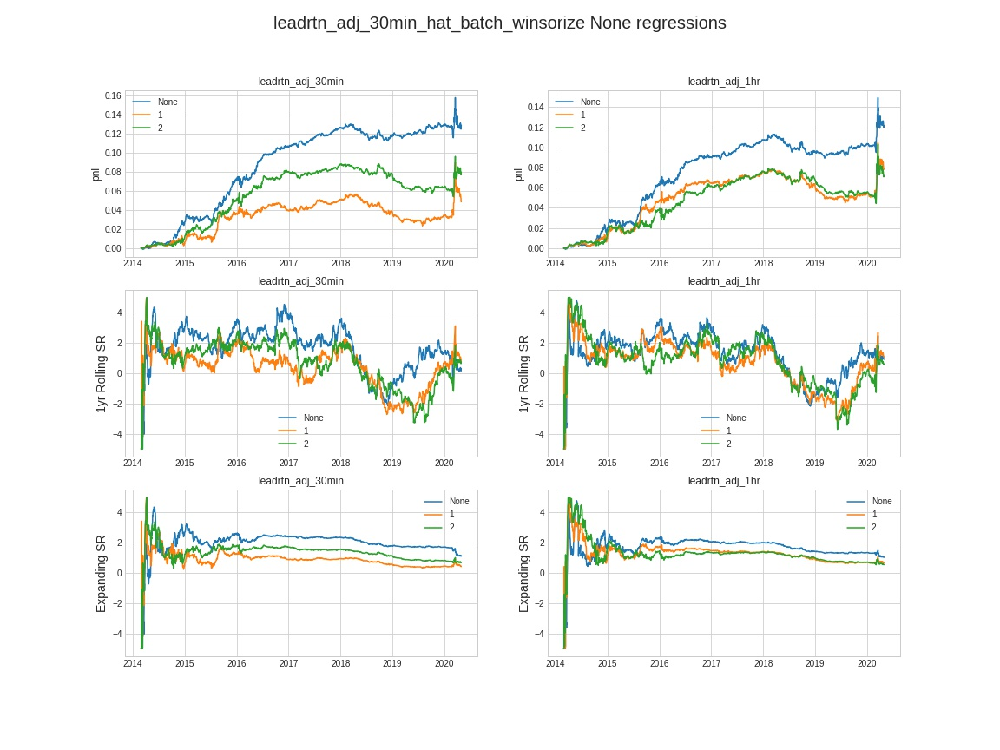

In [22]:
# online learning 
#################

%inline
data = xa.load_dataarray(f'/home/fj/local/checkpoints/StatFacRunner_79d854dd5/output_data.dataarray.netcdf')     


technical_features=[
    'true_range_30min', 'true_range_0D.12h', 'true_range_2D.12h', 'true_range_5D',
    'direction_30min', 'direction_0D.12h', 'direction_2D.12h', 'direction_5D',
    #'delta_rtn_30min', 'delta_rtn_0D.12h', 'delta_rtn_2D.12h', 'delta_rtn_5D',
    'ttp_high_adj_0D.12h', 'ttp_high_adj_2D.12h', 'ttp_high_adj_5D',
    'ttp_low_adj_0D.12h', 'ttp_low_adj_2D.12h', 'ttp_low_adj_5D',    
]
statfacs = mx.HPSet(
    neg_kappa=data.find_mx('/statfac.*_kappa.-5/'),
    no_kappa=data.find_mx('/statfac.*_kappa.None/'),
    pos_kappa=data.find_mx('/statfac.*_kappa.5/'),
    short_win=data.find_mx('/statfac.*_win.65.*/'),
    long_win=data.find_mx('/statfac.*_win.780.*/'),
    features=data.find_mx('/statfac.*/'),
)    

disp( mx.tensorboard.start_server() )
disp( mx.tensorboard.start( clear=True ) )
  
hps.online = mx.HPSet(
    start='20140101',
    end=hps.end,
    features=sorted( set(
        []
        +['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid',  ] 
        + hps.feature_set.lagging 
#         + hps.feature_set.vol 
#         + hps.feature_set.log_volumes
#         #+ hps.feature_set.calendar
#         + hps.feature_set.mkt 
#         + hps.feature_set.betas
#          + hps.feature_set.technical
#          + hps.feature_set.afacs
        + statfacs.long_win 
        + statfacs.short_win        
    ) ),
    symbol=None,
    target='leadrtn_adj_30min',
    target_shift=None, # advance the target
    lookahead=2,
    ridge=1e-5,
    hl_1 = None,
    hl_2 = None,
    lr = 500,
    kappa=2, # util penalty
    rnn_tv=None, #{1:1, 2:1, 13:1e-1},
    ortho=2,
    ortho_hl=13,
    # orthogonalize out short term mean reversion
    ortho_features = ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day'] + hps.feature_set.betas + statfacs.neg_kappa,
    weight='valid_30min',
    algo='mbprox', 
    # stuff related to sid weighting
    use_omega=None,
    omega_lr = 10,
    omega_ridge = 0,
    omega_shift = 0.1,
    pre_winsorize=0.01,
    batch_demean=False,
    batch_normalize=False,
    transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=[13*5, 13*20, 13*40],  ),
    exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']
)

#--- run a basic configuration ---
if True:
    hpso = hps.online
    runner = OnlineRunner( hps=hpso, verbose=True ).set( memoize=True )
    runner.data = data
    disp( f'Running runner={runner.hash()} with hps={hpso.hash()}', h=2 )
    dfo = runner( )
    disp( hpso )
    for profile in runner.output_meta                    :
        main_fig = profile.pop( 'main_fig' )
        exp_fig = profile.pop( 'exp_fig' )
        reg_fig = profile.pop( 'reg_fig' )
        reg_df = profile.pop( 'regressions' )
        if not reg_df.empty:
            reg_df = reg_df.set_index( ['returns', 'lag'] )
        disp( profile.pop( 'feature' ), profile.pop( 'transform' ), h=3, hr=True )
        # disp( pd.DataFrame( profile, index=['value'] ) )
        disp( 'Regressions', reg_df, h=4 )
        # disp( main_fig )
        disp( exp_fig )
        disp( reg_fig )   

# Statfacs wtih hl1, hl2

,num_calls,duration_total,duration_mean,duration_squared,duration_std
_one_step_in_beta,20683,858.702058,0.041515,1.735904e-03,0.003519
_one_step_in_omega,20683,0.673895,0.000033,1.271951e-09,0.000015


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,11948336,0.891191,-0.805494,0.336466,0.003098,9.596348e-06,9.831083,2.491249,0.639584,0.603860,0.546407
leadrtn_adj_1hr,NaN,11948336,0.891145,-0.805494,0.228012,0.001674,2.801418e-06,5.810083,1.147718,0.639584,0.603860,0.546407
leadrtn_adj_30min,1.0,11948336,0.891149,-0.762819,0.010444,-0.000345,1.192093e-07,-1.432142,-0.380078,0.646470,0.608701,0.550387
leadrtn_adj_1hr,1.0,11948336,0.891103,-0.762819,0.004662,-0.000810,6.556511e-07,-2.096681,-0.416208,0.646470,0.608701,0.550387
leadrtn_adj_30min,2.0,11948336,0.891105,-0.750830,0.051441,0.000345,-1.192093e-07,1.403483,0.357694,0.647418,0.609684,0.550751
leadrtn_adj_1hr,2.0,11948336,0.891058,-0.750830,0.114853,-0.000977,9.536743e-07,-2.144996,-0.426589,0.647418,0.609684,0.550751


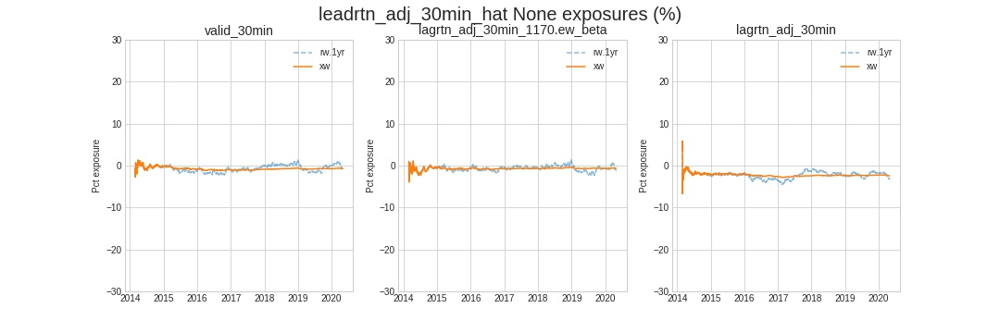

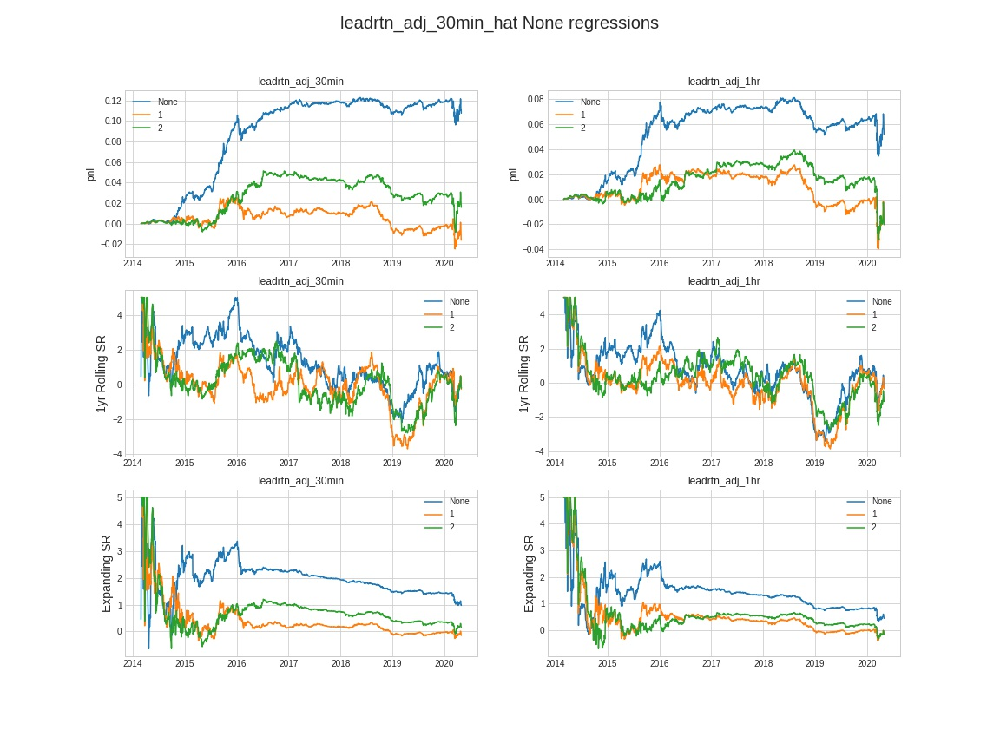

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,11948336,0.891191,-1.985535,0.341169,0.002740,7.510185e-06,8.561294,2.482023,0.688241,0.649881,0.589682
leadrtn_adj_1hr,NaN,11948336,0.891145,-1.985535,0.224061,0.001337,1.788139e-06,4.802756,1.076826,0.688241,0.649881,0.589682
leadrtn_adj_30min,1.0,11948336,0.891149,-1.944383,-0.003499,-0.000244,5.960464e-08,-1.434205,-0.431252,0.692640,0.653316,0.591901
leadrtn_adj_1hr,1.0,11948336,0.891103,-1.944383,-0.024575,-0.000772,5.960464e-07,-1.836958,-0.417715,0.692640,0.653316,0.591901
leadrtn_adj_30min,2.0,11948336,0.891105,-1.929702,0.014133,0.000488,-2.384186e-07,1.103842,0.323605,0.693541,0.654342,0.592744
leadrtn_adj_1hr,2.0,11948336,0.891058,-1.929702,0.096612,-0.000691,4.768372e-07,-1.194233,-0.278743,0.693541,0.654342,0.592744


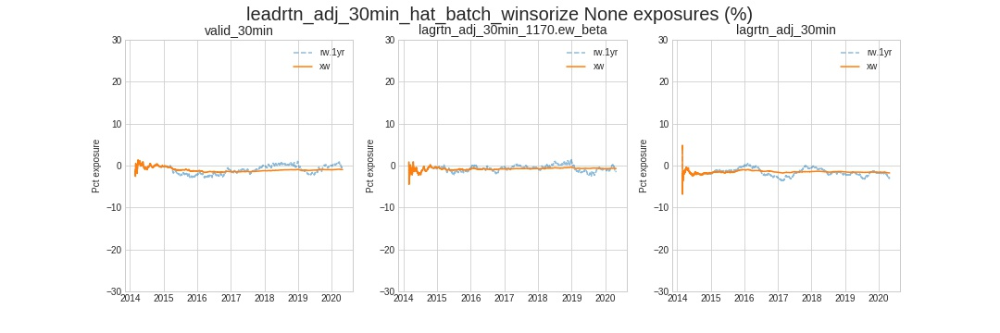

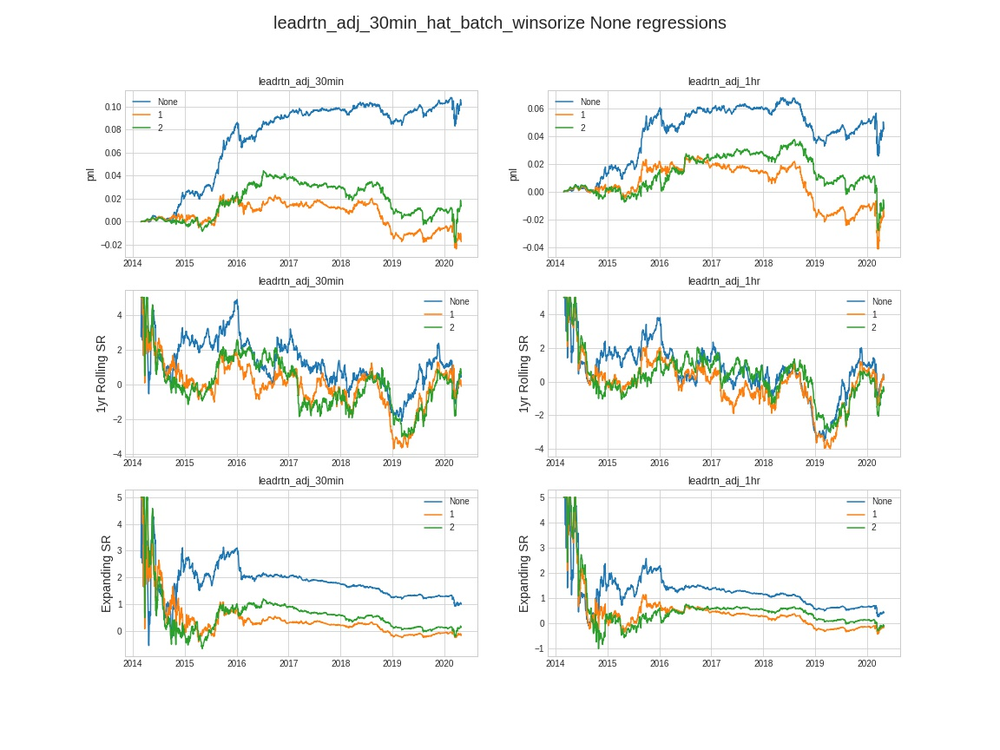

In [23]:
# online learning 
#################

%inline
data = xa.load_dataarray(f'/home/fj/local/checkpoints/StatFacRunner_79d854dd5/output_data.dataarray.netcdf')     


technical_features=[
    'true_range_30min', 'true_range_0D.12h', 'true_range_2D.12h', 'true_range_5D',
    'direction_30min', 'direction_0D.12h', 'direction_2D.12h', 'direction_5D',
    #'delta_rtn_30min', 'delta_rtn_0D.12h', 'delta_rtn_2D.12h', 'delta_rtn_5D',
    'ttp_high_adj_0D.12h', 'ttp_high_adj_2D.12h', 'ttp_high_adj_5D',
    'ttp_low_adj_0D.12h', 'ttp_low_adj_2D.12h', 'ttp_low_adj_5D',    
]
statfacs = mx.HPSet(
    neg_kappa=data.find_mx('/statfac.*_kappa.-5/'),
    no_kappa=data.find_mx('/statfac.*_kappa.None/'),
    pos_kappa=data.find_mx('/statfac.*_kappa.5/'),
    short_win=data.find_mx('/statfac.*_win.65.*/'),
    long_win=data.find_mx('/statfac.*_win.780.*/'),
    features=data.find_mx('/statfac.*/'),
)    

disp( mx.tensorboard.start_server() )
disp( mx.tensorboard.start( clear=True ) )
  
hps.online = mx.HPSet(
    start='20140101',
    end=hps.end,
    features=sorted( set(
        []
        +['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid',  ] 
        + hps.feature_set.lagging 
#         + hps.feature_set.vol 
#         + hps.feature_set.log_volumes
#         #+ hps.feature_set.calendar
#         + hps.feature_set.mkt 
#         + hps.feature_set.betas
#          + hps.feature_set.technical
#          + hps.feature_set.afacs
#         + statfacs.long_win 
#         + statfacs.short_win        
        + statfacs.features
    ) ),
    symbol=None,
    target='leadrtn_adj_30min',
    target_shift=None, # advance the target
    lookahead=2,
    ridge=1e-5,
    hl_1 = 50,
    hl_2 = 1000,
    lr = 500,
    kappa=2, # util penalty
    rnn_tv=None, #{1:1, 2:1, 13:1e-1},
    ortho=2,
    ortho_hl=13,
    # orthogonalize out short term mean reversion
    ortho_features = ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day'] + hps.feature_set.betas + statfacs.features,
    weight='valid_30min',
    algo='mbprox', 
    # stuff related to sid weighting
    use_omega=None,
    omega_lr = 10,
    omega_ridge = 0,
    omega_shift = 0.1,
    pre_winsorize=0.01,
    batch_demean=False,
    batch_normalize=False,
    transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=[13*5, 13*20, 13*40],  ),
    exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']
)

#--- run a basic configuration ---
if True:
    hpso = hps.online
    runner = OnlineRunner( hps=hpso, verbose=True ).set( memoize=True )
    runner.data = data
    disp( f'Running runner={runner.hash()} with hps={hpso.hash()}', h=2 )
    dfo = runner( )
    disp( hpso )
    for profile in runner.output_meta                    :
        main_fig = profile.pop( 'main_fig' )
        exp_fig = profile.pop( 'exp_fig' )
        reg_fig = profile.pop( 'reg_fig' )
        reg_df = profile.pop( 'regressions' )
        if not reg_df.empty:
            reg_df = reg_df.set_index( ['returns', 'lag'] )
        disp( profile.pop( 'feature' ), profile.pop( 'transform' ), h=3, hr=True )
        # disp( pd.DataFrame( profile, index=['value'] ) )
        disp( 'Regressions', reg_df, h=4 )
        # disp( main_fig )
        disp( exp_fig )
        disp( reg_fig )   

## All features with statfacs (see below for baseline)
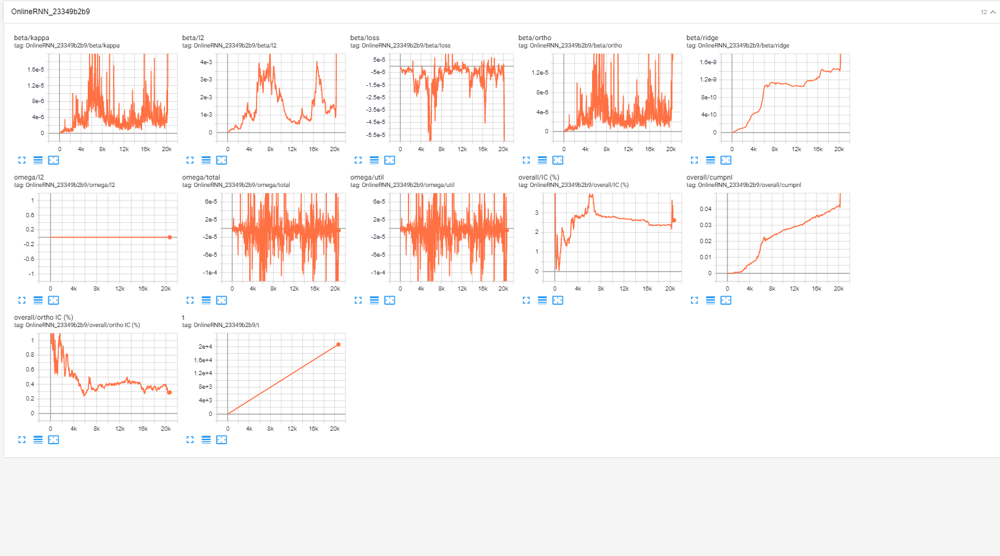

In [ ]:
# online learning
#################

from research.etf_technical import online_runner as reor; reload(reor)
reload(reor)

%inline
data = xa.load_dataarray(
    f'/home/fj/local/checkpoints/StatFacRunner_79d854dd5/output_data.dataarray.netcdf'
)

technical_features = [
    'true_range_30min',
    'true_range_0D.12h',
    'true_range_2D.12h',
    'true_range_5D',
    'direction_30min',
    'direction_0D.12h',
    'direction_2D.12h',
    'direction_5D',
    #'delta_rtn_30min', 'delta_rtn_0D.12h', 'delta_rtn_2D.12h', 'delta_rtn_5D',
    'ttp_high_adj_0D.12h',
    'ttp_high_adj_2D.12h',
    'ttp_high_adj_5D',
    'ttp_low_adj_0D.12h',
    'ttp_low_adj_2D.12h',
    'ttp_low_adj_5D',
]
statfacs = mx.HPSet(
    neg_kappa=data.find_mx('/statfac.*_kappa.-5/'),
    no_kappa=data.find_mx('/statfac.*_kappa.None/'),
    pos_kappa=data.find_mx('/statfac.*_kappa.5/'),
    short_win=data.find_mx('/statfac.*_win.65.*/'),
    long_win=data.find_mx('/statfac.*_win.780.*/'),
    features=data.find_mx('/statfac.*/'),
)

disp(mx.tensorboard.start_server())
disp(mx.tensorboard.start(clear=True))

hps.online = mx.HPSet(
    start='20140101',
    end=hps.end,
    batch_size=1000,
    features=sorted( set(
        [] 
        + ['open_unadj_30min','log_open_unadj_30min', 'lagrtn_adj_30min_resid', ] 
        + hps.feature_set.lagging 
        + hps.feature_set.vol 
        + hps.feature_set.log_volumes
        #         #+ hps.feature_set.calendar
        + hps.feature_set.mkt 
        + hps.feature_set.betas
        #          + hps.feature_set.technical
        #          + hps.feature_set.afacs
        + technical_features
        #         + statfacs.long_win
        #         + statfacs.short_win
        + statfacs.no_kappa
    ) ),
    symbol=None,
    target='leadrtn_adj_30min',
    target_shift=None,  # advance the targetc
    lookahead=2,
    ridge=1e-5,
    hl_1=50,
    hl_2=1000,
    lr=500,
    kappa=2,  # util penalty
    rnn_tv=None,  #{1:1, 2:1, 13:1e-1},
    ortho=2,
    ortho_hl=13,
    # orthogonalize out short term mean reversion
    ortho_features=['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day'] +
    hps.feature_set.betas + statfacs.features,
    weight='valid_30min',
    algo='mbprox',
    # stuff related to sid weighting
    use_omega='P',
    omega_lr=10,
    omega_ridge=0,
    omega_shift=0.1,
    pre_winsorize=0.01,
    batch_demean=False,
    batch_normalize=False,
    transformer=mx.HPSet(
        pre_normalize=True,
        quadratic=True,
        post_normalize=True,
        ema_halflifes=[13 * 5, 13 * 20, 13 * 40],
    ),
    exposures=[
        'valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min'
    ])

#--- run a basic configuration ---
if True:
    hpso = hps.online
    runner = reor.OnlineRunner(hps=hpso, verbose=True).set(memoize=False)
    runner.data = data
    disp(f'Running runner={runner.hash()} with hps={hpso.hash()}', h=2)
    dfo = runner()
    disp(hpso)
    for profile in runner.output_meta:
        main_fig = profile.pop('main_fig')
        exp_fig = profile.pop('exp_fig')
        reg_fig = profile.pop('reg_fig')
        reg_df = profile.pop('regressions')
        if not reg_df.empty:
            reg_df = reg_df.set_index(['returns', 'lag'])
        disp(profile.pop('feature'), profile.pop('transform'), h=3, hr=True)
        # disp( pd.DataFrame( profile, index=['value'] ) )
        disp('Regressions', reg_df, h=4)
        # disp( main_fig )
        disp(exp_fig)
        disp(reg_fig)

## All features without statfacs (baseline)
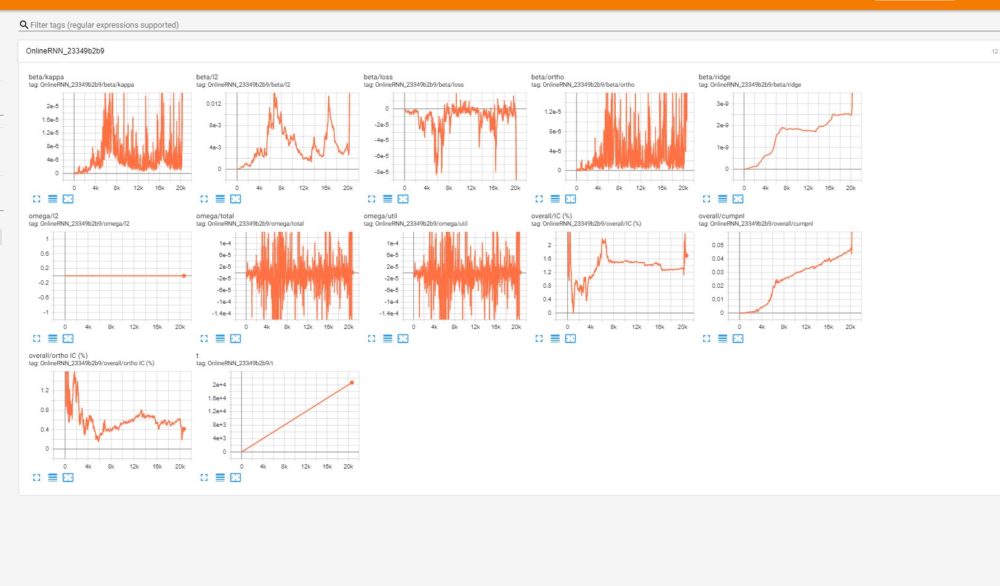

In [ ]:
# online learning
#################

from research.etf_technical import online_runner as reor; reload(reor)
reload(reor)

%inline
data = xa.load_dataarray(
    f'/home/fj/local/checkpoints/StatFacRunner_79d854dd5/output_data.dataarray.netcdf'
)

technical_features = [
    'true_range_30min',
    'true_range_0D.12h',
    'true_range_2D.12h',
    'true_range_5D',
    'direction_30min',
    'direction_0D.12h',
    'direction_2D.12h',
    'direction_5D',
    #'delta_rtn_30min', 'delta_rtn_0D.12h', 'delta_rtn_2D.12h', 'delta_rtn_5D',
    'ttp_high_adj_0D.12h',
    'ttp_high_adj_2D.12h',
    'ttp_high_adj_5D',
    'ttp_low_adj_0D.12h',
    'ttp_low_adj_2D.12h',
    'ttp_low_adj_5D',
]
statfacs = mx.HPSet(
    neg_kappa=data.find_mx('/statfac.*_kappa.-5/'),
    no_kappa=data.find_mx('/statfac.*_kappa.None/'),
    pos_kappa=data.find_mx('/statfac.*_kappa.5/'),
    short_win=data.find_mx('/statfac.*_win.65.*/'),
    long_win=data.find_mx('/statfac.*_win.780.*/'),
    features=data.find_mx('/statfac.*/'),
)

disp(mx.tensorboard.start_server())
disp(mx.tensorboard.start(clear=True))

hps.online = mx.HPSet(
    start='20140101',
    end=hps.end,
    batch_size=1000,
    features=sorted( set(
        [] 
        + ['open_unadj_30min','log_open_unadj_30min', 'lagrtn_adj_30min_resid', ] 
        + hps.feature_set.lagging 
        + hps.feature_set.vol 
        + hps.feature_set.log_volumes
        #         #+ hps.feature_set.calendar
        + hps.feature_set.mkt 
        + hps.feature_set.betas
        #          + hps.feature_set.technical
        #          + hps.feature_set.afacs
        + technical_features
        #         + statfacs.long_win
        #         + statfacs.short_win
        #+ statfacs.no_kappa
    ) ),
    symbol=None,
    target='leadrtn_adj_30min',
    target_shift=None,  # advance the targetc
    lookahead=2,
    ridge=1e-5,
    hl_1=50,
    hl_2=1000,
    lr=500,
    kappa=2,  # util penalty
    rnn_tv=None,  #{1:1, 2:1, 13:1e-1},
    ortho=2,
    ortho_hl=13,
    # orthogonalize out short term mean reversion
    ortho_features=['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day'] + hps.feature_set.betas, #+ statfacs.features,
    weight='valid_30min',
    algo='mbprox',
    # stuff related to sid weighting
    use_omega='P',
    omega_lr=10,
    omega_ridge=0,
    omega_shift=0.1,
    pre_winsorize=0.01,
    batch_demean=False,
    batch_normalize=False,
    transformer=mx.HPSet(
        pre_normalize=True,
        quadratic=True,
        post_normalize=True,
        ema_halflifes=[13 * 5, 13 * 20, 13 * 40],
    ),
    exposures=[
        'valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min'
    ])

#--- run a basic configuration ---
if True:
    hpso = hps.online
    runner = reor.OnlineRunner(hps=hpso, verbose=True).set(memoize=False)
    runner.data = data
    disp(f'Running runner={runner.hash()} with hps={hpso.hash()}', h=2)
    dfo = runner()
    disp(hpso)
    for profile in runner.output_meta:
        main_fig = profile.pop('main_fig')
        exp_fig = profile.pop('exp_fig')
        reg_fig = profile.pop('reg_fig')
        reg_df = profile.pop('regressions')
        if not reg_df.empty:
            reg_df = reg_df.set_index(['returns', 'lag'])
        disp(profile.pop('feature'), profile.pop('transform'), h=3, hr=True)
        # disp( pd.DataFrame( profile, index=['value'] ) )
        disp('Regressions', reg_df, h=4)
        # disp( main_fig )
        disp(exp_fig)
        disp(reg_fig)